# Packages

In [1]:
# install.packages("ggplot2")
# install.packages("lmtest")
# install.packages("olsrr")
# install.packages("MASS")
# install.packages("factoextra")
# install.packages("psych")
# install.packages("nFactors")
# install.packages("readxl")
# install.packages("corrplot")
# install.packages("tidyverse")
# install.packages("readr")
# install.packages("FactoClass")
# install.packages("purrr")
# install.packages("kableExtra")
# install.packages("NbClust")
# install.packages("cluster")
# install.packages("dendextend")
# install.packages("GGally")
# install.packages("dplyr")
# install.packages("nFactors")
# library(ggplot2)
# library(lmtest)
# library(olsrr)
# library(MASS)
# library(factoextra)
# library(psych)
# library(nFactors)
# library(readxl)
# library(corrplot)
# library(tidyverse)
# library(readr)
# library(FactoClass)
# library(purrr)
# library(kableExtra)
# library(NbClust)
# library(cluster)
# library(dendextend)
# library(readr)
# library(GGally)
# library(dplyr)
# library(nFactors)

In [2]:
# install.packages("patchwork")
# install.packages("aplpack")

# library(patchwork)

# Reading exploring and cleaning

In [1]:
library(readr)

wine = read_csv('data/whinequality.csv') # , header=TRUE, sep=',', stringsAsFactors=FALSE)
wine$type = as.factor(wine$type)
head(wine)
tail(wine)

Rows: 6497 Columns: 13
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (1): type
dbl (12): fixed acidity, volatile acidity, citric acid, residual sugar, chlo...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
7.0,0.17,0.74,12.8,0.045,24,126,0.99420,3.26,0.38,12.2,8,white
7.7,0.64,0.21,2.2,0.077,32,133,0.99560,3.27,0.45,9.9,5,red
6.8,0.39,0.34,7.4,0.020,38,133,0.99212,3.18,0.44,12.0,7,white
6.3,0.28,0.47,11.2,0.040,61,183,0.99592,3.12,0.51,9.5,6,white
7.4,0.35,0.20,13.9,0.054,63,229,0.99888,3.11,0.50,8.9,6,white
7.2,0.53,0.14,2.1,0.064,15,29,0.99323,3.35,0.61,12.1,6,red


fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
8.0,0.34,0.49,9.00,0.033,39,180,0.99360,3.13,0.38,12.3,8,white
7.6,0.32,0.58,16.75,0.050,43,163,0.99990,3.15,0.54,9.2,5,white
5.6,0.28,0.27,3.90,0.043,52,158,0.99202,3.35,0.44,10.7,7,white
6.4,0.37,0.20,5.60,0.117,61,183,0.99459,3.24,0.43,9.5,5,white
6.5,0.26,0.50,8.00,0.051,46,197,0.99536,3.18,0.47,9.5,5,white
7.2,0.62,0.06,2.70,0.077,15,85,0.99746,3.51,0.54,9.5,5,red


### Exploring

In [2]:
summary(wine)

 fixed acidity    volatile acidity  citric acid     residual sugar  
 Min.   : 3.800   Min.   :0.0800   Min.   :0.0000   Min.   : 0.600  
 1st Qu.: 6.400   1st Qu.:0.2300   1st Qu.:0.2500   1st Qu.: 1.800  
 Median : 7.000   Median :0.2900   Median :0.3100   Median : 3.000  
 Mean   : 7.215   Mean   :0.3397   Mean   :0.3186   Mean   : 5.443  
 3rd Qu.: 7.700   3rd Qu.:0.4000   3rd Qu.:0.3900   3rd Qu.: 8.100  
 Max.   :15.900   Max.   :1.5800   Max.   :1.6600   Max.   :65.800  
   chlorides       free sulfur dioxide total sulfur dioxide    density      
 Min.   :0.00900   Min.   :  1.00      Min.   :  6.0        Min.   :0.9871  
 1st Qu.:0.03800   1st Qu.: 17.00      1st Qu.: 77.0        1st Qu.:0.9923  
 Median :0.04700   Median : 29.00      Median :118.0        Median :0.9949  
 Mean   :0.05603   Mean   : 30.53      Mean   :115.7        Mean   :0.9947  
 3rd Qu.:0.06500   3rd Qu.: 41.00      3rd Qu.:156.0        3rd Qu.:0.9970  
 Max.   :0.61100   Max.   :289.00      Max.   :440.0   

In [3]:
na <- colSums(is.na(wine))
na

fixed acidity     volatile acidity          citric acid 
                   0                    0                    0 
      residual sugar            chlorides  free sulfur dioxide 
                   0                    0                    0 
total sulfur dioxide              density                   pH 
                   0                    0                    0 
           sulphates              alcohol              quality 
                   0                    0                    0 
                type 
                   0

In [4]:
normalize_data <- function(x) {
  return ((x - min(x)) / (max(x) - min(x)))
}
wine_norm <- as.data.frame(lapply(wine[,1:12], normalize_data))
head(wine_norm)

,fixed.acidity,volatile.acidity,citric.acid,residual.sugar,chlorides,free.sulfur.dioxide,total.sulfur.dioxide,density,pH,sulphates,alcohol,quality
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.2644628,0.0600000,0.44578313,0.18711656,0.05980066,0.07986111,0.27649770,0.13668787,0.4186047,0.08988764,0.6086957,0.8333333
2,0.3223140,0.3733333,0.12650602,0.02453988,0.11295681,0.10763889,0.29262673,0.16367843,0.4263566,0.12921348,0.2753623,0.3333333
3,0.2479339,0.2066667,0.20481928,0.10429448,0.01827243,0.12847222,0.29262673,0.09658762,0.3565891,0.12359551,0.5797101,0.6666667
4,0.2066116,0.1333333,0.28313253,0.16257669,0.05149502,0.20833333,0.40783410,0.16984770,0.3100775,0.16292135,0.2173913,0.5000000
5,0.2975207,0.1800000,0.12048193,0.20398773,0.07475083,0.21527778,0.51382488,0.22691344,0.3023256,0.15730337,0.1304348,0.5000000
6,0.2809917,0.3000000,0.08433735,0.02300613,0.09136213,0.04861111,0.05299539,0.11798728,0.4883721,0.21910112,0.5942029,0.5000000


In [5]:
zwine <- as.data.frame(scale(wine[,1:12]))

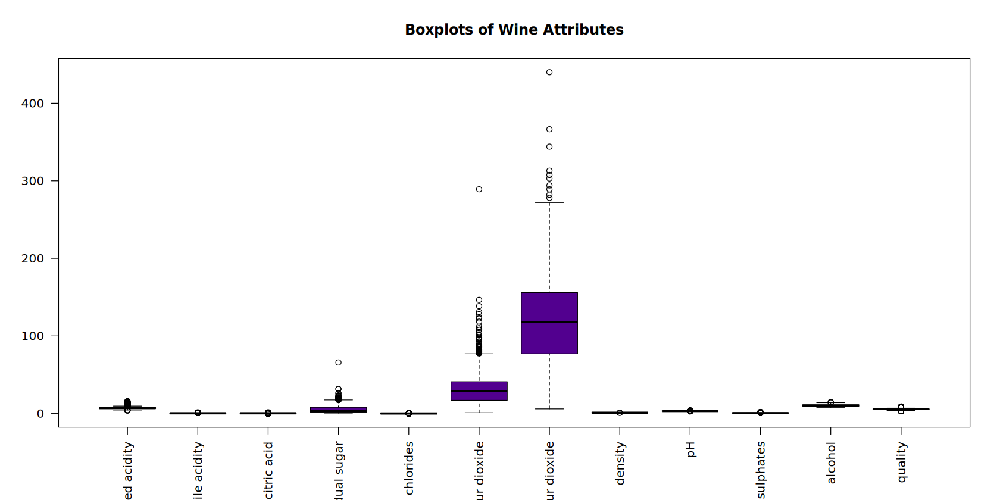

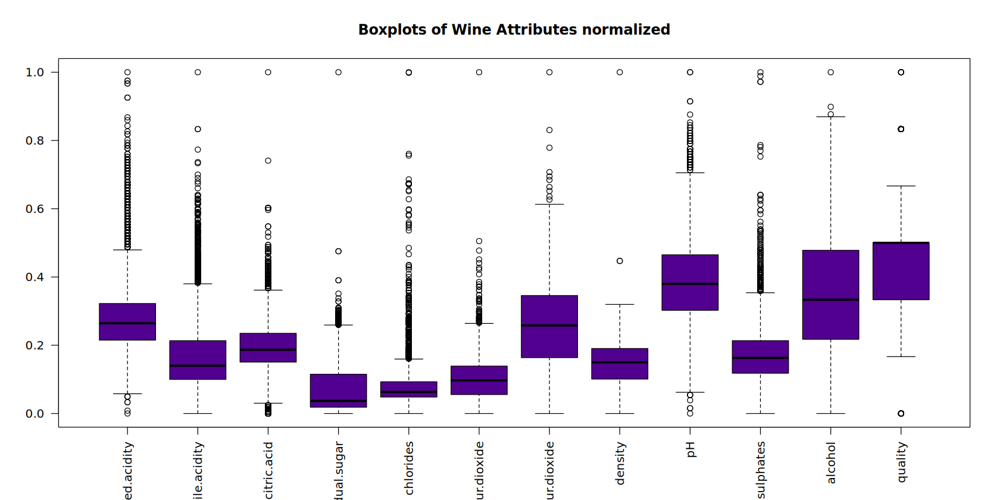

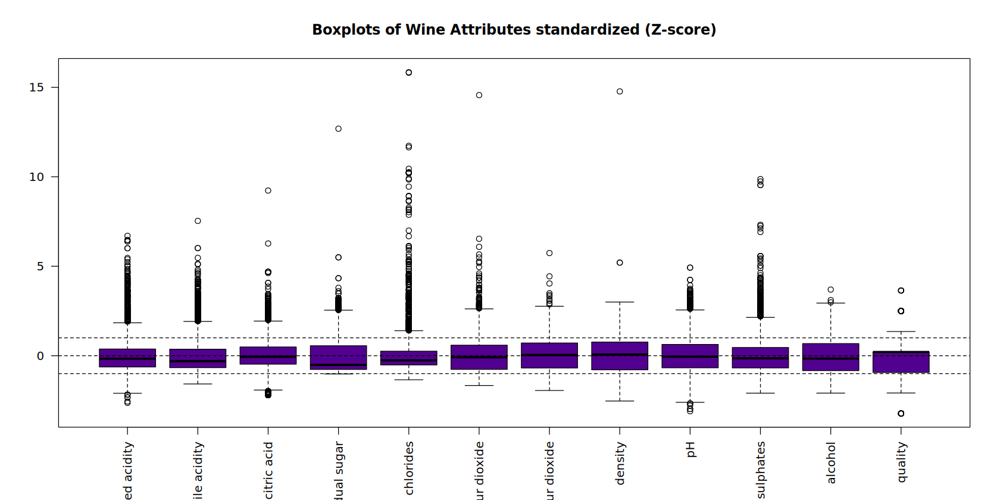

In [6]:
options(repr.plot.width = 14, repr.plot.height = 7)
indigo = rgb(82.5, 0, 143, maxColorValue = 255)




boxplot(wine[,1:12],
         col = indigo,
         las = 2,
         main = "Boxplots of Wine Attributes")

boxplot(wine_norm[,1:12],
         col = indigo,
         las = 2,
         main = "Boxplots of Wine Attributes normalized")
boxplot(zwine[,1:12],
         col = indigo,
         las = 2,
         main = "Boxplots of Wine Attributes standardized (Z-score)")
abline(h = 0, lty = 2)
abline(h = 1, lty = 2)
abline(h = -1, lty = 2)

### Outliers

In [7]:
del_outliers <- function(x, alpha= 0.25, beta=2.1) {
   Q1 <- quantile(x, alpha)
   Q3 <- quantile(x, 1 - alpha)
   IQR <- Q3 - Q1
   x > (Q1 - beta * IQR) & x < (Q3 + beta * IQR)
}

In [8]:
clean_wine = wine[apply(sapply(wine[,c(-1, -ncol(wine))], del_outliers), 1, all),]
(nrow(wine) - nrow(clean_wine)) / nrow(wine) * 100 ## Percentage of removed outliers

[1] 8.311528

\<alpha\> was choosen manualy to not remove more than 5%

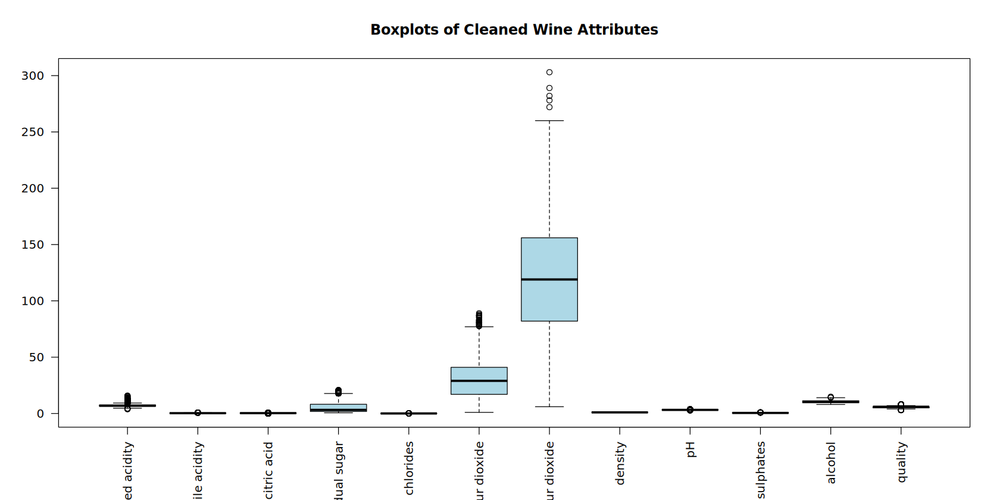

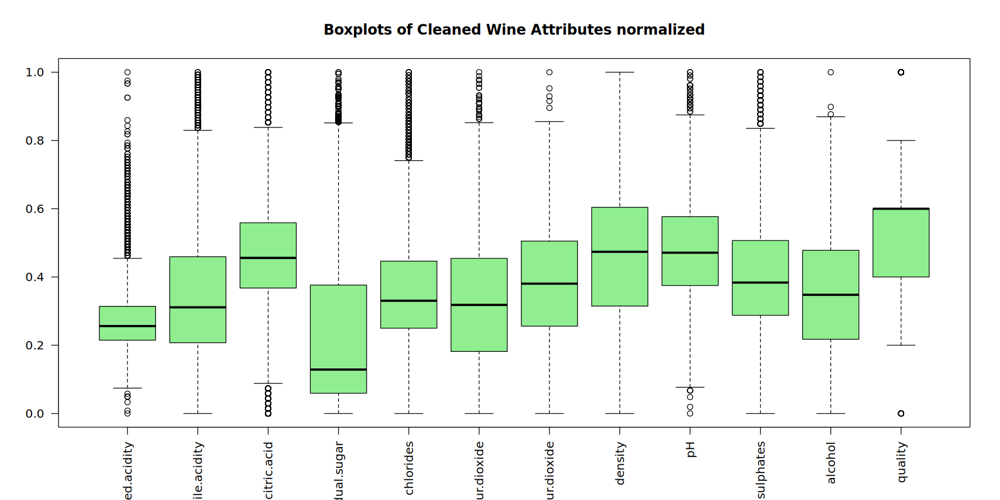

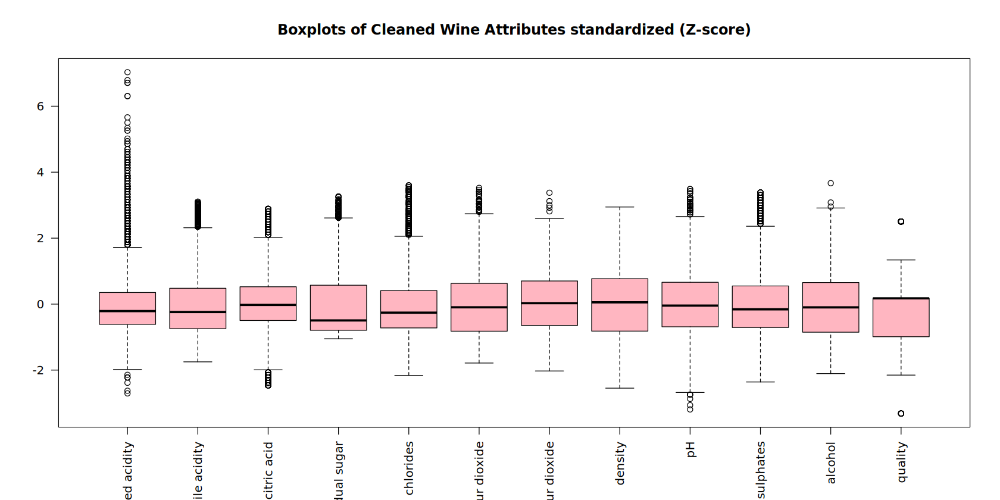

In [9]:
boxplot(clean_wine[,1:12],
         col = "lightblue",
         las = 2,
         main = "Boxplots of Cleaned Wine Attributes")

boxplot(as.data.frame(lapply(clean_wine[,1:12], normalize_data)),
         col = "lightgreen",
         las = 2,
         main = "Boxplots of Cleaned Wine Attributes normalized")

boxplot(as.data.frame(scale(clean_wine[,1:12])),
         col = "lightpink",
         las = 2,
         main = "Boxplots of Cleaned Wine Attributes standardized (Z-score)")

### Setting general datasets

In [10]:
wine = clean_wine
wine_norm = as.data.frame(lapply(wine[,1:12], normalize_data))
wine_norm$type = wine$type
wine_z = as.data.frame(scale(wine[,1:12]))
wine_z$type = wine$type

red = wine[wine$type == 'red', 1:12]
red_glob_norm = wine_norm[wine_norm$type == 'red', 1:12]
red_glob_z = wine_z[wine_z$type == 'red', 1:12]

white = wine[wine$type == 'white', 1:12]
white_glob_norm = wine_norm[wine_norm$type == 'white', 1:12]
white_glob_z = wine_z[wine_z$type == 'white', 1:12]

### Separate boxplot

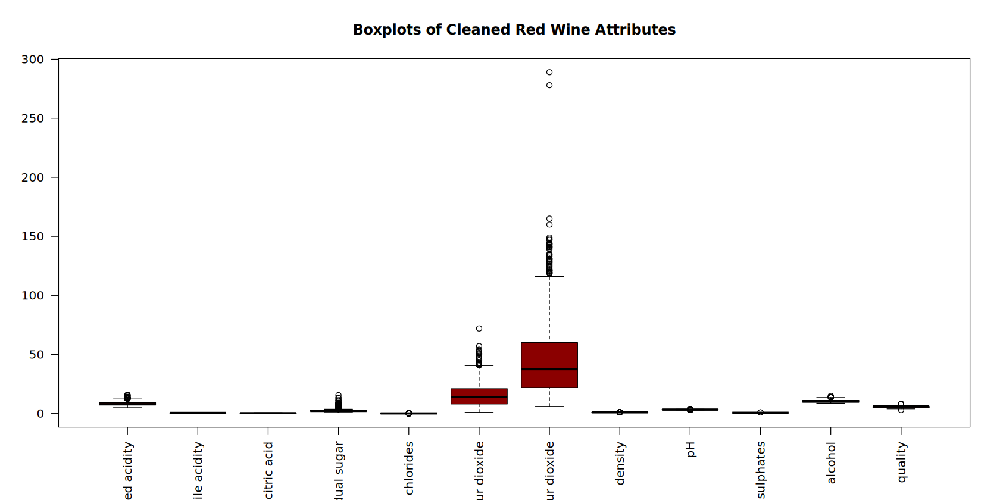

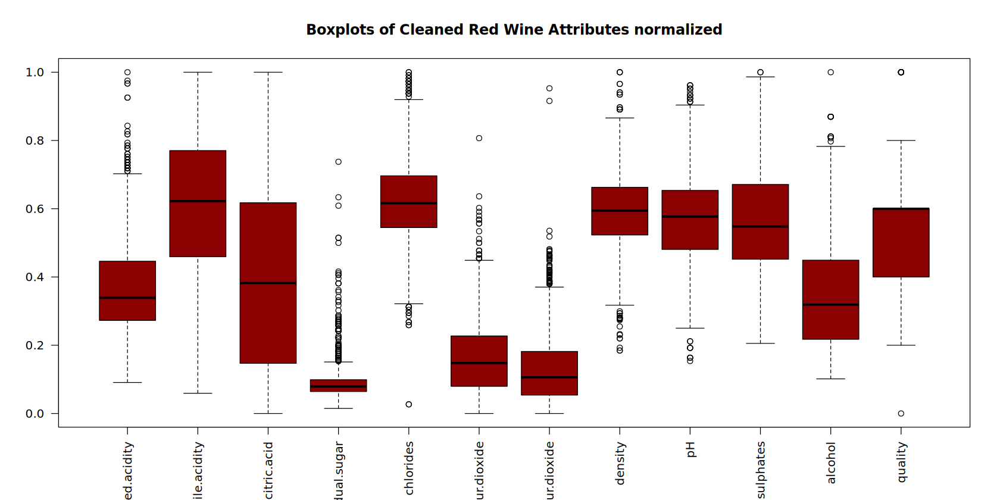

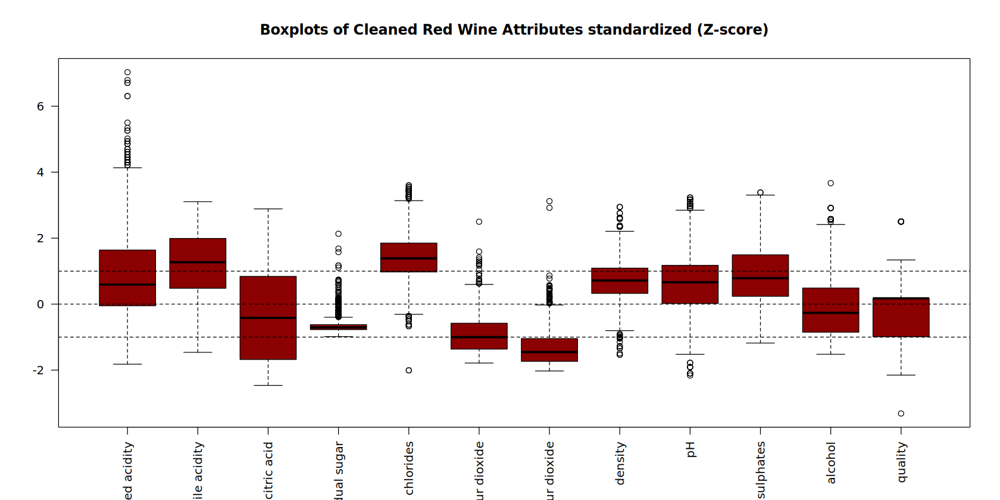

In [11]:
boxplot(red,
         col = "DarkRed",
         las = 2,
         main = "Boxplots of Cleaned Red Wine Attributes")

boxplot(red_glob_norm,
         col = "DarkRed",
         las = 2,
         main = "Boxplots of Cleaned Red Wine Attributes normalized")

boxplot(red_glob_z,
         col = "DarkRed",
         las = 2,
         main = "Boxplots of Cleaned Red Wine Attributes standardized (Z-score)")

abline(h = 0, lty = 2)
abline(h = 1, lty = 2)
abline(h = -1, lty = 2)

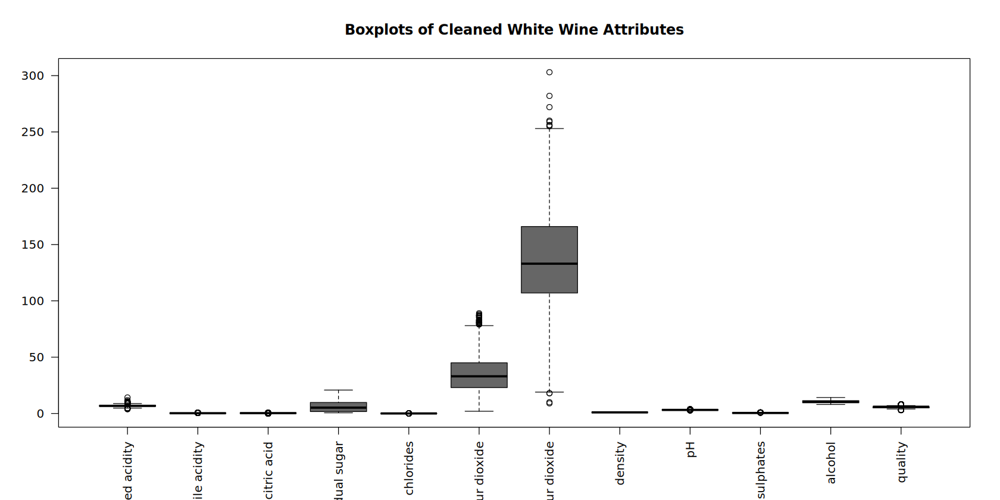

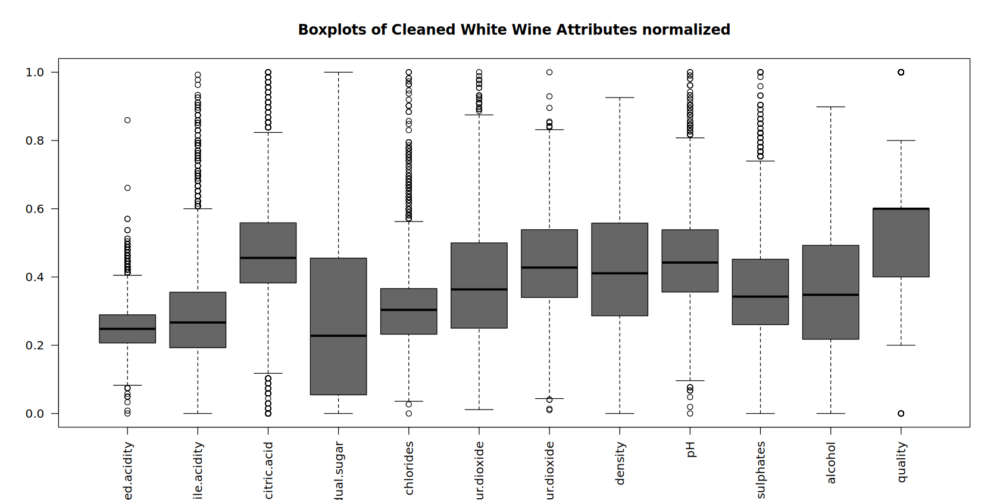

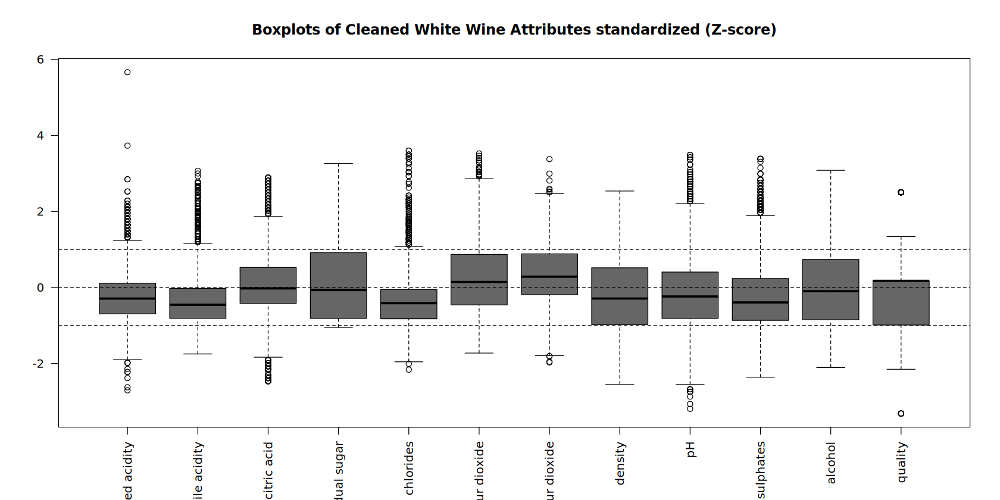

In [12]:
boxplot(white,
         col = "gray40",
         las = 2,
         main = "Boxplots of Cleaned White Wine Attributes")

boxplot(white_glob_norm,
         col = "gray40",
         las = 2,
         main = "Boxplots of Cleaned White Wine Attributes normalized")

boxplot(white_glob_z,
         col = "gray40",
         las = 2,
         main = "Boxplots of Cleaned White Wine Attributes standardized (Z-score)")

abline(h = 0, lty = 2)
abline(h = 1, lty = 2)
abline(h = -1, lty = 2)

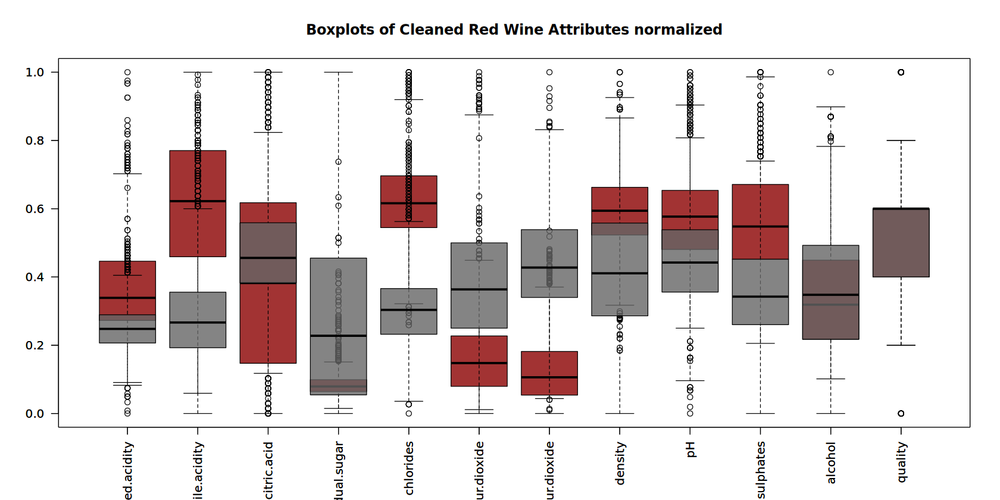

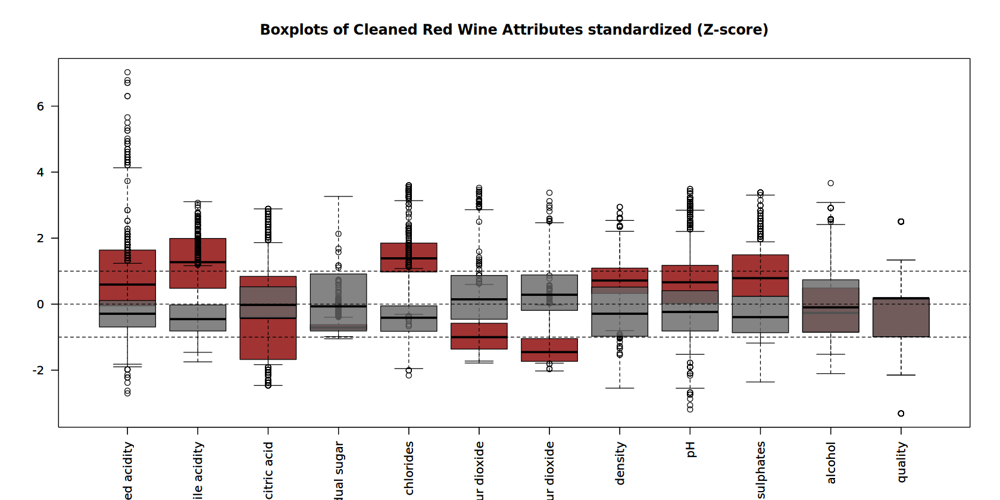

In [13]:
alph = 0.8
boxplot(red_glob_norm,
         col = adjustcolor("DarkRed", alpha.f = alph),
         las = 2,
         main = "Boxplots of Cleaned Red Wine Attributes normalized")

boxplot(white_glob_norm,
         col = adjustcolor("gray40", alpha.f = alph),
         las = 2,
         main = "Boxplots of Cleaned White Wine Attributes normalized",
         add = TRUE)

boxplot(red_glob_z,
         col = adjustcolor("DarkRed", alpha.f = alph),
         las = 2,
         main = "Boxplots of Cleaned Red Wine Attributes standardized (Z-score)")

boxplot(white_glob_z,
         col = adjustcolor("gray40", alpha.f = alph),
         las = 2,
         main = "Boxplots of Cleaned White Wine Attributes standardized (Z-score)",
         add = TRUE)

abline(h = 0, lty = 2)
abline(h = 1, lty = 2)
abline(h = -1, lty = 2)

### Sample datasets

random sample and stratified sambple by type 

In [14]:
library(dplyr)
set.seed(123) 
n <- 500  
wine_sample <- wine[sample(nrow(wine), n), ]
wine_sample_est = wine %>% group_by(type) %>% sample_n(n/2)

red_sample <- wine[wine$type == 'red', ]
red_sample <- red_sample[sample(nrow(red_sample), n), ]
white_sample <- wine[wine$type == 'white', ]
white_sample <- white_sample[sample(nrow(white_sample), n), ]


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [15]:
# wine_sample[wine_sample$type == 'red', ]

# Multilineal Regresion

Lets moldel quality

## Model Selection

### PairsPlot

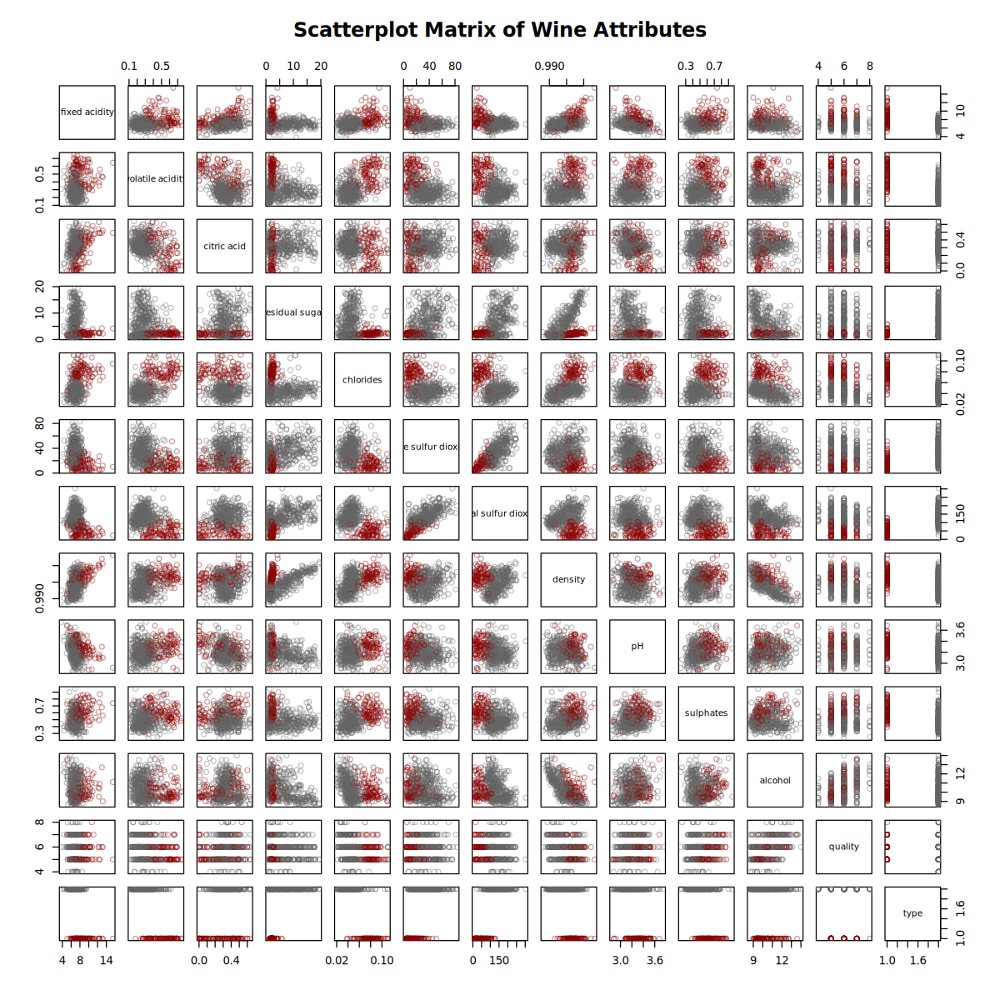

In [16]:
options(repr.plot.width = 10, repr.plot.height = 10)
alph = 0.4
pal = c(adjustcolor("DarkRed", alpha.f = alph), adjustcolor("gray40", alpha.f = alph))
pairs(wine_sample, col = pal[as.numeric(wine_sample$type)],
      main = "Scatterplot Matrix of Wine Attributes")

# legend(
#       x = .94, y = .11,
#       legend = levels(wine$type),
#       col = pal,
#       pch = 19,
#       bty = "n"
# )

### General

In [17]:
null <- lm(quality ~ 1, data = wine)
full <- lm(quality ~ . , data = wine)

#### Mass selection

##### Forward

In [18]:
library(MASS)
mass_forw <- stepAIC(null, direction = "forward", trace = TRUE, scope = list(lower = null, upper = full), )
summary(mass_forw)


Attaching package: ‘MASS’


The following object is masked from ‘package:dplyr’:

    select




Start:  AIC=-1803.66
quality ~ 1

                         Df Sum of Sq    RSS     AIC
+ alcohol                 1    880.78 3518.5 -3132.5
+ density                 1    418.59 3980.7 -2397.3
+ chlorides               1    246.22 4153.1 -2144.8
+ `volatile acidity`      1    226.71 4172.6 -2116.8
+ type                    1     42.02 4357.3 -1858.8
+ `citric acid`           1     31.31 4368.0 -1844.2
+ `fixed acidity`         1     26.73 4372.6 -1838.0
+ `free sulfur dioxide`   1     21.26 4378.1 -1830.5
+ sulphates               1     17.29 4382.0 -1825.1
+ `total sulfur dioxide`  1     10.84 4388.5 -1816.4
+ `residual sugar`        1      8.99 4390.3 -1813.8
+ pH                      1      3.83 4395.5 -1806.8
<none>                                4399.3 -1803.7

Step:  AIC=-3132.48
quality ~ alcohol

                         Df Sum of Sq    RSS     AIC
+ `volatile acidity`      1   202.100 3316.4 -3482.9
+ `free sulfur dioxide`   1   108.598 3409.9 -3317.2
+ `residual sugar`       


Call:
lm(formula = quality ~ alcohol + `volatile acidity` + sulphates + 
    `residual sugar` + `free sulfur dioxide` + `total sulfur dioxide` + 
    type + density + pH + `fixed acidity`, data = wine)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.3323 -0.4795 -0.0401  0.4469  2.7452 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)             1.330e+02  1.689e+01   7.876 4.00e-15 ***
alcohol                 1.992e-01  2.138e-02   9.318  < 2e-16 ***
`volatile acidity`     -1.445e+00  9.209e-02 -15.693  < 2e-16 ***
sulphates               8.858e-01  9.148e-02   9.683  < 2e-16 ***
`residual sugar`        7.210e-02  6.669e-03  10.811  < 2e-16 ***
`free sulfur dioxide`   6.656e-03  8.552e-04   7.784 8.26e-15 ***
`total sulfur dioxide` -1.204e-03  3.393e-04  -3.549 0.000389 ***
typewhite              -4.216e-01  6.179e-02  -6.822 9.85e-12 ***
density                -1.328e+02  1.710e+01  -7.767 9.40e-15 ***
pH                      6.11

##### Backward

In [19]:
mass_back <- stepAIC(full, direction = "backward", trace = TRUE,)
summary(mass_back)

Start:  AIC=-3831.95
quality ~ `fixed acidity` + `volatile acidity` + `citric acid` + 
    `residual sugar` + chlorides + `free sulfur dioxide` + `total sulfur dioxide` + 
    density + pH + sulphates + alcohol + type

                         Df Sum of Sq    RSS     AIC
- `citric acid`           1     0.294 3117.5 -3833.4
- chlorides               1     0.451 3117.6 -3833.1
<none>                                3117.2 -3831.9
- `total sulfur dioxide`  1     6.076 3123.3 -3822.3
- `fixed acidity`         1    17.805 3135.0 -3800.0
- pH                      1    18.732 3135.9 -3798.3
- type                    1    23.799 3141.0 -3788.6
- density                 1    27.376 3144.6 -3781.9
- `free sulfur dioxide`   1    31.569 3148.8 -3773.9
- alcohol                 1    46.022 3163.2 -3746.6
- sulphates               1    48.907 3166.1 -3741.2
- `residual sugar`        1    55.175 3172.4 -3729.4
- `volatile acidity`      1   116.414 3233.6 -3615.5

Step:  AIC=-3833.38
quality ~ `fixed a


Call:
lm(formula = quality ~ `fixed acidity` + `volatile acidity` + 
    `residual sugar` + `free sulfur dioxide` + `total sulfur dioxide` + 
    density + pH + sulphates + alcohol + type, data = wine)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.3323 -0.4795 -0.0401  0.4469  2.7452 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)             1.330e+02  1.689e+01   7.876 4.00e-15 ***
`fixed acidity`         1.037e-01  1.734e-02   5.981 2.35e-09 ***
`volatile acidity`     -1.445e+00  9.209e-02 -15.693  < 2e-16 ***
`residual sugar`        7.210e-02  6.669e-03  10.811  < 2e-16 ***
`free sulfur dioxide`   6.656e-03  8.552e-04   7.784 8.26e-15 ***
`total sulfur dioxide` -1.204e-03  3.393e-04  -3.549 0.000389 ***
density                -1.328e+02  1.710e+01  -7.767 9.40e-15 ***
pH                      6.113e-01  9.746e-02   6.273 3.80e-10 ***
sulphates               8.858e-01  9.148e-02   9.683  < 2e-16 ***
alcohol                 1.99

##### Both

In [20]:
mass_both = stepAIC(full, direction="both", trace=TRUE)
summary(mass_both)

Start:  AIC=-3831.95
quality ~ `fixed acidity` + `volatile acidity` + `citric acid` + 
    `residual sugar` + chlorides + `free sulfur dioxide` + `total sulfur dioxide` + 
    density + pH + sulphates + alcohol + type

                         Df Sum of Sq    RSS     AIC
- `citric acid`           1     0.294 3117.5 -3833.4
- chlorides               1     0.451 3117.6 -3833.1
<none>                                3117.2 -3831.9
- `total sulfur dioxide`  1     6.076 3123.3 -3822.3
- `fixed acidity`         1    17.805 3135.0 -3800.0
- pH                      1    18.732 3135.9 -3798.3
- type                    1    23.799 3141.0 -3788.6
- density                 1    27.376 3144.6 -3781.9
- `free sulfur dioxide`   1    31.569 3148.8 -3773.9
- alcohol                 1    46.022 3163.2 -3746.6
- sulphates               1    48.907 3166.1 -3741.2
- `residual sugar`        1    55.175 3172.4 -3729.4
- `volatile acidity`      1   116.414 3233.6 -3615.5

Step:  AIC=-3833.38
quality ~ `fixed a


Call:
lm(formula = quality ~ `fixed acidity` + `volatile acidity` + 
    `residual sugar` + `free sulfur dioxide` + `total sulfur dioxide` + 
    density + pH + sulphates + alcohol + type, data = wine)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.3323 -0.4795 -0.0401  0.4469  2.7452 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)             1.330e+02  1.689e+01   7.876 4.00e-15 ***
`fixed acidity`         1.037e-01  1.734e-02   5.981 2.35e-09 ***
`volatile acidity`     -1.445e+00  9.209e-02 -15.693  < 2e-16 ***
`residual sugar`        7.210e-02  6.669e-03  10.811  < 2e-16 ***
`free sulfur dioxide`   6.656e-03  8.552e-04   7.784 8.26e-15 ***
`total sulfur dioxide` -1.204e-03  3.393e-04  -3.549 0.000389 ***
density                -1.328e+02  1.710e+01  -7.767 9.40e-15 ***
pH                      6.113e-01  9.746e-02   6.273 3.80e-10 ***
sulphates               8.858e-01  9.148e-02   9.683  < 2e-16 ***
alcohol                 1.99

#### Olsrr selection

##### Forward

In [21]:
library(olsrr)
ols_forw = ols_step_forward_aic(full, details = TRUE )
summary(ols_forw)


Attaching package: ‘olsrr’


The following object is masked from ‘package:MASS’:

    cement


The following object is masked from ‘package:datasets’:

    rivers




Forward Selection Method 
------------------------

Candidate Terms: 

1. `fixed acidity` 
2. `volatile acidity` 
3. `citric acid` 
4. `residual sugar` 
5. chlorides 
6. `free sulfur dioxide` 
7. `total sulfur dioxide` 
8. density 
9. pH 
10. sulphates 
11. alcohol 
12. type 


Step     => 0 
Model    => quality ~ 1 
AIC      => 15103.58 

Initiating stepwise selection... 

                               Table: Adding New Variables                                
-----------------------------------------------------------------------------------------
Predictor                 DF       AIC          SBC         SBIC         R2       Adj. R2 
-----------------------------------------------------------------------------------------
alcohol                    1    13774.758    13794.835    -3130.949    0.20021    0.20007 
density                    1    14509.968    14530.045    -2396.219    0.09515    0.09500 
chlorides                  1    14762.484    14782.561    -2143.863    0.05597 

        Length Class      Mode
metrics  7     data.frame list
model   13     lm         list
others   4     -none-     list

##### Backward

In [22]:
ols_back = ols_step_backward_aic(full, details = TRUE)
summary(ols_back$model)

Backward Elimination Method 
---------------------------

Candidate Terms: 

1. `fixed acidity` 
2. `volatile acidity` 
3. `citric acid` 
4. `residual sugar` 
5. chlorides 
6. `free sulfur dioxide` 
7. `total sulfur dioxide` 
8. density 
9. pH 
10. sulphates 
11. alcohol 
12. type 


Step     => 0 
Model    => quality ~ `fixed acidity` + `volatile acidity` + `citric acid` + `residual sugar` + chlorides + `free sulfur dioxide` + `total sulfur dioxide` + density + pH + sulphates + alcohol + type 
AIC      => 13075.29 

Initiating stepwise selection... 

                           Table: Removing Existing Variables                             
-----------------------------------------------------------------------------------------
Predictor                 DF       AIC          SBC         SBIC         R2       Adj. R2 
-----------------------------------------------------------------------------------------
`citric acid`              1    13073.850    13160.850    -3831.334    0.29137  


Call:
lm(formula = paste(response, "~", paste(preds, collapse = " + ")), 
    data = l)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.3323 -0.4795 -0.0401  0.4469  2.7452 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)             1.330e+02  1.689e+01   7.876 4.00e-15 ***
`fixed acidity`         1.037e-01  1.734e-02   5.981 2.35e-09 ***
`volatile acidity`     -1.445e+00  9.209e-02 -15.693  < 2e-16 ***
`residual sugar`        7.210e-02  6.669e-03  10.811  < 2e-16 ***
`free sulfur dioxide`   6.656e-03  8.552e-04   7.784 8.26e-15 ***
`total sulfur dioxide` -1.204e-03  3.393e-04  -3.549 0.000389 ***
density                -1.328e+02  1.710e+01  -7.767 9.40e-15 ***
pH                      6.113e-01  9.746e-02   6.273 3.80e-10 ***
sulphates               8.858e-01  9.148e-02   9.683  < 2e-16 ***
alcohol                 1.992e-01  2.138e-02   9.318  < 2e-16 ***
typewhite              -4.216e-01  6.179e-02  -6.822 9.85e-12 ***
---
Signif

##### both

In [23]:
ols_both = ols_step_both_aic(full, details = TRUE)
summary(ols_both$model)

Stepwise Selection Method 
-------------------------

Candidate Terms: 

1. `fixed acidity` 
2. `volatile acidity` 
3. `citric acid` 
4. `residual sugar` 
5. chlorides 
6. `free sulfur dioxide` 
7. `total sulfur dioxide` 
8. density 
9. pH 
10. sulphates 
11. alcohol 
12. type 


Step     => 0 
Model    => quality ~ 1 
AIC      => 15103.58 

Initiating stepwise selection... 

                               Table: Adding New Variables                                
-----------------------------------------------------------------------------------------
Predictor                 DF       AIC          SBC         SBIC         R2       Adj. R2 
-----------------------------------------------------------------------------------------
`fixed acidity`            1    15069.272    15089.349    -1837.267    0.00608    0.00591 
`volatile acidity`         1    14790.398    14810.475    -2115.968    0.05153    0.05137 
`citric acid`              1    15063.031    15083.108    -1843.504    0.0071


Call:
lm(formula = paste(response, "~", paste(preds, collapse = " + ")), 
    data = l)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.3323 -0.4795 -0.0401  0.4469  2.7452 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)             1.330e+02  1.689e+01   7.876 4.00e-15 ***
alcohol                 1.992e-01  2.138e-02   9.318  < 2e-16 ***
`volatile acidity`     -1.445e+00  9.209e-02 -15.693  < 2e-16 ***
sulphates               8.858e-01  9.148e-02   9.683  < 2e-16 ***
`residual sugar`        7.210e-02  6.669e-03  10.811  < 2e-16 ***
`free sulfur dioxide`   6.656e-03  8.552e-04   7.784 8.26e-15 ***
`total sulfur dioxide` -1.204e-03  3.393e-04  -3.549 0.000389 ***
typewhite              -4.216e-01  6.179e-02  -6.822 9.85e-12 ***
density                -1.328e+02  1.710e+01  -7.767 9.40e-15 ***
pH                      6.113e-01  9.746e-02   6.273 3.80e-10 ***
`fixed acidity`         1.037e-01  1.734e-02   5.981 2.35e-09 ***
---
Signif

#### Designed Model

In [24]:
summary(mass_forw)$adj.r.squared
summary(mass_back)$adj.r.squared
summary(mass_both)$adj.r.squared
summary(ols_forw$model)$adj.r.squared
summary(ols_back$model)$adj.r.squared
summary(ols_both$model)$adj.r.squared


[1] 0.2900767

[1] 0.2900767

[1] 0.2900767

[1] 0.2900767

[1] 0.2900767

[1] 0.2900767

In [25]:
gral_model = ols_both$model
resume = summary(gral_model)
resume


Call:
lm(formula = paste(response, "~", paste(preds, collapse = " + ")), 
    data = l)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.3323 -0.4795 -0.0401  0.4469  2.7452 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)             1.330e+02  1.689e+01   7.876 4.00e-15 ***
alcohol                 1.992e-01  2.138e-02   9.318  < 2e-16 ***
`volatile acidity`     -1.445e+00  9.209e-02 -15.693  < 2e-16 ***
sulphates               8.858e-01  9.148e-02   9.683  < 2e-16 ***
`residual sugar`        7.210e-02  6.669e-03  10.811  < 2e-16 ***
`free sulfur dioxide`   6.656e-03  8.552e-04   7.784 8.26e-15 ***
`total sulfur dioxide` -1.204e-03  3.393e-04  -3.549 0.000389 ***
typewhite              -4.216e-01  6.179e-02  -6.822 9.85e-12 ***
density                -1.328e+02  1.710e+01  -7.767 9.40e-15 ***
pH                      6.113e-01  9.746e-02   6.273 3.80e-10 ***
`fixed acidity`         1.037e-01  1.734e-02   5.981 2.35e-09 ***
---
Signif

### Red

In [26]:
null <- lm(quality ~ 1, data = red)
full <- lm(quality ~ . , data = red)

#### Mass selection

##### Forward

In [27]:
mass_forw <- stepAIC(null, direction = "forward", trace = TRUE, scope = list(lower = null, upper = full), )
summary(mass_forw)

Start:  AIC=-667.21
quality ~ 1

                         Df Sum of Sq    RSS      AIC
+ alcohol                 1   201.450 571.86 -1056.33
+ sulphates               1   128.590 644.72  -900.90
+ `volatile acidity`      1    94.013 679.29  -833.20
+ density                 1    34.882 738.42  -725.03
+ `total sulfur dioxide`  1    34.529 738.78  -724.41
+ `citric acid`           1    29.426 743.88  -715.49
+ chlorides               1    24.809 748.50  -707.47
+ `fixed acidity`         1     6.928 766.38  -676.87
+ `free sulfur dioxide`   1     1.236 772.07  -667.28
<none>                                773.31  -667.21
+ pH                      1     1.008 772.30  -666.90
+ `residual sugar`        1     0.846 772.46  -666.63

Step:  AIC=-1056.33
quality ~ alcohol

                         Df Sum of Sq    RSS     AIC
+ sulphates               1    60.224 511.63 -1198.5
+ `volatile acidity`      1    37.809 534.05 -1143.0
+ `citric acid`           1    11.906 559.95 -1081.6
+ `fixed acid


Call:
lm(formula = quality ~ alcohol + sulphates + `volatile acidity` + 
    `total sulfur dioxide` + pH + `citric acid` + `free sulfur dioxide`, 
    data = red)

Residuals:
     Min       1Q   Median       3Q      Max 
-2.47205 -0.36593 -0.04719  0.42552  1.93018 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)             4.4293267  0.5133132   8.629  < 2e-16 ***
alcohol                 0.2886871  0.0174223  16.570  < 2e-16 ***
sulphates               1.7004635  0.1610830  10.556  < 2e-16 ***
`volatile acidity`     -1.0446909  0.1618179  -6.456 1.52e-10 ***
`total sulfur dioxide` -0.0029628  0.0007375  -4.017 6.22e-05 ***
pH                     -0.6456211  0.1452067  -4.446 9.49e-06 ***
`citric acid`          -0.4014106  0.1378914  -2.911  0.00366 ** 
`free sulfur dioxide`   0.0038279  0.0023411   1.635  0.10228    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.6091 on 1288 degrees of free

##### Backward

In [28]:
mass_back <- stepAIC(full, direction = "backward", trace = TRUE,)
summary(mass_back)

Start:  AIC=-1270.77
quality ~ `fixed acidity` + `volatile acidity` + `citric acid` + 
    `residual sugar` + chlorides + `free sulfur dioxide` + `total sulfur dioxide` + 
    density + pH + sulphates + alcohol

                         Df Sum of Sq    RSS     AIC
- chlorides               1     0.000 477.22 -1272.8
- `fixed acidity`         1     0.084 477.31 -1272.5
- density                 1     0.355 477.58 -1271.8
- `residual sugar`        1     0.367 477.59 -1271.8
<none>                                477.22 -1270.8
- `free sulfur dioxide`   1     0.964 478.19 -1270.2
- `citric acid`           1     1.565 478.79 -1268.5
- pH                      1     2.509 479.73 -1266.0
- `total sulfur dioxide`  1     5.977 483.20 -1256.6
- `volatile acidity`      1    11.505 488.73 -1241.9
- alcohol                 1    29.797 507.02 -1194.3
- sulphates               1    39.752 516.98 -1169.1

Step:  AIC=-1272.77
quality ~ `fixed acidity` + `volatile acidity` + `citric acid` + 
    `residua


Call:
lm(formula = quality ~ `volatile acidity` + `citric acid` + `free sulfur dioxide` + 
    `total sulfur dioxide` + pH + sulphates + alcohol, data = red)

Residuals:
     Min       1Q   Median       3Q      Max 
-2.47205 -0.36593 -0.04719  0.42552  1.93018 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)             4.4293267  0.5133132   8.629  < 2e-16 ***
`volatile acidity`     -1.0446909  0.1618179  -6.456 1.52e-10 ***
`citric acid`          -0.4014106  0.1378914  -2.911  0.00366 ** 
`free sulfur dioxide`   0.0038279  0.0023411   1.635  0.10228    
`total sulfur dioxide` -0.0029628  0.0007375  -4.017 6.22e-05 ***
pH                     -0.6456211  0.1452067  -4.446 9.49e-06 ***
sulphates               1.7004635  0.1610830  10.556  < 2e-16 ***
alcohol                 0.2886871  0.0174223  16.570  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.6091 on 1288 degrees of freedom
M

##### Both

In [29]:
mass_both = stepAIC(full, direction="both", trace=TRUE)
summary(mass_both)

Start:  AIC=-1270.77
quality ~ `fixed acidity` + `volatile acidity` + `citric acid` + 
    `residual sugar` + chlorides + `free sulfur dioxide` + `total sulfur dioxide` + 
    density + pH + sulphates + alcohol



                         Df Sum of Sq    RSS     AIC
- chlorides               1     0.000 477.22 -1272.8
- `fixed acidity`         1     0.084 477.31 -1272.5
- density                 1     0.355 477.58 -1271.8
- `residual sugar`        1     0.367 477.59 -1271.8
<none>                                477.22 -1270.8
- `free sulfur dioxide`   1     0.964 478.19 -1270.2
- `citric acid`           1     1.565 478.79 -1268.5
- pH                      1     2.509 479.73 -1266.0
- `total sulfur dioxide`  1     5.977 483.20 -1256.6
- `volatile acidity`      1    11.505 488.73 -1241.9
- alcohol                 1    29.797 507.02 -1194.3
- sulphates               1    39.752 516.98 -1169.1

Step:  AIC=-1272.77
quality ~ `fixed acidity` + `volatile acidity` + `citric acid` + 
    `residual sugar` + `free sulfur dioxide` + `total sulfur dioxide` + 
    density + pH + sulphates + alcohol

                         Df Sum of Sq    RSS     AIC
- `fixed acidity`         1     0.086 477.31 -1274.5
- `re


Call:
lm(formula = quality ~ `volatile acidity` + `citric acid` + `free sulfur dioxide` + 
    `total sulfur dioxide` + pH + sulphates + alcohol, data = red)

Residuals:
     Min       1Q   Median       3Q      Max 
-2.47205 -0.36593 -0.04719  0.42552  1.93018 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)             4.4293267  0.5133132   8.629  < 2e-16 ***
`volatile acidity`     -1.0446909  0.1618179  -6.456 1.52e-10 ***
`citric acid`          -0.4014106  0.1378914  -2.911  0.00366 ** 
`free sulfur dioxide`   0.0038279  0.0023411   1.635  0.10228    
`total sulfur dioxide` -0.0029628  0.0007375  -4.017 6.22e-05 ***
pH                     -0.6456211  0.1452067  -4.446 9.49e-06 ***
sulphates               1.7004635  0.1610830  10.556  < 2e-16 ***
alcohol                 0.2886871  0.0174223  16.570  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.6091 on 1288 degrees of freedom
M

#### Olsrr selection

##### Forward

In [30]:
ols_forw = ols_step_forward_aic(full, details = TRUE )
summary(ols_forw)

Forward Selection Method 
------------------------

Candidate Terms: 

1. `fixed acidity` 
2. `volatile acidity` 
3. `citric acid` 
4. `residual sugar` 
5. chlorides 
6. `free sulfur dioxide` 
7. `total sulfur dioxide` 
8. density 
9. pH 
10. sulphates 
11. alcohol 


Step     => 0 
Model    => quality ~ 1 
AIC      => 3012.681 

Initiating stepwise selection... 

                              Table: Adding New Variables                               
---------------------------------------------------------------------------------------
Predictor                 DF      AIC         SBC         SBIC         R2       Adj. R2 
---------------------------------------------------------------------------------------
alcohol                    1    2623.563    2639.065    -1055.006    0.26051    0.25993 
sulphates                  1    2778.985    2794.486     -900.043    0.16629    0.16564 
`volatile acidity`         1    2846.690    2862.191     -832.532    0.12157    0.12089 
density     

        Length Class      Mode
metrics  7     data.frame list
model   12     lm         list
others   4     -none-     list

##### Backward

In [31]:
ols_back = ols_step_backward_aic(full, details = TRUE)
summary(ols_back$model)

Backward Elimination Method 
---------------------------

Candidate Terms: 

1. `fixed acidity` 
2. `volatile acidity` 
3. `citric acid` 
4. `residual sugar` 
5. chlorides 
6. `free sulfur dioxide` 
7. `total sulfur dioxide` 
8. density 
9. pH 
10. sulphates 
11. alcohol 


Step     => 0 
Model    => quality ~ `fixed acidity` + `volatile acidity` + `citric acid` + `residual sugar` + chlorides + `free sulfur dioxide` + `total sulfur dioxide` + density + pH + sulphates + alcohol 
AIC      => 2409.115 

Initiating stepwise selection... 

                          Table: Removing Existing Variables                            
---------------------------------------------------------------------------------------
Predictor                 DF      AIC         SBC         SBIC         R2       Adj. R2 
---------------------------------------------------------------------------------------
chlorides                  1    2407.116    2469.120    -1270.568    0.38288    0.37808 
`fixed acidity` 


Call:
lm(formula = paste(response, "~", paste(preds, collapse = " + ")), 
    data = l)

Residuals:
     Min       1Q   Median       3Q      Max 
-2.47205 -0.36593 -0.04719  0.42552  1.93018 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)             4.4293267  0.5133132   8.629  < 2e-16 ***
`volatile acidity`     -1.0446909  0.1618179  -6.456 1.52e-10 ***
`citric acid`          -0.4014106  0.1378914  -2.911  0.00366 ** 
`free sulfur dioxide`   0.0038279  0.0023411   1.635  0.10228    
`total sulfur dioxide` -0.0029628  0.0007375  -4.017 6.22e-05 ***
pH                     -0.6456211  0.1452067  -4.446 9.49e-06 ***
sulphates               1.7004635  0.1610830  10.556  < 2e-16 ***
alcohol                 0.2886871  0.0174223  16.570  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.6091 on 1288 degrees of freedom
Multiple R-squared:  0.3822,	Adjusted R-squared:  0.3788 
F-statistic: 

##### both

In [32]:
ols_both = ols_step_both_aic(full, details = TRUE)
summary(ols_both$model)

Stepwise Selection Method 
-------------------------

Candidate Terms: 

1. `fixed acidity` 
2. `volatile acidity` 
3. `citric acid` 
4. `residual sugar` 
5. chlorides 
6. `free sulfur dioxide` 
7. `total sulfur dioxide` 
8. density 
9. pH 
10. sulphates 
11. alcohol 


Step     => 0 
Model    => quality ~ 1 
AIC      => 3012.681 

Initiating stepwise selection... 

                              Table: Adding New Variables                               
---------------------------------------------------------------------------------------
Predictor                 DF      AIC         SBC         SBIC         R2       Adj. R2 
---------------------------------------------------------------------------------------
`fixed acidity`            1    3003.018    3018.519     -676.633    0.00896    0.00819 
`volatile acidity`         1    2846.690    2862.191     -832.532    0.12157    0.12089 
`citric acid`              1    2964.404    2979.905     -715.144    0.03805    0.03731 
`residual 


Call:
lm(formula = paste(response, "~", paste(preds, collapse = " + ")), 
    data = l)

Residuals:
     Min       1Q   Median       3Q      Max 
-2.47205 -0.36593 -0.04719  0.42552  1.93018 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)             4.4293267  0.5133132   8.629  < 2e-16 ***
alcohol                 0.2886871  0.0174223  16.570  < 2e-16 ***
sulphates               1.7004635  0.1610830  10.556  < 2e-16 ***
`volatile acidity`     -1.0446909  0.1618179  -6.456 1.52e-10 ***
`total sulfur dioxide` -0.0029628  0.0007375  -4.017 6.22e-05 ***
pH                     -0.6456211  0.1452067  -4.446 9.49e-06 ***
`citric acid`          -0.4014106  0.1378914  -2.911  0.00366 ** 
`free sulfur dioxide`   0.0038279  0.0023411   1.635  0.10228    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.6091 on 1288 degrees of freedom
Multiple R-squared:  0.3822,	Adjusted R-squared:  0.3788 
F-statistic: 

#### Designed Model

In [33]:
summary(mass_forw)$adj.r.squared
summary(mass_back)$adj.r.squared
summary(mass_both)$adj.r.squared
summary(ols_forw$model)$adj.r.squared
summary(ols_back$model)$adj.r.squared
summary(ols_both$model)$adj.r.squared


[1] 0.3788063

[1] 0.3788063

[1] 0.3788063

[1] 0.3788063

[1] 0.3788063

[1] 0.3788063

In [34]:
red_model = ols_both$model
resume = summary(gral_model)
resume


Call:
lm(formula = paste(response, "~", paste(preds, collapse = " + ")), 
    data = l)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.3323 -0.4795 -0.0401  0.4469  2.7452 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)             1.330e+02  1.689e+01   7.876 4.00e-15 ***
alcohol                 1.992e-01  2.138e-02   9.318  < 2e-16 ***
`volatile acidity`     -1.445e+00  9.209e-02 -15.693  < 2e-16 ***
sulphates               8.858e-01  9.148e-02   9.683  < 2e-16 ***
`residual sugar`        7.210e-02  6.669e-03  10.811  < 2e-16 ***
`free sulfur dioxide`   6.656e-03  8.552e-04   7.784 8.26e-15 ***
`total sulfur dioxide` -1.204e-03  3.393e-04  -3.549 0.000389 ***
typewhite              -4.216e-01  6.179e-02  -6.822 9.85e-12 ***
density                -1.328e+02  1.710e+01  -7.767 9.40e-15 ***
pH                      6.113e-01  9.746e-02   6.273 3.80e-10 ***
`fixed acidity`         1.037e-01  1.734e-02   5.981 2.35e-09 ***
---
Signif

### White

In [35]:
null <- lm(quality ~ 1, data = white)
full <- lm(quality ~ . , data = white)

#### Mass selection

##### Forward

In [36]:
mass_forw <- stepAIC(null, direction = "forward", trace = TRUE, scope = list(lower = null, upper = full), )
summary(mass_forw)

Start:  AIC=-1222.67
quality ~ 1

                         Df Sum of Sq    RSS     AIC
+ alcohol                 1    672.71 2911.3 -2189.6
+ density                 1    343.53 3240.5 -1690.3
+ chlorides               1    260.68 3323.3 -1572.6
+ `volatile acidity`      1    110.24 3473.8 -1366.3
+ `total sulfur dioxide`  1     83.68 3500.3 -1330.8
+ `fixed acidity`         1     39.82 3544.2 -1272.8
+ `residual sugar`        1     32.78 3551.2 -1263.5
+ pH                      1     28.39 3555.6 -1257.7
+ sulphates               1     10.35 3573.7 -1234.2
+ `free sulfur dioxide`   1      5.00 3579.0 -1227.2
<none>                                3584.0 -1222.7
+ `citric acid`           1      1.19 3582.8 -1222.2

Step:  AIC=-2189.61
quality ~ alcohol

                         Df Sum of Sq    RSS     AIC
+ `volatile acidity`      1   157.046 2754.2 -2446.1
+ `free sulfur dioxide`   1    86.843 2824.4 -2328.8
+ `residual sugar`        1    55.960 2855.3 -2278.1
+ density                


Call:
lm(formula = quality ~ alcohol + `volatile acidity` + `residual sugar` + 
    `free sulfur dioxide` + density + sulphates + pH + `fixed acidity` + 
    chlorides, data = white)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.3607 -0.5107 -0.0428  0.4616  2.7803 

Coefficients:
                        Estimate Std. Error t value Pr(>|t|)    
(Intercept)            2.071e+02  2.303e+01   8.994  < 2e-16 ***
alcohol                1.212e-01  2.961e-02   4.094 4.30e-05 ***
`volatile acidity`    -1.796e+00  1.164e-01 -15.428  < 2e-16 ***
`residual sugar`       9.948e-02  8.730e-03  11.395  < 2e-16 ***
`free sulfur dioxide`  5.714e-03  7.553e-04   7.565 4.65e-14 ***
density               -2.080e+02  2.334e+01  -8.913  < 2e-16 ***
sulphates              7.431e-01  1.070e-01   6.947 4.24e-12 ***
pH                     8.760e-01  1.145e-01   7.650 2.42e-14 ***
`fixed acidity`        1.196e-01  2.330e-02   5.133 2.97e-07 ***
chlorides             -1.893e+00  1.046e+00  -1.811   0.0

##### Backward

In [37]:
mass_back <- stepAIC(full, direction = "backward", trace = TRUE,)
summary(mass_back)

Start:  AIC=-2761.53
quality ~ `fixed acidity` + `volatile acidity` + `citric acid` + 
    `residual sugar` + chlorides + `free sulfur dioxide` + `total sulfur dioxide` + 
    density + pH + sulphates + alcohol

                         Df Sum of Sq    RSS     AIC
- `citric acid`           1     0.242 2564.3 -2763.1
- `total sulfur dioxide`  1     0.373 2564.5 -2762.8
<none>                                2564.1 -2761.5
- chlorides               1     1.887 2566.0 -2760.1
- alcohol                 1     8.145 2572.2 -2748.8
- `fixed acidity`         1    14.382 2578.5 -2737.5
- `free sulfur dioxide`   1    16.900 2581.0 -2732.9
- sulphates               1    26.162 2590.3 -2716.2
- pH                      1    32.904 2597.0 -2704.1
- density                 1    43.212 2607.3 -2685.6
- `residual sugar`        1    70.904 2635.0 -2636.4
- `volatile acidity`      1   122.430 2686.5 -2546.1

Step:  AIC=-2763.09
quality ~ `fixed acidity` + `volatile acidity` + `residual sugar` + 
    chlor


Call:
lm(formula = quality ~ `fixed acidity` + `volatile acidity` + 
    `residual sugar` + chlorides + `free sulfur dioxide` + density + 
    pH + sulphates + alcohol, data = white)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.3607 -0.5107 -0.0428  0.4616  2.7803 

Coefficients:
                        Estimate Std. Error t value Pr(>|t|)    
(Intercept)            2.071e+02  2.303e+01   8.994  < 2e-16 ***
`fixed acidity`        1.196e-01  2.330e-02   5.133 2.97e-07 ***
`volatile acidity`    -1.796e+00  1.164e-01 -15.428  < 2e-16 ***
`residual sugar`       9.948e-02  8.730e-03  11.395  < 2e-16 ***
chlorides             -1.893e+00  1.046e+00  -1.811   0.0703 .  
`free sulfur dioxide`  5.714e-03  7.553e-04   7.565 4.65e-14 ***
density               -2.080e+02  2.334e+01  -8.913  < 2e-16 ***
pH                     8.760e-01  1.145e-01   7.650 2.42e-14 ***
sulphates              7.431e-01  1.070e-01   6.947 4.24e-12 ***
alcohol                1.212e-01  2.961e-02   4.094 4.30e

##### Both

In [38]:
mass_both = stepAIC(full, direction="both", trace=TRUE)
summary(mass_both)

Start:  AIC=-2761.53
quality ~ `fixed acidity` + `volatile acidity` + `citric acid` + 
    `residual sugar` + chlorides + `free sulfur dioxide` + `total sulfur dioxide` + 
    density + pH + sulphates + alcohol

                         Df Sum of Sq    RSS     AIC
- `citric acid`           1     0.242 2564.3 -2763.1
- `total sulfur dioxide`  1     0.373 2564.5 -2762.8
<none>                                2564.1 -2761.5
- chlorides               1     1.887 2566.0 -2760.1
- alcohol                 1     8.145 2572.2 -2748.8
- `fixed acidity`         1    14.382 2578.5 -2737.5
- `free sulfur dioxide`   1    16.900 2581.0 -2732.9
- sulphates               1    26.162 2590.3 -2716.2
- pH                      1    32.904 2597.0 -2704.1
- density                 1    43.212 2607.3 -2685.6
- `residual sugar`        1    70.904 2635.0 -2636.4
- `volatile acidity`      1   122.430 2686.5 -2546.1

Step:  AIC=-2763.09
quality ~ `fixed acidity` + `volatile acidity` + `residual sugar` + 
    chlor


Call:
lm(formula = quality ~ `fixed acidity` + `volatile acidity` + 
    `residual sugar` + chlorides + `free sulfur dioxide` + density + 
    pH + sulphates + alcohol, data = white)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.3607 -0.5107 -0.0428  0.4616  2.7803 

Coefficients:
                        Estimate Std. Error t value Pr(>|t|)    
(Intercept)            2.071e+02  2.303e+01   8.994  < 2e-16 ***
`fixed acidity`        1.196e-01  2.330e-02   5.133 2.97e-07 ***
`volatile acidity`    -1.796e+00  1.164e-01 -15.428  < 2e-16 ***
`residual sugar`       9.948e-02  8.730e-03  11.395  < 2e-16 ***
chlorides             -1.893e+00  1.046e+00  -1.811   0.0703 .  
`free sulfur dioxide`  5.714e-03  7.553e-04   7.565 4.65e-14 ***
density               -2.080e+02  2.334e+01  -8.913  < 2e-16 ***
pH                     8.760e-01  1.145e-01   7.650 2.42e-14 ***
sulphates              7.431e-01  1.070e-01   6.947 4.24e-12 ***
alcohol                1.212e-01  2.961e-02   4.094 4.30e

#### Olsrr selection

##### Forward

In [39]:
ols_forw = ols_step_forward_aic(full, details = TRUE )
summary(ols_forw)

Forward Selection Method 
------------------------

Candidate Terms: 

1. `fixed acidity` 
2. `volatile acidity` 
3. `citric acid` 
4. `residual sugar` 
5. chlorides 
6. `free sulfur dioxide` 
7. `total sulfur dioxide` 
8. density 
9. pH 
10. sulphates 
11. alcohol 


Step     => 0 
Model    => quality ~ 1 
AIC      => 12006.67 

Initiating stepwise selection... 

                               Table: Adding New Variables                                
-----------------------------------------------------------------------------------------
Predictor                 DF       AIC          SBC         SBIC         R2       Adj. R2 
-----------------------------------------------------------------------------------------
alcohol                    1    11039.733    11059.074    -2188.107    0.18770    0.18752 
density                    1    11539.023    11558.364    -1689.234    0.09585    0.09566 
chlorides                  1    11656.702    11676.043    -1571.651    0.07273    0.07253

        Length Class      Mode
metrics  7     data.frame list
model   12     lm         list
others   4     -none-     list

##### Backward

In [40]:
ols_back = ols_step_backward_aic(full, details = TRUE)
summary(ols_back$model)

Backward Elimination Method 
---------------------------

Candidate Terms: 

1. `fixed acidity` 
2. `volatile acidity` 
3. `citric acid` 
4. `residual sugar` 
5. chlorides 
6. `free sulfur dioxide` 
7. `total sulfur dioxide` 
8. density 
9. pH 
10. sulphates 
11. alcohol 


Step     => 0 
Model    => quality ~ `fixed acidity` + `volatile acidity` + `citric acid` + `residual sugar` + chlorides + `free sulfur dioxide` + `total sulfur dioxide` + density + pH + sulphates + alcohol 
AIC      => 10467.81 

Initiating stepwise selection... 

                           Table: Removing Existing Variables                             
-----------------------------------------------------------------------------------------
Predictor                 DF       AIC          SBC         SBIC         R2       Adj. R2 
-----------------------------------------------------------------------------------------
`citric acid`              1    10466.255    10543.619    -2761.036    0.28451    0.28297 
`total


Call:
lm(formula = paste(response, "~", paste(preds, collapse = " + ")), 
    data = l)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.3607 -0.5107 -0.0428  0.4616  2.7803 

Coefficients:
                        Estimate Std. Error t value Pr(>|t|)    
(Intercept)            2.071e+02  2.303e+01   8.994  < 2e-16 ***
`fixed acidity`        1.196e-01  2.330e-02   5.133 2.97e-07 ***
`volatile acidity`    -1.796e+00  1.164e-01 -15.428  < 2e-16 ***
`residual sugar`       9.948e-02  8.730e-03  11.395  < 2e-16 ***
chlorides             -1.893e+00  1.046e+00  -1.811   0.0703 .  
`free sulfur dioxide`  5.714e-03  7.553e-04   7.565 4.65e-14 ***
density               -2.080e+02  2.334e+01  -8.913  < 2e-16 ***
pH                     8.760e-01  1.145e-01   7.650 2.42e-14 ***
sulphates              7.431e-01  1.070e-01   6.947 4.24e-12 ***
alcohol                1.212e-01  2.961e-02   4.094 4.30e-05 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard e

##### both

In [41]:
ols_both = ols_step_both_aic(full, details = TRUE)
summary(ols_both$model)

Stepwise Selection Method 
-------------------------

Candidate Terms: 

1. `fixed acidity` 
2. `volatile acidity` 
3. `citric acid` 
4. `residual sugar` 
5. chlorides 
6. `free sulfur dioxide` 
7. `total sulfur dioxide` 
8. density 
9. pH 
10. sulphates 
11. alcohol 


Step     => 0 
Model    => quality ~ 1 
AIC      => 12006.67 

Initiating stepwise selection... 

                               Table: Adding New Variables                                
-----------------------------------------------------------------------------------------
Predictor                 DF       AIC          SBC         SBIC         R2       Adj. R2 
-----------------------------------------------------------------------------------------
`fixed acidity`            1    11956.597    11975.938    -1271.997    0.01111    0.01090 
`volatile acidity`         1    11863.051    11882.392    -1365.469    0.03076    0.03055 
`citric acid`              1    12007.121    12026.462    -1221.513    0.00033    0.000


Call:
lm(formula = paste(response, "~", paste(preds, collapse = " + ")), 
    data = l)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.3607 -0.5107 -0.0428  0.4616  2.7803 

Coefficients:
                        Estimate Std. Error t value Pr(>|t|)    
(Intercept)            2.071e+02  2.303e+01   8.994  < 2e-16 ***
alcohol                1.212e-01  2.961e-02   4.094 4.30e-05 ***
`volatile acidity`    -1.796e+00  1.164e-01 -15.428  < 2e-16 ***
`residual sugar`       9.948e-02  8.730e-03  11.395  < 2e-16 ***
`free sulfur dioxide`  5.714e-03  7.553e-04   7.565 4.65e-14 ***
density               -2.080e+02  2.334e+01  -8.913  < 2e-16 ***
sulphates              7.431e-01  1.070e-01   6.947 4.24e-12 ***
pH                     8.760e-01  1.145e-01   7.650 2.42e-14 ***
`fixed acidity`        1.196e-01  2.330e-02   5.133 2.97e-07 ***
chlorides             -1.893e+00  1.046e+00  -1.811   0.0703 .  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard e

#### Designed Model

In [42]:
summary(mass_forw)$adj.r.squared
summary(mass_back)$adj.r.squared
summary(mass_both)$adj.r.squared
summary(ols_forw$model)$adj.r.squared
summary(ols_back$model)$adj.r.squared
summary(ols_both$model)$adj.r.squared


[1] 0.2830092

[1] 0.2830092

[1] 0.2830092

[1] 0.2830092

[1] 0.2830092

[1] 0.2830092

In [43]:
white_model = ols_both$model
resume = summary(gral_model)
resume


Call:
lm(formula = paste(response, "~", paste(preds, collapse = " + ")), 
    data = l)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.3323 -0.4795 -0.0401  0.4469  2.7452 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)             1.330e+02  1.689e+01   7.876 4.00e-15 ***
alcohol                 1.992e-01  2.138e-02   9.318  < 2e-16 ***
`volatile acidity`     -1.445e+00  9.209e-02 -15.693  < 2e-16 ***
sulphates               8.858e-01  9.148e-02   9.683  < 2e-16 ***
`residual sugar`        7.210e-02  6.669e-03  10.811  < 2e-16 ***
`free sulfur dioxide`   6.656e-03  8.552e-04   7.784 8.26e-15 ***
`total sulfur dioxide` -1.204e-03  3.393e-04  -3.549 0.000389 ***
typewhite              -4.216e-01  6.179e-02  -6.822 9.85e-12 ***
density                -1.328e+02  1.710e+01  -7.767 9.40e-15 ***
pH                      6.113e-01  9.746e-02   6.273 3.80e-10 ***
`fixed acidity`         1.037e-01  1.734e-02   5.981 2.35e-09 ***
---
Signif

### Comparation

In [44]:
gral_resume = summary(gral_model)
red_resume = summary(red_model)
white_resume = summary(white_model)


gral_resume$coefficients
gral_resume$adj.r.squared

red_resume$coefficients
red_resume$adj.r.squared

white_resume$coefficients
white_resume$adj.r.squared

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),1.329974e+02,1.688688e+01,7.875786,3.996731e-15
alcohol,1.992215e-01,2.138048e-02,9.317917,1.635733e-20
`volatile acidity`,-1.445187e+00,9.209140e-02,-15.692958,2.062734e-54
sulphates,8.858313e-01,9.148354e-02,9.682959,5.175991e-22
`residual sugar`,7.209835e-02,6.668798e-03,10.811296,5.417686e-27
`free sulfur dioxide`,6.656150e-03,8.551519e-04,7.783589,8.258833e-15
`total sulfur dioxide`,-1.204106e-03,3.392530e-04,-3.549286,3.892619e-04
typewhite,-4.215543e-01,6.179046e-02,-6.822321,9.845697e-12
density,-1.328004e+02,1.709788e+01,-7.767070,9.397688e-15
pH,6.113373e-01,9.745886e-02,6.272774,3.796570e-10


[1] 0.2900767

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),4.429326732,0.5133132359,8.628896,1.795635e-17
alcohol,0.288687128,0.0174222701,16.570006,4.753275e-56
sulphates,1.700463523,0.1610829942,10.556443,4.831777e-25
`volatile acidity`,-1.044690943,0.1618179207,-6.455966,1.519609e-10
`total sulfur dioxide`,-0.002962838,0.0007374927,-4.017447,6.223566e-05
pH,-0.645621058,0.1452067380,-4.446220,9.491675e-06
`citric acid`,-0.401410583,0.1378913834,-2.911064,3.663992e-03
`free sulfur dioxide`,0.003827944,0.0023411369,1.635079,1.022768e-01


[1] 0.3788063

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),2.071353e+02,2.302920e+01,8.994465,3.390117e-19
alcohol,1.212286e-01,2.960770e-02,4.094497,4.302691e-05
`volatile acidity`,-1.795913e+00,1.164073e-01,-15.427830,2.073744e-52
`residual sugar`,9.947887e-02,8.730177e-03,11.394829,1.095037e-29
`free sulfur dioxide`,5.714188e-03,7.553447e-04,7.565007,4.646528e-14
density,-2.080029e+02,2.333664e+01,-8.913145,6.996130e-19
sulphates,7.431125e-01,1.069651e-01,6.947242,4.239846e-12
pH,8.760063e-01,1.145055e-01,7.650345,2.420920e-14
`fixed acidity`,1.195999e-01,2.330188e-02,5.132632,2.973632e-07
chlorides,-1.893257e+00,1.045694e+00,-1.810526,7.027871e-02


[1] 0.2830092

**RED**

Doesen't have `residual sugar`, `typewhite`, `density`, `fixed acidity`, and has `citric acid` as predictors comparated to **gral_model** and has the biggest $R^2_{adj}$

**White**

Doesen't have `total sulfur dioxide`, `typewhite`, and has `typewhite` as predictors comparated to **gral_model** and has the lowest $R^2_{adj}$

In [45]:
first_gral_model = gral_model
first_red_model = red_model
first_white_model = white_model

## Hipotesis Testing

### Regression Significance

$H_0 = B_1 = \dots = B_10 = 0$

#### General

In [46]:
fstats = gral_resume$fstatistic
fvalue = fstats[1]
df1 = fstats[2]
df2 = fstats[3]
pvalue = pf(fvalue, df1, df2, lower.tail = FALSE) 
pvalue ## 0 because the value is very small
f_critical = qf(0.95, df1, df2)
c(fvalue, f_critical)

value 
    0

value            
244.363862   1.832291

*Rejection of $H_0$* -> general regression is significance 

#### Red

In [47]:
fstats = red_resume$fstatistic
fvalue = fstats[1]
df1 = fstats[2]
df2 = fstats[3]
pvalue = pf(fvalue, df1, df2, lower.tail = FALSE) 
pvalue
f_critical = qf(0.95, df1, df2)
c(fvalue, f_critical)

value 
6.084803e-130

value            
113.813694   2.016676

*Rejection of $H_0$* -> general regression is significance 

#### White

In [48]:
fstats = white_resume$fstatistic
fvalue = fstats[1]
df1 = fstats[2]
df2 = fstats[3]
pvalue = pf(fvalue, df1, df2, lower.tail = FALSE) 
pvalue ## 0 because the value is very small
f_critical = qf(0.95, df1, df2)
c(fvalue, f_critical)

value 
    0

value            
205.376220   1.881892

*Rejection of $H_0$* -> general regression is significance 

### Coefficients Significance

$H_0 : B_i = 0$

#### General

In [49]:
coeff = as.data.frame(gral_resume$coefficients)
coeff$significant = ifelse(coeff$`Pr(>|t|)` < 0.05, "Yes", "No")
coeff

,Estimate,Std. Error,t value,Pr(>|t|),significant
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
(Intercept),1.329974e+02,1.688688e+01,7.875786,3.996731e-15,Yes
alcohol,1.992215e-01,2.138048e-02,9.317917,1.635733e-20,Yes
`volatile acidity`,-1.445187e+00,9.209140e-02,-15.692958,2.062734e-54,Yes
sulphates,8.858313e-01,9.148354e-02,9.682959,5.175991e-22,Yes
`residual sugar`,7.209835e-02,6.668798e-03,10.811296,5.417686e-27,Yes
`free sulfur dioxide`,6.656150e-03,8.551519e-04,7.783589,8.258833e-15,Yes
`total sulfur dioxide`,-1.204106e-03,3.392530e-04,-3.549286,3.892619e-04,Yes
typewhite,-4.215543e-01,6.179046e-02,-6.822321,9.845697e-12,Yes
density,-1.328004e+02,1.709788e+01,-7.767070,9.397688e-15,Yes


*Rejection of $H_0$* for all coeffiecients

#### Red

In [50]:
coeff = as.data.frame(red_resume$coefficients)
coeff$significant = ifelse(coeff$`Pr(>|t|)` < 0.05, "Yes", "No")
coeff

,Estimate,Std. Error,t value,Pr(>|t|),significant
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
(Intercept),4.429326732,0.5133132359,8.628896,1.795635e-17,Yes
alcohol,0.288687128,0.0174222701,16.570006,4.753275e-56,Yes
sulphates,1.700463523,0.1610829942,10.556443,4.831777e-25,Yes
`volatile acidity`,-1.044690943,0.1618179207,-6.455966,1.519609e-10,Yes
`total sulfur dioxide`,-0.002962838,0.0007374927,-4.017447,6.223566e-05,Yes
pH,-0.645621058,0.1452067380,-4.446220,9.491675e-06,Yes
`citric acid`,-0.401410583,0.1378913834,-2.911064,3.663992e-03,Yes
`free sulfur dioxide`,0.003827944,0.0023411369,1.635079,1.022768e-01,No


##### Updating Model

In [51]:
red_model = update(red_model, . ~ . - `free sulfur dioxide`, data = model.frame(red_model))
red_resume = summary(red_model)
red_resume


Call:
lm(formula = quality ~ alcohol + sulphates + `volatile acidity` + 
    `total sulfur dioxide` + pH + `citric acid`, data = model.frame(red_model))

Residuals:
     Min       1Q   Median       3Q      Max 
-2.46742 -0.37348 -0.04873  0.42382  1.91837 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)             4.4079808  0.5134802   8.585  < 2e-16 ***
alcohol                 0.2899676  0.0174160  16.650  < 2e-16 ***
sulphates               1.7348592  0.1598072  10.856  < 2e-16 ***
`volatile acidity`     -1.0917625  0.1593398  -6.852 1.13e-11 ***
`total sulfur dioxide` -0.0021464  0.0005431  -3.952 8.16e-05 ***
pH                     -0.6323879  0.1450751  -4.359 1.41e-05 ***
`citric acid`          -0.4437228  0.1355293  -3.274  0.00109 ** 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.6094 on 1289 degrees of freedom
Multiple R-squared:  0.3809,	Adjusted R-squared:  0.378 
F-statistic: 13

##### Re-(fast)Testing

In [52]:
##### F pvalue:
fstats = red_resume$fstatistic
fvalue = fstats[1]
df1 = fstats[2]
df2 = fstats[3]
pvalue = pf(fvalue, df1, df2, lower.tail = FALSE)
pvalue

##### Coeff t-student pvalue
coeff = as.data.frame(red_resume$coefficients)
coeff$significant = ifelse(coeff$`Pr(>|t|)` < 0.05, "Yes", "No")
coeff

value 
1.911355e-130

,Estimate,Std. Error,t value,Pr(>|t|),significant
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
(Intercept),4.407980818,0.5134801934,8.584520,2.586977e-17,Yes
alcohol,0.289967640,0.0174159538,16.649541,1.580822e-56,Yes
sulphates,1.734859165,0.1598071573,10.855954,2.474778e-26,Yes
`volatile acidity`,-1.091762499,0.1593398200,-6.851787,1.126885e-11,Yes
`total sulfur dioxide`,-0.002146368,0.0005430763,-3.952241,8.162360e-05,Yes
pH,-0.632387908,0.1450751005,-4.359038,1.410246e-05,Yes
`citric acid`,-0.443722775,0.1355292992,-3.273999,1.088513e-03,Yes


*Rejection of $H_0$* for all coeffiecients

#### White

In [53]:
coeff = as.data.frame(white_resume$coefficients)
coeff$significant = ifelse(coeff$`Pr(>|t|)` < 0.05, "Yes", "No")
coeff

,Estimate,Std. Error,t value,Pr(>|t|),significant
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
(Intercept),2.071353e+02,2.302920e+01,8.994465,3.390117e-19,Yes
alcohol,1.212286e-01,2.960770e-02,4.094497,4.302691e-05,Yes
`volatile acidity`,-1.795913e+00,1.164073e-01,-15.427830,2.073744e-52,Yes
`residual sugar`,9.947887e-02,8.730177e-03,11.394829,1.095037e-29,Yes
`free sulfur dioxide`,5.714188e-03,7.553447e-04,7.565007,4.646528e-14,Yes
density,-2.080029e+02,2.333664e+01,-8.913145,6.996130e-19,Yes
sulphates,7.431125e-01,1.069651e-01,6.947242,4.239846e-12,Yes
pH,8.760063e-01,1.145055e-01,7.650345,2.420920e-14,Yes
`fixed acidity`,1.195999e-01,2.330188e-02,5.132632,2.973632e-07,Yes


##### Updating Model

In [54]:
white_model = update(white_model, . ~ . - `chlorides`, data = model.frame(white_model))
white_resume = summary(white_model)
white_resume


Call:
lm(formula = quality ~ alcohol + `volatile acidity` + `residual sugar` + 
    `free sulfur dioxide` + density + sulphates + pH + `fixed acidity`, 
    data = model.frame(white_model))

Residuals:
    Min      1Q  Median      3Q     Max 
-3.3686 -0.5059 -0.0383  0.4628  2.7745 

Coefficients:
                        Estimate Std. Error t value Pr(>|t|)    
(Intercept)            2.157e+02  2.254e+01   9.571  < 2e-16 ***
alcohol                1.201e-01  2.961e-02   4.056 5.08e-05 ***
`volatile acidity`    -1.808e+00  1.162e-01 -15.552  < 2e-16 ***
`residual sugar`       1.027e-01  8.551e-03  12.009  < 2e-16 ***
`free sulfur dioxide`  5.713e-03  7.555e-04   7.562 4.76e-14 ***
density               -2.169e+02  2.282e+01  -9.502  < 2e-16 ***
sulphates              7.479e-01  1.070e-01   6.993 3.08e-12 ***
pH                     9.026e-01  1.136e-01   7.947 2.39e-15 ***
`fixed acidity`        1.259e-01  2.305e-02   5.463 4.92e-08 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.

##### Re-(fast)Testing

In [55]:
##### F pvalue:
fstats = red_resume$fstatistic
fvalue = fstats[1]
df1 = fstats[2]
df2 = fstats[3]
pvalue = pf(fvalue, df1, df2, lower.tail = FALSE)
pvalue

##### Coeff
coeff = as.data.frame(red_resume$coefficients)
coeff$significant = ifelse(coeff$`Pr(>|t|)` < 0.05, "Yes", "No")
coeff

value 
1.911355e-130

,Estimate,Std. Error,t value,Pr(>|t|),significant
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
(Intercept),4.407980818,0.5134801934,8.584520,2.586977e-17,Yes
alcohol,0.289967640,0.0174159538,16.649541,1.580822e-56,Yes
sulphates,1.734859165,0.1598071573,10.855954,2.474778e-26,Yes
`volatile acidity`,-1.091762499,0.1593398200,-6.851787,1.126885e-11,Yes
`total sulfur dioxide`,-0.002146368,0.0005430763,-3.952241,8.162360e-05,Yes
pH,-0.632387908,0.1450751005,-4.359038,1.410246e-05,Yes
`citric acid`,-0.443722775,0.1355292992,-3.273999,1.088513e-03,Yes


*Rejection of $H_0$* for all coeffiecients

### Confidence interval

#### General

In [56]:
ci = as.data.frame(confint(gral_model, level = 0.95))
ci$range = ci$`97.5 %` - ci$`2.5 %`
ci


,2.5 %,97.5 %,range
,<dbl>,<dbl>,<dbl>
(Intercept),9.989303e+01,1.661019e+02,66.208830119
alcohol,1.573080e-01,2.411350e-01,0.083826989
`volatile acidity`,-1.625719e+00,-1.264654e+00,0.361065170
sulphates,7.064903e-01,1.065172e+00,0.358681881
`residual sugar`,5.902508e-02,8.517161e-02,0.026146530
`free sulfur dioxide`,4.979742e-03,8.332559e-03,0.003352816
`total sulfur dioxide`,-1.869165e-03,-5.390467e-04,0.001330118
typewhite,-5.426861e-01,-3.004226e-01,0.242263460
density,-1.663184e+02,-9.928236e+01,67.036085654


There is no 0's and density and the intercept are the only ones wide

#### Red

In [57]:
ci = as.data.frame(confint(red_model, level = 0.95))
ci$range = ci$`97.5 %` - ci$`2.5 %`
ci


,2.5 %,97.5 %,range
,<dbl>,<dbl>,<dbl>
(Intercept),3.400632252,5.415329384,2.014697132
alcohol,0.255800916,0.324134365,0.068333448
sulphates,1.421348512,2.048369818,0.627021306
`volatile acidity`,-1.404356327,-0.779168671,0.625187656
`total sulfur dioxide`,-0.003211779,-0.001080958,0.002130821
pH,-0.916997122,-0.347778694,0.569218429
`citric acid`,-0.709604979,-0.177840572,0.531764407


There is no 0's and no wide ranges

#### White

In [58]:
ci = as.data.frame(confint(white_model, level = 0.95))
ci$range = ci$`97.5 %` - ci$`2.5 %`
ci


,2.5 %,97.5 %,range
,<dbl>,<dbl>,<dbl>
(Intercept),1.715384e+02,2.599180e+02,88.379588393
alcohol,6.203846e-02,1.781307e-01,0.116092215
`volatile acidity`,-2.035800e+00,-1.580000e+00,0.455799829
`residual sugar`,8.592187e-02,1.194489e-01,0.033527018
`free sulfur dioxide`,4.232083e-03,7.194475e-03,0.002962392
density,-2.616105e+02,-1.721231e+02,89.487467806
sulphates,5.382306e-01,9.576087e-01,0.419378083
pH,6.799450e-01,1.125307e+00,0.445362437
`fixed acidity`,8.072544e-02,1.710866e-01,0.090361146


There is no 0's and density and the intercept are the only ones wide again

## Assumption Checking

### No Multicollinearity

#### General

##### Testing

corrplot 0.95 loaded



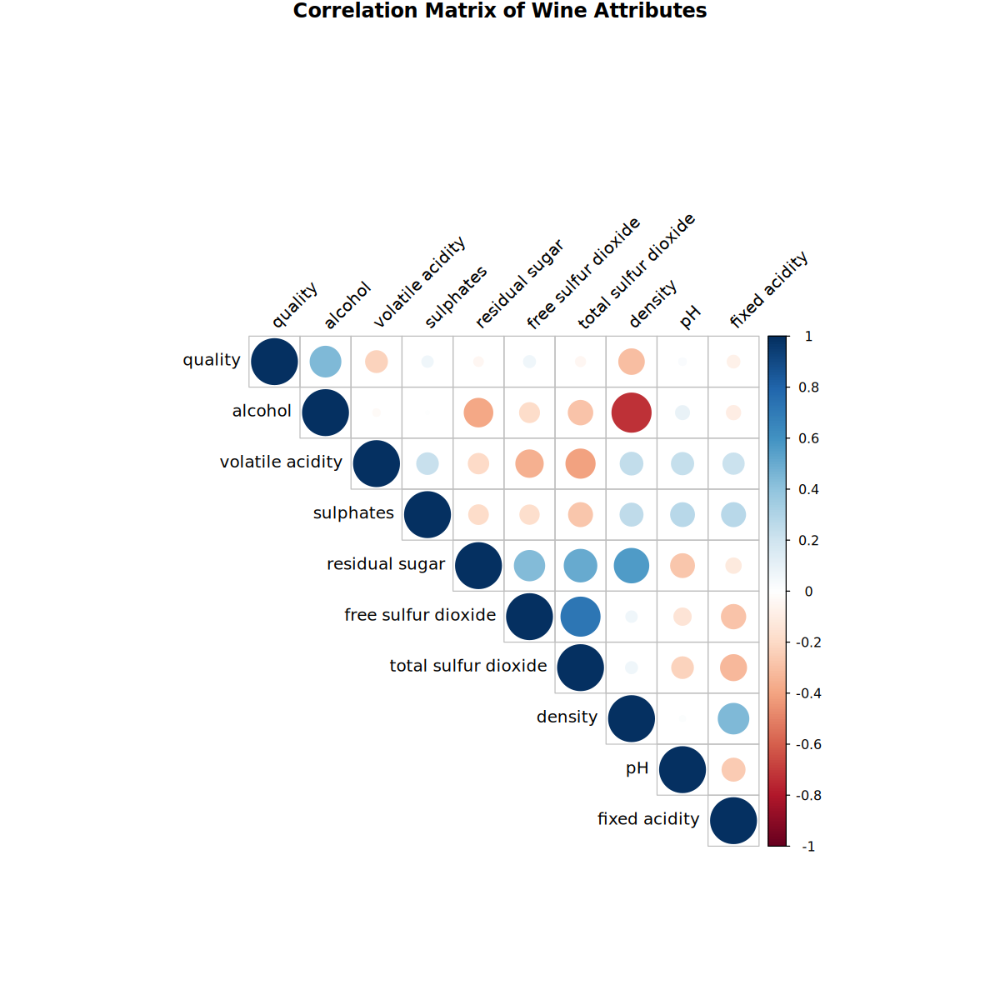

In [59]:
library(corrplot)

model = gral_model
model_data = model.frame(model)
corr_matrix = cor(subset(model_data, select = -type), method = "pearson")
corrplot(corr_matrix, method = "circle", type = "upper", tl.col = "black", tl.srt = 45, title = "Correlation Matrix of Wine Attributes", mar=c(0,0,1,0))

In [60]:
library(car)

vif_data = as.data.frame(vif(model), col.names = "VIF")
vif_data$scale = ifelse(vif_data$`vif(model)` < 5, "Low", ifelse(vif_data$`vif(model)` < 10, "Moderate", "High"))
vif_data

Loading required package: carData




Attaching package: ‘car’


The following object is masked from ‘package:dplyr’:

    recode




,vif(model),scale
,<dbl>,<chr>
alcohol,7.416881,Moderate
`volatile acidity`,1.861981,Low
sulphates,1.535534,Low
`residual sugar`,11.081017,High
`free sulfur dioxide`,2.281498,Low
`total sulfur dioxide`,3.950437,Low
type,7.383398,Moderate
density,28.335176,High
pH,2.614256,Low


High multicollinearity in `density` and `residual sugar`, being `density` the gratest

##### Updating Model

In [61]:
model = update(model, . ~ . - density, data = model.frame(model))
resume = summary(model)
resume


Call:
lm(formula = quality ~ alcohol + `volatile acidity` + sulphates + 
    `residual sugar` + `free sulfur dioxide` + `total sulfur dioxide` + 
    type + pH + `fixed acidity`, data = model.frame(model))

Residuals:
    Min      1Q  Median      3Q     Max 
-3.3157 -0.4767 -0.0328  0.4449  2.6740 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)             1.8593538  0.3211793   5.789 7.44e-09 ***
alcohol                 0.3491833  0.0092299  37.832  < 2e-16 ***
`volatile acidity`     -1.5166568  0.0920865 -16.470  < 2e-16 ***
sulphates               0.6724317  0.0876945   7.668 2.03e-14 ***
`residual sugar`        0.0240866  0.0025150   9.577  < 2e-16 ***
`free sulfur dioxide`   0.0074501  0.0008532   8.732  < 2e-16 ***
`total sulfur dioxide` -0.0017043  0.0003347  -5.092 3.66e-07 ***
typewhite              -0.1267709  0.0490036  -2.587  0.00971 ** 
pH                      0.1355688  0.0761802   1.780  0.07520 .  
`fixed acidity`        -

##### Re-(fast)Testing

value 
    0

,Estimate,Std. Error,t value,Pr(>|t|),significant
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
(Intercept),1.859353833,0.3211792856,5.7891462,7.435864e-09,Yes
alcohol,0.349183317,0.0092298999,37.8317557,7.720065e-281,Yes
`volatile acidity`,-1.516656828,0.0920864572,-16.4699227,1.242185e-59,Yes
sulphates,0.672431696,0.0876945113,7.6678881,2.029976e-14,Yes
`residual sugar`,0.024086638,0.0025149740,9.5772910,1.424657e-21,Yes
`free sulfur dioxide`,0.007450136,0.0008532444,8.7315384,3.221395e-18,Yes
`total sulfur dioxide`,-0.001704347,0.0003347406,-5.0915457,3.660867e-07,Yes
typewhite,-0.126770908,0.0490035873,-2.5869720,9.705865e-03,Yes
pH,0.135568754,0.0761802424,1.7795789,7.519595e-02,No


,2.5 %,97.5 %,range
,<dbl>,<dbl>,<dbl>
(Intercept),1.229725856,2.488981811,1.259255954
alcohol,0.331089363,0.367277271,0.036187908
`volatile acidity`,-1.697179708,-1.336133947,0.361045761
sulphates,0.500518624,0.844344768,0.343826144
`residual sugar`,0.019156376,0.029016899,0.009860524
`free sulfur dioxide`,0.005777467,0.009122804,0.003345337
`total sulfur dioxide`,-0.002360560,-0.001048134,0.001312426
typewhite,-0.222835726,-0.030706090,0.192129636
pH,-0.013772171,0.284909680,0.298681852


,vif(model),scale
,<dbl>,<chr>
alcohol,1.368578,Low
`volatile acidity`,1.843391,Low
sulphates,1.397035,Low
`residual sugar`,1.560416,Low
`free sulfur dioxide`,2.248896,Low
`total sulfur dioxide`,3.808059,Low
type,4.597885,Low
pH,1.581536,Low
`fixed acidity`,1.805022,Low


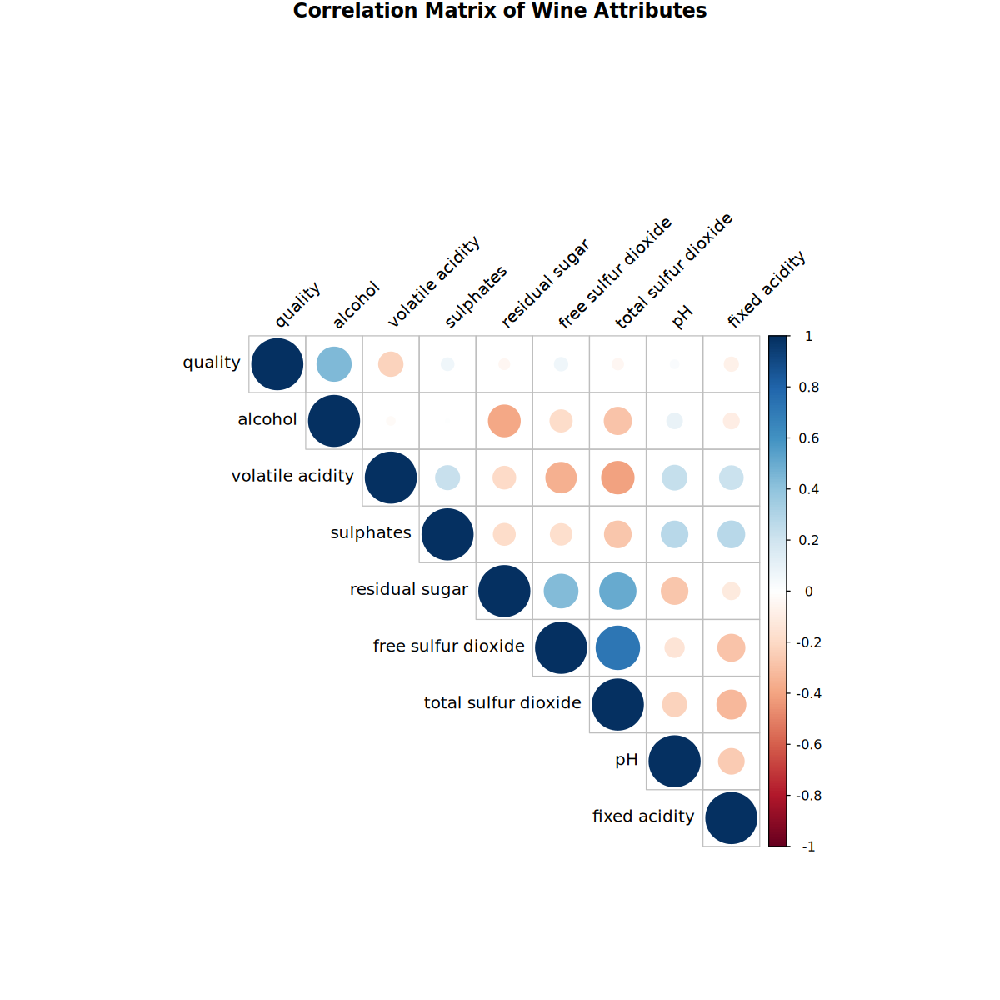

In [62]:
##### F pvalue
fstats = resume$fstatistic
fvalue = fstats[1]
df1 = fstats[2]
df2 = fstats[3]
pvalue = pf(fvalue, df1, df2, lower.tail = FALSE)
pvalue

##### Coeff t-student pvalue
coeff = as.data.frame(resume$coefficients)
coeff$significant = ifelse(coeff$`Pr(>|t|)` < 0.05, "Yes", "No")
coeff

##### Coeff intervals
ci = as.data.frame(confint(model, level = 0.95))
ci$range = ci$`97.5 %` - ci$`2.5 %`
ci

##### no-multicollinearity
model_data = model.frame(model)
corr_matrix = cor(subset(model_data, select = -type), method = "pearson")
corrplot(corr_matrix, method = "circle", type = "upper", tl.col = "black", tl.srt = 45, title = "Correlation Matrix of Wine Attributes", mar=c(0,0,1,0))
vif_data = as.data.frame(vif(model), col.names = "VIF")
vif_data$scale = ifelse(vif_data$`vif(model)` < 5, "Low", ifelse(vif_data$`vif(model)` < 10, "Moderate", "High"))
vif_data

`fixed acidity` and `pH` are now not significant for the gral regression, being `fixed acidity` the one with bigest pvalue

##### Updating Model

In [63]:
model = update(model, . ~ . - `fixed acidity`, data = model.frame(model))
resume = summary(model)
resume


Call:
lm(formula = quality ~ alcohol + `volatile acidity` + sulphates + 
    `residual sugar` + `free sulfur dioxide` + `total sulfur dioxide` + 
    type + pH, data = model.frame(model))

Residuals:
    Min      1Q  Median      3Q     Max 
-3.3204 -0.4792 -0.0356  0.4460  2.6777 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)             1.7424671  0.2387544   7.298 3.30e-13 ***
alcohol                 0.3494395  0.0092173  37.911  < 2e-16 ***
`volatile acidity`     -1.5096200  0.0911684 -16.559  < 2e-16 ***
sulphates               0.6665041  0.0870101   7.660 2.16e-14 ***
`residual sugar`        0.0241314  0.0025135   9.601  < 2e-16 ***
`free sulfur dioxide`   0.0075080  0.0008465   8.869  < 2e-16 ***
`total sulfur dioxide` -0.0017183  0.0003337  -5.149 2.71e-07 ***
typewhite              -0.1156278  0.0445166  -2.597  0.00942 ** 
pH                      0.1561396  0.0661337   2.361  0.01826 *  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.0

##### Re-(fast)Testing

value 
    0

,Estimate,Std. Error,t value,Pr(>|t|),significant
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
(Intercept),1.742467101,0.2387543733,7.298158,3.299025e-13,Yes
alcohol,0.349439489,0.0092173395,37.911101,6.771788e-282,Yes
`volatile acidity`,-1.509619968,0.0911684408,-16.558581,3.046334e-60,Yes
sulphates,0.666504133,0.0870101017,7.660078,2.155990e-14,Yes
`residual sugar`,0.024131424,0.0025134780,9.600809,1.138168e-21,Yes
`free sulfur dioxide`,0.007508047,0.0008465306,8.869197,9.596693e-19,Yes
`total sulfur dioxide`,-0.001718273,0.0003337411,-5.148520,2.709885e-07,Yes
typewhite,-0.115627778,0.0445166200,-2.597407,9.416198e-03,Yes
pH,0.156139648,0.0661336835,2.360970,1.825927e-02,Yes


,2.5 %,97.5 %,range
,<dbl>,<dbl>,<dbl>
(Intercept),1.274421886,2.210512317,0.936090431
alcohol,0.331370158,0.367508819,0.036138661
`volatile acidity`,-1.688343197,-1.330896739,0.357446458
sulphates,0.495932758,0.837075509,0.341142751
`residual sugar`,0.019204094,0.029058753,0.009854658
`free sulfur dioxide`,0.005848540,0.009167554,0.003319014
`total sulfur dioxide`,-0.002372527,-0.001064019,0.001308507
typewhite,-0.202896508,-0.028359048,0.174537461
pH,0.026493629,0.285785668,0.259292039


,vif(model),scale
,<dbl>,<chr>
alcohol,1.365017,Low
`volatile acidity`,1.807034,Low
sulphates,1.375477,Low
`residual sugar`,1.558745,Low
`free sulfur dioxide`,2.213906,Low
`total sulfur dioxide`,3.785799,Low
type,3.794881,Low
pH,1.192041,Low


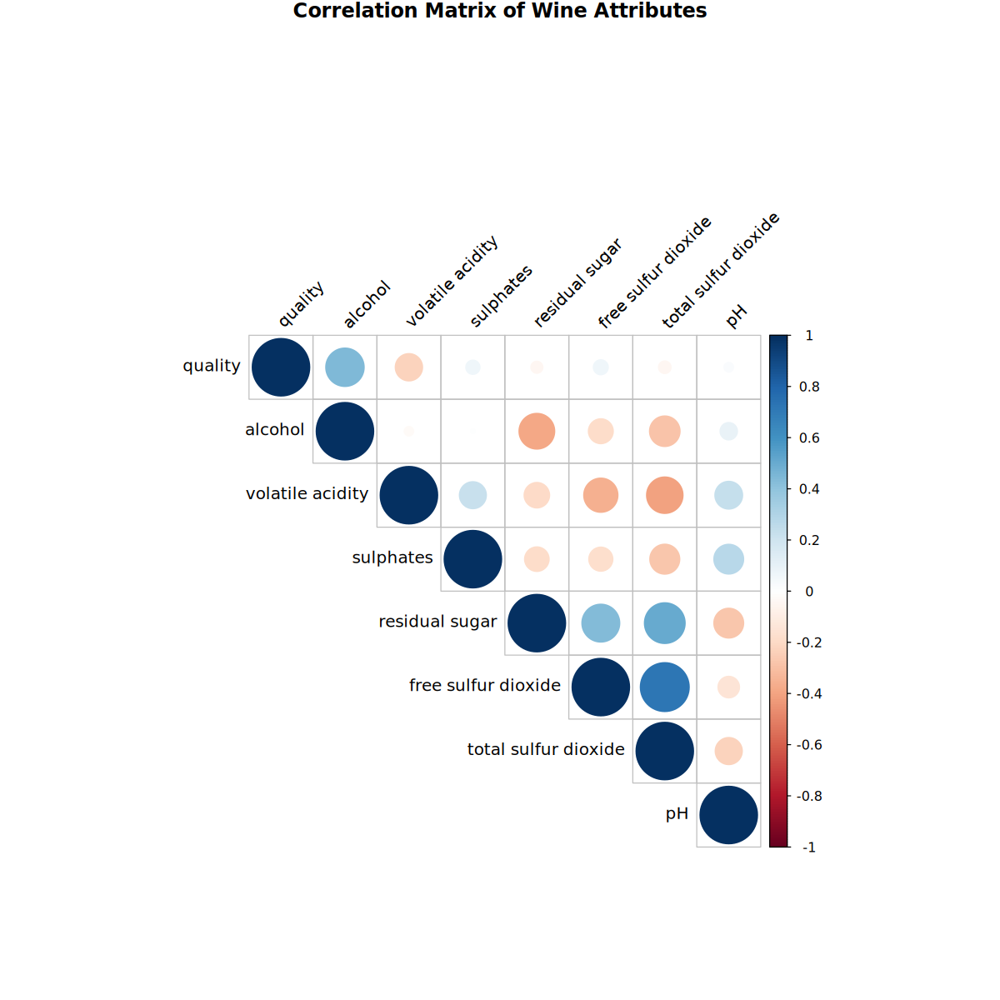

In [64]:
##### F pvalue
fstats = resume$fstatistic
fvalue = fstats[1]
df1 = fstats[2]
df2 = fstats[3]
pvalue = pf(fvalue, df1, df2, lower.tail = FALSE)
pvalue

##### Coeff t-student pvalue
coeff = as.data.frame(resume$coefficients)
coeff$significant = ifelse(coeff$`Pr(>|t|)` < 0.05, "Yes", "No")
coeff

##### Coeff intervals
ci = as.data.frame(confint(model, level = 0.95))
ci$range = ci$`97.5 %` - ci$`2.5 %`
ci

##### no-multicollinearity
model_data = model.frame(model)
corr_matrix = cor(subset(model_data, select = -type), method = "pearson")
corrplot(corr_matrix, method = "circle", type = "upper", tl.col = "black", tl.srt = 45, title = "Correlation Matrix of Wine Attributes", mar=c(0,0,1,0))
vif_data = as.data.frame(vif(model), col.names = "VIF")
vif_data$scale = ifelse(vif_data$`vif(model)` < 5, "Low", ifelse(vif_data$`vif(model)` < 10, "Moderate", "High"))
vif_data

vif tell us everything is good but the in corrplot it can be seen a correlation between `free sulfur dioxide` and `total sulfur dioxide` been the last one the one with more visible correlations with other variables 

In [65]:
as.data.frame(corr_matrix)$`total sulfur dioxide`

[1] -0.04964037 -0.28337833 -0.40301606 -0.27300306  0.50319321  0.72382738
[7]  1.00000000 -0.22346896

0.72 doesn't seems like a lot

##### Final Model

In [66]:
gral_model = model
gral_resume = resume

#### Red

##### Testing

,vif(model),scale
,<dbl>,<chr>
alcohol,1.203373,Low
sulphates,1.197360,Low
`volatile acidity`,1.685124,Low
`total sulfur dioxide`,1.054184,Low
pH,1.474588,Low
`citric acid`,2.151292,Low


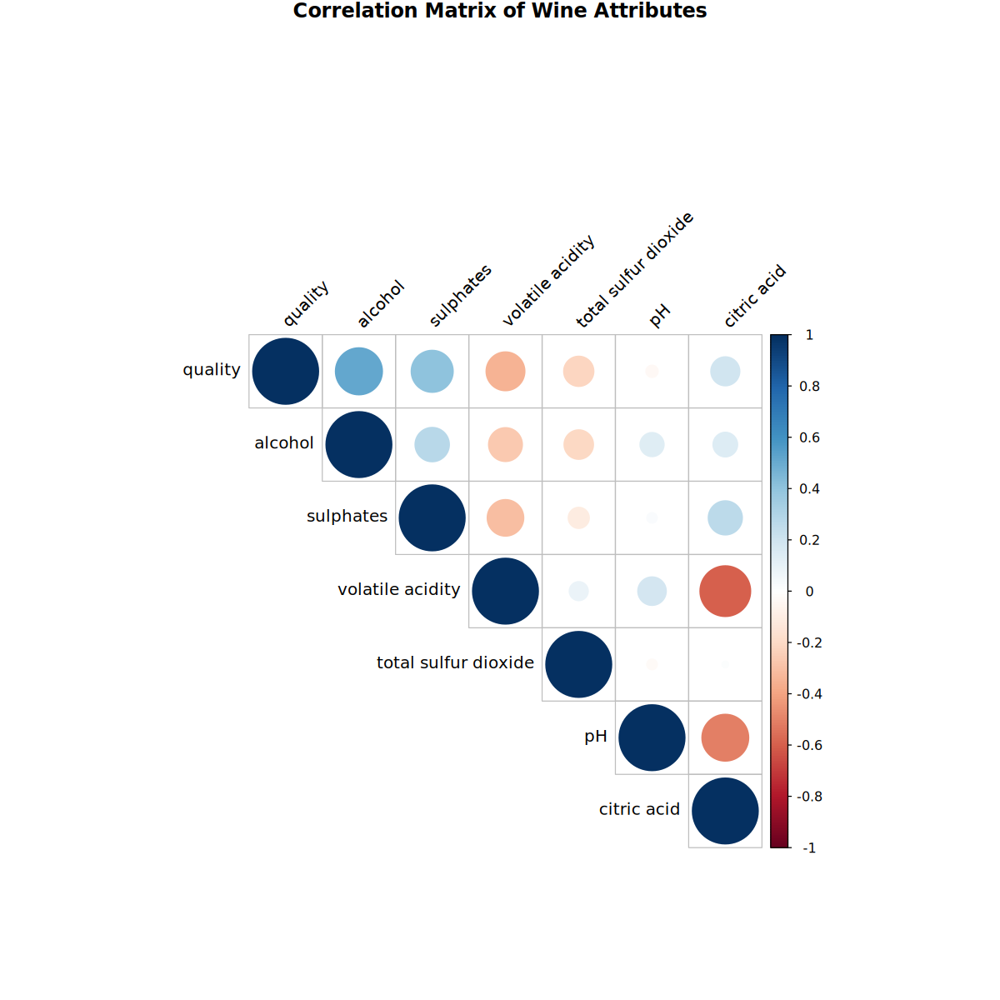

In [67]:
model = red_model
model_data = model.frame(model) 
corr_matrix = cor(model_data, method = "pearson")
corrplot(corr_matrix, method = "circle", type = "upper", tl.col = "black", tl.srt = 45, title = "Correlation Matrix of Wine Attributes", mar=c(0,0,1,0))

vif_data = as.data.frame(vif(model), col.names = "VIF")
vif_data$scale = ifelse(vif_data$`vif(model)` < 5, "Low", ifelse(vif_data$`vif(model)` < 10, "Moderate", "High"))
vif_data

vif tell us everything is good but the in corrplot it can be seen a negative correlation between `citric acid` and `volatile acidity`. 

In [68]:
as.data.frame(corr_matrix)$`volatile acidity`[7]

[1] -0.5935603

Nothing to worry about

##### Final Model

In [69]:
red_model = model
red_resume = resume

#### White

##### Testing

,vif(model),scale
,<dbl>,<chr>
alcohol,11.164509,High
`volatile acidity`,1.046065,Low
`residual sugar`,15.019527,High
`free sulfur dioxide`,1.183823,Low
density,36.959384,High
sulphates,1.169005,Low
pH,2.406638,Low
`fixed acidity`,3.161100,Low


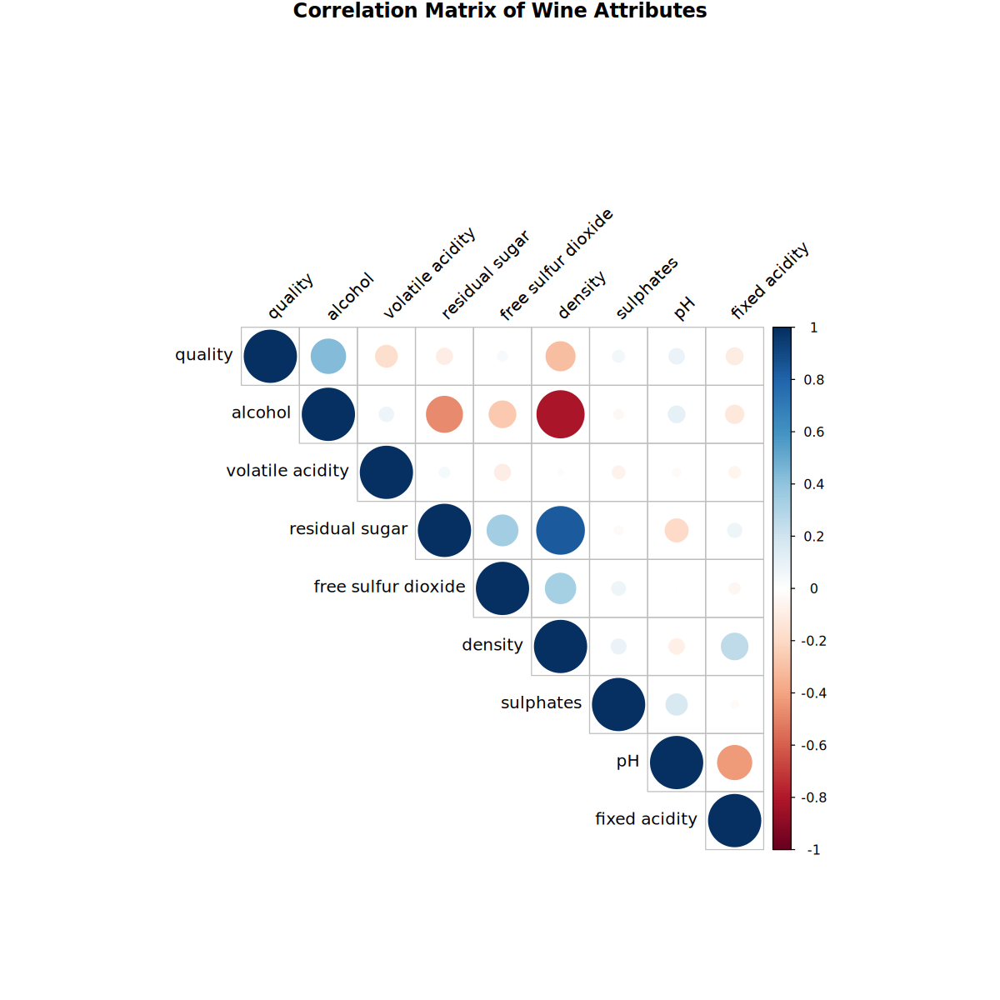

In [70]:
model = white_model
model_data = model.frame(model) 
corr_matrix = cor(model_data, method = "pearson")
corrplot(corr_matrix, method = "circle", type = "upper", tl.col = "black", tl.srt = 45, title = "Correlation Matrix of Wine Attributes", mar=c(0,0,1,0))

vif_data = as.data.frame(vif(model), col.names = "VIF")
vif_data$scale = ifelse(vif_data$`vif(model)` < 5, "Low", ifelse(vif_data$`vif(model)` < 10, "Moderate", "High"))
vif_data

High multicollinearity in `density`, `residual sugar` and `alcohol`, being `density` the gratest

##### Updating Model

In [71]:
model = update(model, . ~ . - density, data = model.frame(model))
resume = summary(model)
resume


Call:
lm(formula = quality ~ alcohol + `volatile acidity` + `residual sugar` + 
    `free sulfur dioxide` + sulphates + pH + `fixed acidity`, 
    data = model.frame(model))

Residuals:
    Min      1Q  Median      3Q     Max 
-3.2489 -0.5033 -0.0327  0.4519  2.7041 

Coefficients:
                        Estimate Std. Error t value Pr(>|t|)    
(Intercept)            1.5720486  0.3532671   4.450 8.79e-06 ***
alcohol                0.3840212  0.0103503  37.103  < 2e-16 ***
`volatile acidity`    -1.9363513  0.1165612 -16.612  < 2e-16 ***
`residual sugar`       0.0254709  0.0026869   9.480  < 2e-16 ***
`free sulfur dioxide`  0.0057065  0.0007627   7.482 8.73e-14 ***
sulphates              0.4128160  0.1019414   4.050 5.22e-05 ***
pH                     0.1729012  0.0844894   2.046  0.04077 *  
`fixed acidity`       -0.0443189  0.0146361  -3.028  0.00247 ** 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.7499 on 4653 degrees of freedom
Mult

##### Re-(fast)Testing

value 
3.230936e-312

,Estimate,Std. Error,t value,Pr(>|t|),significant
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
(Intercept),1.572048553,0.353267129,4.450028,8.786520e-06,Yes
alcohol,0.384021203,0.010350260,37.102565,3.374149e-264,Yes
`volatile acidity`,-1.936351277,0.116561235,-16.612309,2.994939e-60,Yes
`residual sugar`,0.025470892,0.002686865,9.479780,3.948360e-21,Yes
`free sulfur dioxide`,0.005706522,0.000762744,7.481569,8.730463e-14,Yes
sulphates,0.412815951,0.101941438,4.049540,5.215327e-05,Yes
pH,0.172901227,0.084489405,2.046425,4.077066e-02,Yes
`fixed acidity`,-0.044318934,0.014636094,-3.028058,2.474807e-03,Yes


,2.5 %,97.5 %,range
,<dbl>,<dbl>,<dbl>
(Intercept),0.879477549,2.264619558,1.385142009
alcohol,0.363729787,0.404312618,0.040582831
`volatile acidity`,-2.164866543,-1.707836011,0.457030532
`residual sugar`,0.020203363,0.030738422,0.010535058
`free sulfur dioxide`,0.004211182,0.007201862,0.002990679
sulphates,0.212962417,0.612669486,0.399707068
pH,0.007261949,0.338540505,0.331278557
`fixed acidity`,-0.073012615,-0.015625254,0.057387361


,vif(model),scale
,<dbl>,<chr>
alcohol,1.338638,Low
`volatile acidity`,1.031919,Low
`residual sugar`,1.455074,Low
`free sulfur dioxide`,1.183822,Low
sulphates,1.041918,Low
pH,1.306517,Low
`fixed acidity`,1.250985,Low


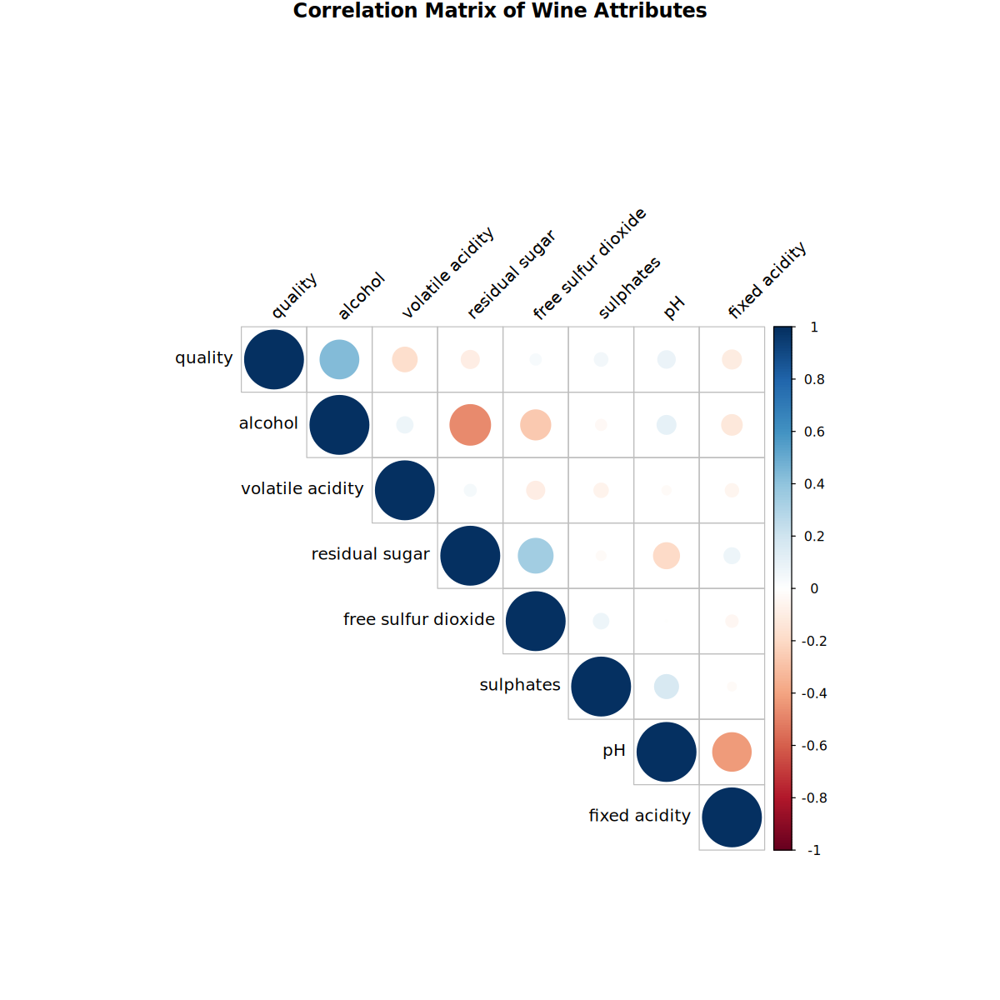

In [72]:
##### F pvalue
fstats = resume$fstatistic
fvalue = fstats[1]
df1 = fstats[2]
df2 = fstats[3]
pvalue = pf(fvalue, df1, df2, lower.tail = FALSE)
pvalue

##### Coeff t-student pvalue
coeff = as.data.frame(resume$coefficients)
coeff$significant = ifelse(coeff$`Pr(>|t|)` < 0.05, "Yes", "No")
coeff

##### Coeff intervals
ci = as.data.frame(confint(model, level = 0.95))
ci$range = ci$`97.5 %` - ci$`2.5 %`
ci

##### no-multicollinearity
model_data = model.frame(model)
corr_matrix = cor(model_data, method = "pearson")
corrplot(corr_matrix, method = "circle", type = "upper", tl.col = "black", tl.srt = 45, title = "Correlation Matrix of Wine Attributes", mar=c(0,0,1,0))
vif_data = as.data.frame(vif(model), col.names = "VIF")
vif_data$scale = ifelse(vif_data$`vif(model)` < 5, "Low", ifelse(vif_data$`vif(model)` < 10, "Moderate", "High"))
vif_data

Without ``density`` everything seems fine

##### Final Model

In [73]:
white_model = model
white_resume = resume

### Normality of errors

#### General

##### Testing

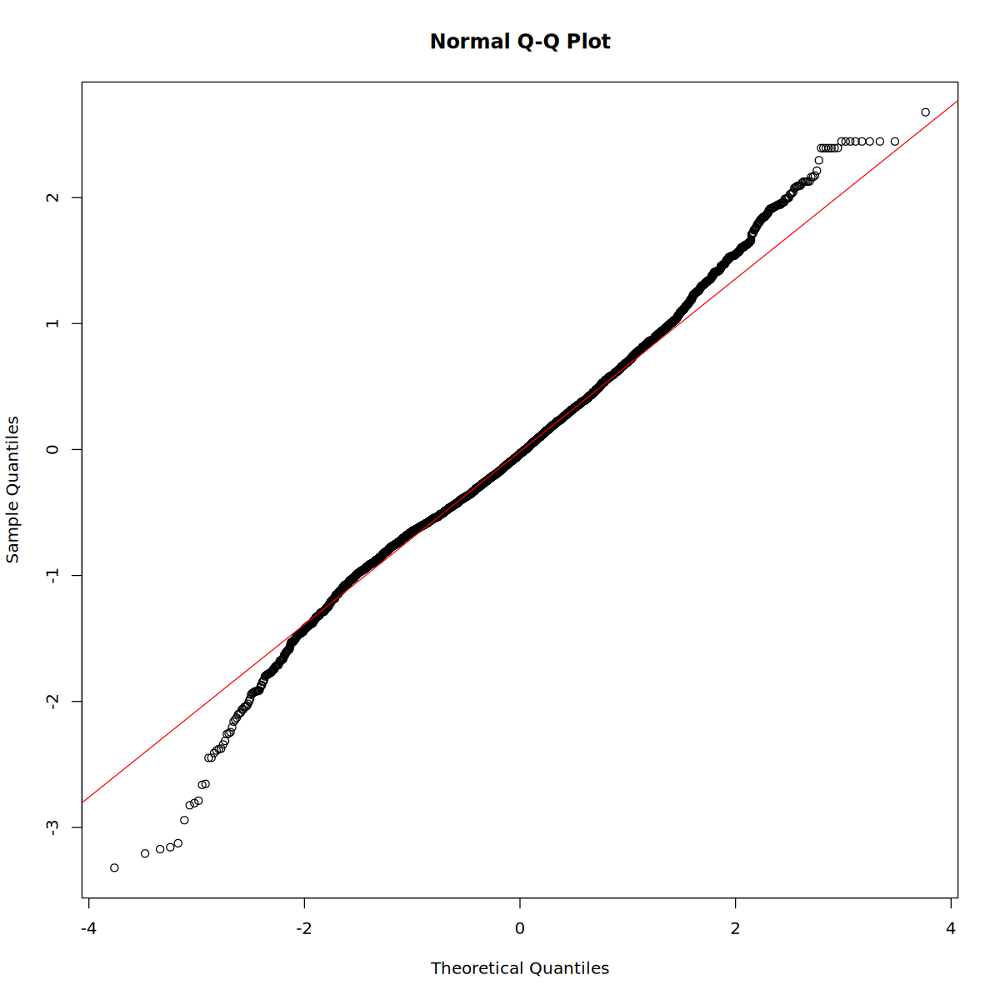

In [74]:
model = gral_model
res = model$residuals
## Q-Q plot
qqnorm(res)
qqline(res, col = "red")

**Shapiro-Wilks test**

$H_0:$ normal distribution 

$H_1:$ no normal distribution

In [75]:
# shapiro.test(res)
# # Error in shapiro.test(res): sample size must be between 3 and 5000
# # Traceback:

# # 1. stop("sample size must be between 3 and 5000")
# # 2. .handleSimpleError(function (cnd) 
# #  . {
# #  .     watcher$capture_plot_and_output()
# #  .     cnd <- sanitize_call(cnd)
# #  .     watcher$push(cnd)
# #  .     switch(on_error, continue = invokeRestart("eval_continue"), 
# #  .         stop = invokeRestart("eval_stop"), error = NULL)
# #  . }, "sample size must be between 3 and 5000", base::quote(shapiro.test(res)))


# length(res) # 5957

In [76]:
set.seed(123)
res_sub <- sample(res, 5000)
shapiro.test(res_sub)


	Shapiro-Wilk normality test

data:  res_sub
W = 0.99243, p-value = 1.13e-15


Rejection of normality by Shapiro-Wilk test because of the pvalue, but QQ-plot and W $\approx$ 1 suggest normality, so assumpiton accepted

#### Red

##### Testing

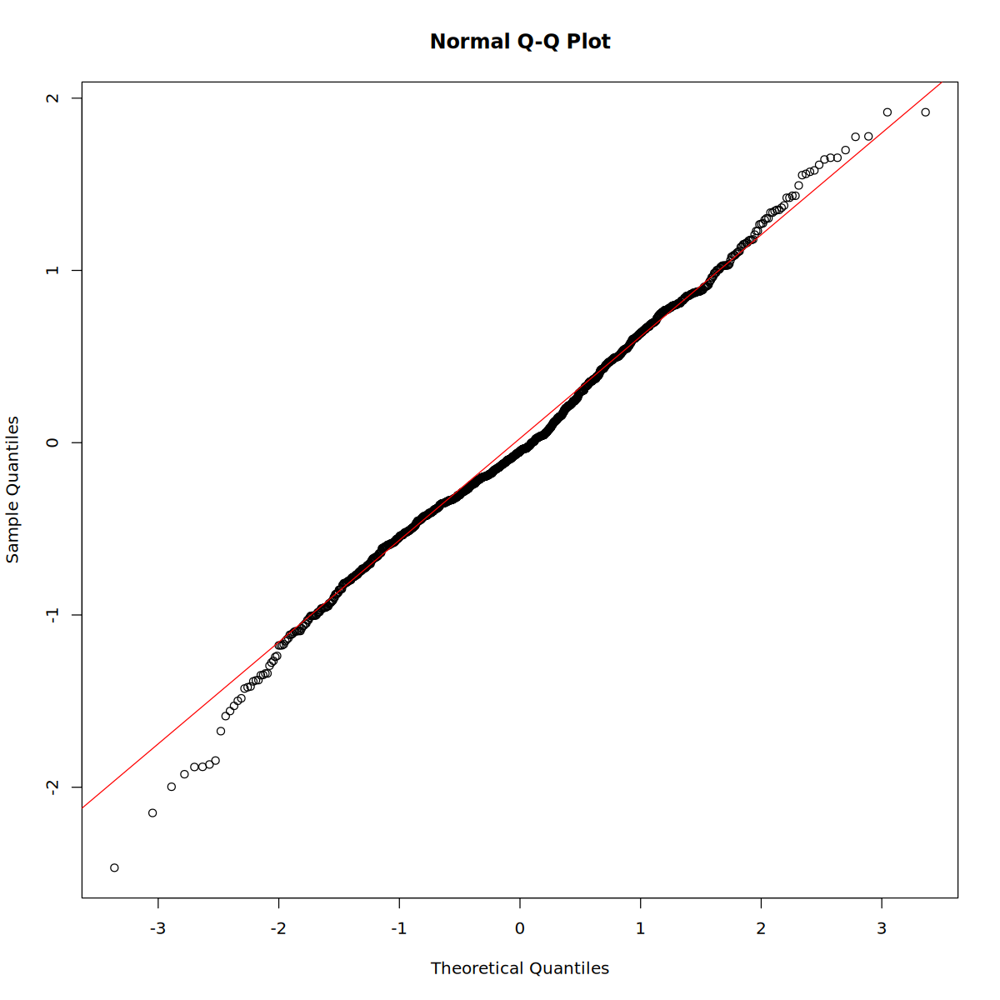

In [77]:
model = red_model
res = model$residuals
## Q-Q plot
qqnorm(res)
qqline(res, col = "red")

**Shapiro-Wilks test**

$H_0:$ normal distribution 

$H_1:$ no normal distribution

In [78]:
shapiro.test(res)


	Shapiro-Wilk normality test

data:  res
W = 0.99385, p-value = 3.386e-05


Rejection of normality by Shapiro-Wilk test because of the pvalue, but QQ-plot and W $\approx$ 1 suggest normality, so assumpiton accepted

#### White

##### Testing

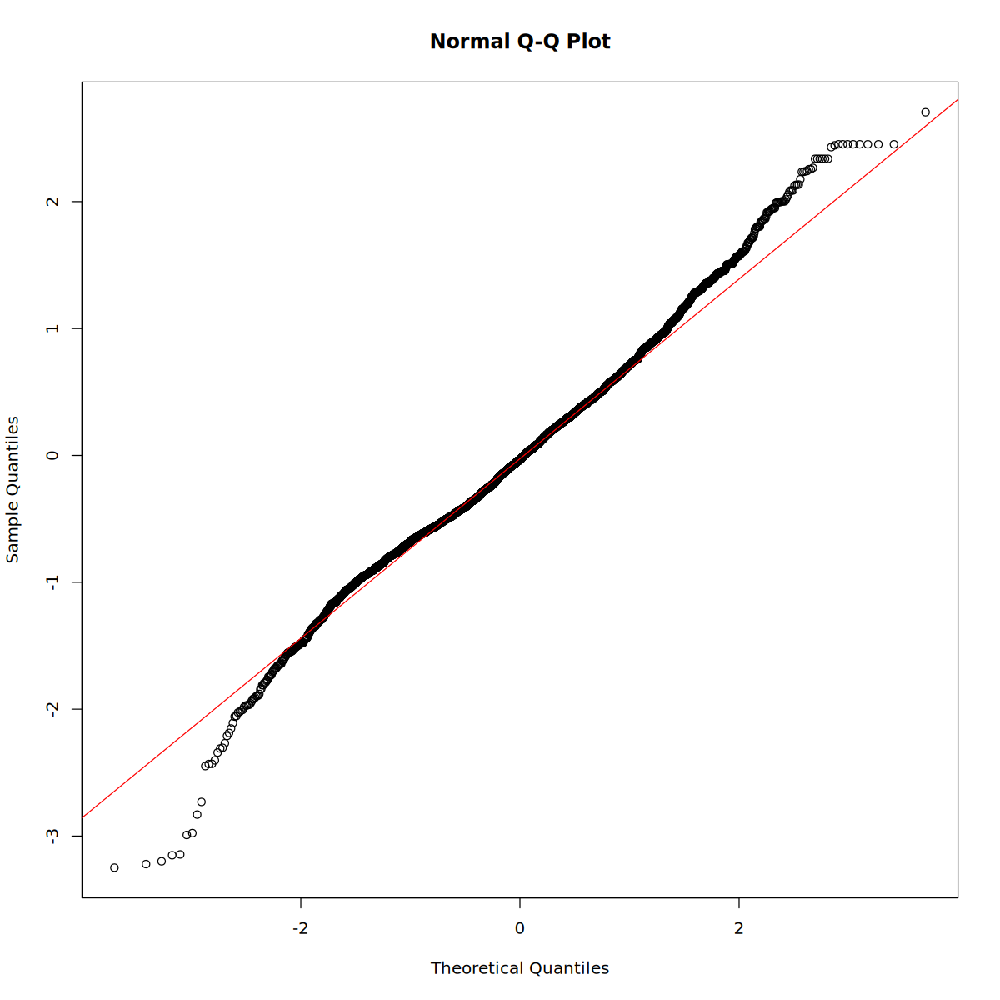

In [79]:
model = white_model
res = model$residuals
## Q-Q plot
qqnorm(res)
qqline(res, col = "red")

**Shapiro-Wilks test**

$H_0:$ normal distribution 

$H_1:$ no normal distribution

In [80]:
shapiro.test(res)


	Shapiro-Wilk normality test

data:  res
W = 0.99233, p-value = 3.637e-15


Rejection of normality by Shapiro-Wilk test because of the pvalue, but QQ-plot and W $\approx$ 1 suggest normality, so assumpiton accepted

### Homoscedasticity

#### General

##### Testing

**Breusch-Pagan test**

$H_0:homoscedasticity$

$H_1:heteroscedasticity$

Loading required package: zoo


Attaching package: ‘zoo’


The following objects are masked from ‘package:base’:

    as.Date, as.Date.numeric





	studentized Breusch-Pagan test

data:  model
BP = 124.83, df = 8, p-value < 2.2e-16


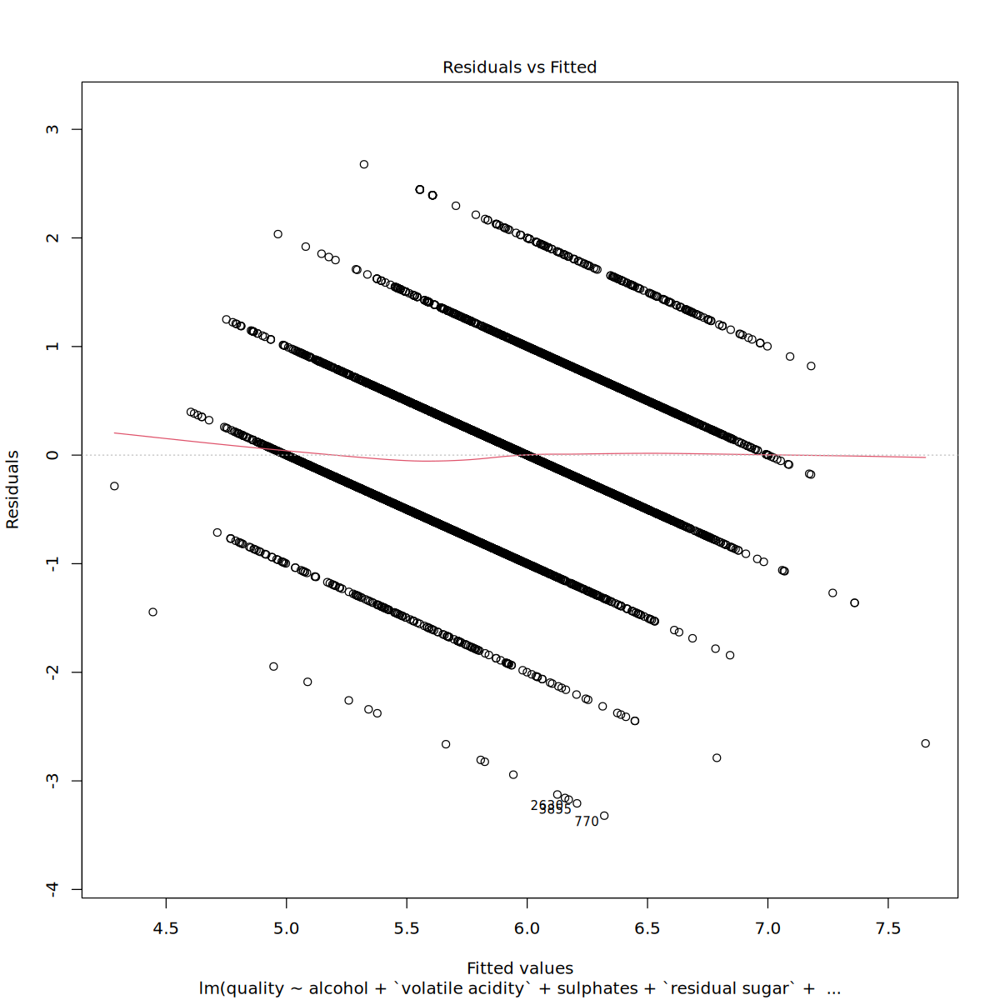

In [81]:
library(lmtest)
model = gral_model
bptest(model)
plot(model, which = 1)

Rejection of homoscedasticity

##### Updating Model

In [82]:
logModel = update(model, log(.) ~  ., data = model.frame(model))
logResume = summary(logModel)
logResume


Call:
lm(formula = log(quality) ~ alcohol + `volatile acidity` + sulphates + 
    `residual sugar` + `free sulfur dioxide` + `total sulfur dioxide` + 
    type + pH, data = model.frame(model))

Residuals:
     Min       1Q   Median       3Q      Max 
-0.72997 -0.07807  0.00193  0.08104  0.41115 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)             1.069e+00  4.155e-02  25.738  < 2e-16 ***
alcohol                 5.923e-02  1.604e-03  36.924  < 2e-16 ***
`volatile acidity`     -2.742e-01  1.587e-02 -17.286  < 2e-16 ***
sulphates               1.167e-01  1.514e-02   7.708 1.49e-14 ***
`residual sugar`        4.163e-03  4.374e-04   9.517  < 2e-16 ***
`free sulfur dioxide`   1.371e-03  1.473e-04   9.304  < 2e-16 ***
`total sulfur dioxide` -2.864e-04  5.808e-05  -4.932 8.38e-07 ***
typewhite              -2.734e-02  7.747e-03  -3.529  0.00042 ***
pH                      2.524e-02  1.151e-02   2.193  0.02833 *  
---
Signif. codes:  0 ‘***’

##### Re-(fast)Testing

value 
    0

,Estimate,Std. Error,t value,Pr(>|t|),significant
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
(Intercept),1.0693502383,4.154807e-02,25.737662,1.349710e-138,Yes
alcohol,0.0592256814,1.604003e-03,36.923677,6.732312e-269,Yes
`volatile acidity`,-0.2742444406,1.586515e-02,-17.285970,2.322581e-65,Yes
sulphates,0.1167046523,1.514151e-02,7.707596,1.492995e-14,Yes
`residual sugar`,0.0041626868,4.373958e-04,9.516979,2.527119e-21,Yes
`free sulfur dioxide`,0.0013706619,1.473134e-04,9.304395,1.854234e-20,Yes
`total sulfur dioxide`,-0.0002864141,5.807768e-05,-4.931569,8.378754e-07,Yes
typewhite,-0.0273418864,7.746789e-03,-3.529448,4.195773e-04,Yes
pH,0.0252409645,1.150859e-02,2.193228,2.832957e-02,Yes


,2.5 %,97.5 %,range
,<dbl>,<dbl>,<dbl>
(Intercept),0.9879009396,1.1507995370,0.1628985974
alcohol,0.0560812538,0.0623701090,0.0062888552
`volatile acidity`,-0.3053458837,-0.2431429974,0.0622028863
sulphates,0.0870217960,0.1463875087,0.0593657127
`residual sugar`,0.0033052322,0.0050201413,0.0017149091
`free sulfur dioxide`,0.0010818742,0.0016594496,0.0005775754
`total sulfur dioxide`,-0.0004002674,-0.0001725608,0.0002277067
typewhite,-0.0425284040,-0.0121553689,0.0303730351
pH,0.0026799447,0.0478019843,0.0451220396


,vif(logModel),scale
,<dbl>,<chr>
alcohol,1.365017,Low
`volatile acidity`,1.807034,Low
sulphates,1.375477,Low
`residual sugar`,1.558745,Low
`free sulfur dioxide`,2.213906,Low
`total sulfur dioxide`,3.785799,Low
type,3.794881,Low
pH,1.192041,Low



	Shapiro-Wilk normality test

data:  sample(logModel$residuals, 5000)
W = 0.97961, p-value < 2.2e-16



	studentized Breusch-Pagan test

data:  logModel
BP = 98.286, df = 8, p-value < 2.2e-16


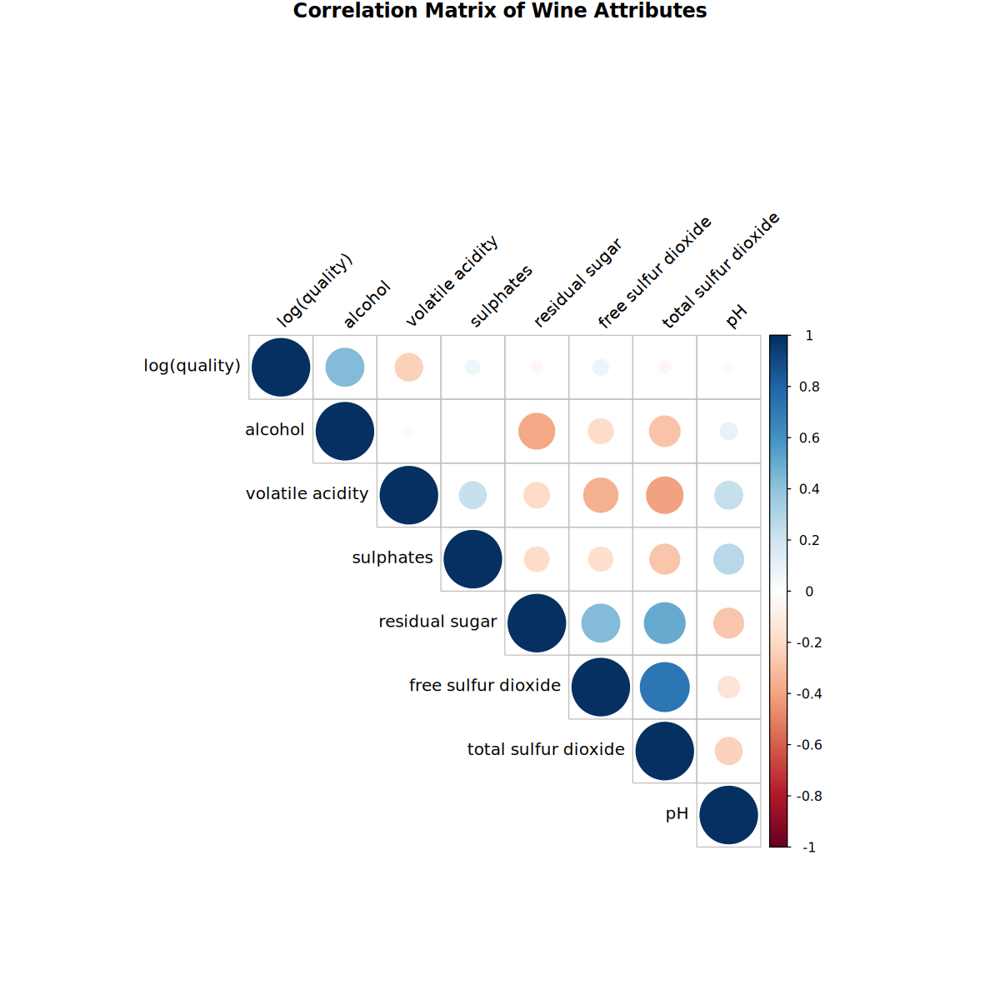

In [83]:
##### F pvalue
fstats = logResume$fstatistic
fvalue = fstats[1]
df1 = fstats[2]
df2 = fstats[3]
pvalue = pf(fvalue, df1, df2, lower.tail = FALSE)
pvalue

##### Coeff t-student pvalue
coeff = as.data.frame(logResume$coefficients)
coeff$significant = ifelse(coeff$`Pr(>|t|)` < 0.05, "Yes", "No")
coeff

##### Coeff intervals
ci = as.data.frame(confint(logModel, level = 0.95))
ci$range = ci$`97.5 %` - ci$`2.5 %`
ci

##### no-multicollinearity
model_data = model.frame(logModel)
corr_matrix = cor(subset(model_data, select = -type), method = "pearson")
corrplot(corr_matrix, method = "circle", type = "upper", tl.col = "black", tl.srt = 45, title = "Correlation Matrix of Wine Attributes", mar=c(0,0,1,0))
vif_data = as.data.frame(vif(logModel), col.names = "VIF")
vif_data$scale = ifelse(vif_data$`vif(logModel)` < 5, "Low", ifelse(vif_data$`vif(logModel)` < 10, "Moderate", "High"))
vif_data

##### normality-errors
shapiro.test(sample(logModel$residuals, 5000))

##### homocedasticity
bptest(logModel)

Breusch-Pagan test is still rejection homoscedasticity

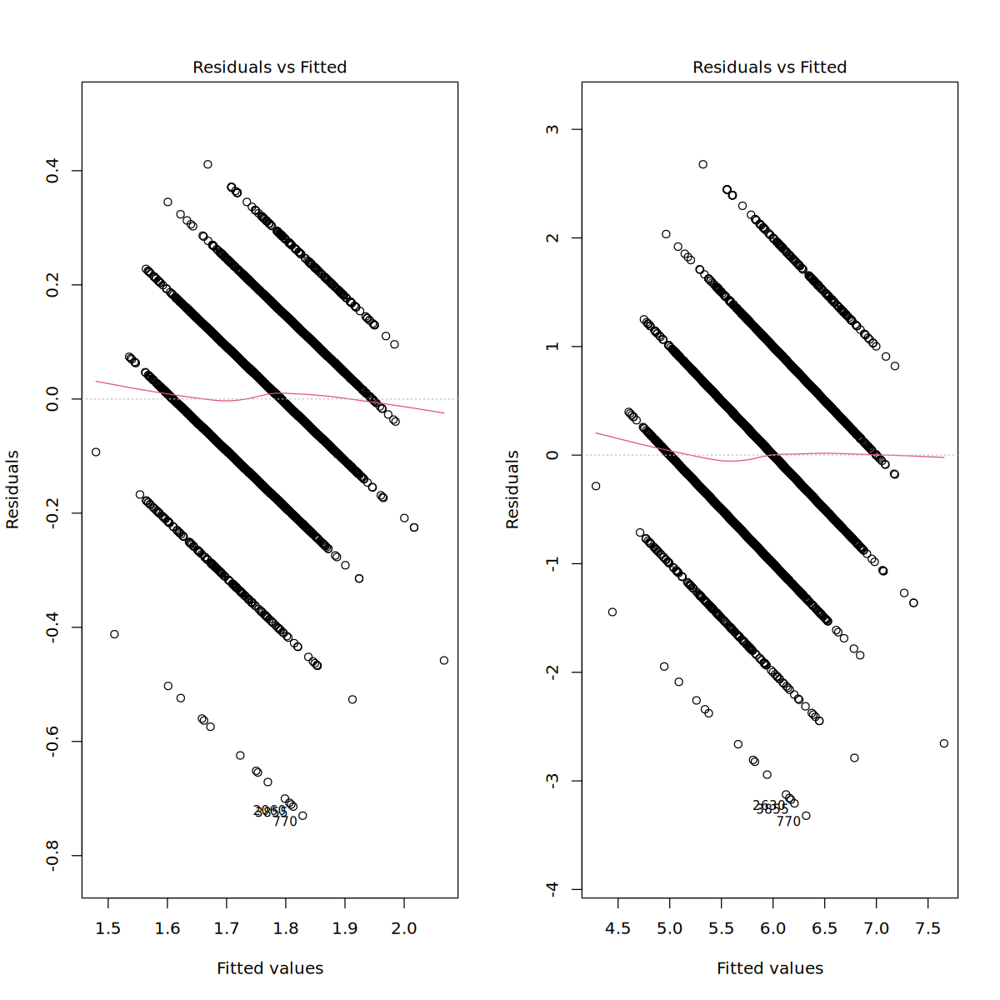

In [84]:
par(mfrow = c(1,2))
plot(logModel, which = 1)
plot(model, which = 1)

**Conclusion: heteroscedasticity**

#### Red

##### Testing

**Breusch-Pagan test**

$H_0:homoscedasticity$

$H_1:heteroscedasticity$


	studentized Breusch-Pagan test

data:  model
BP = 50.175, df = 6, p-value = 4.337e-09


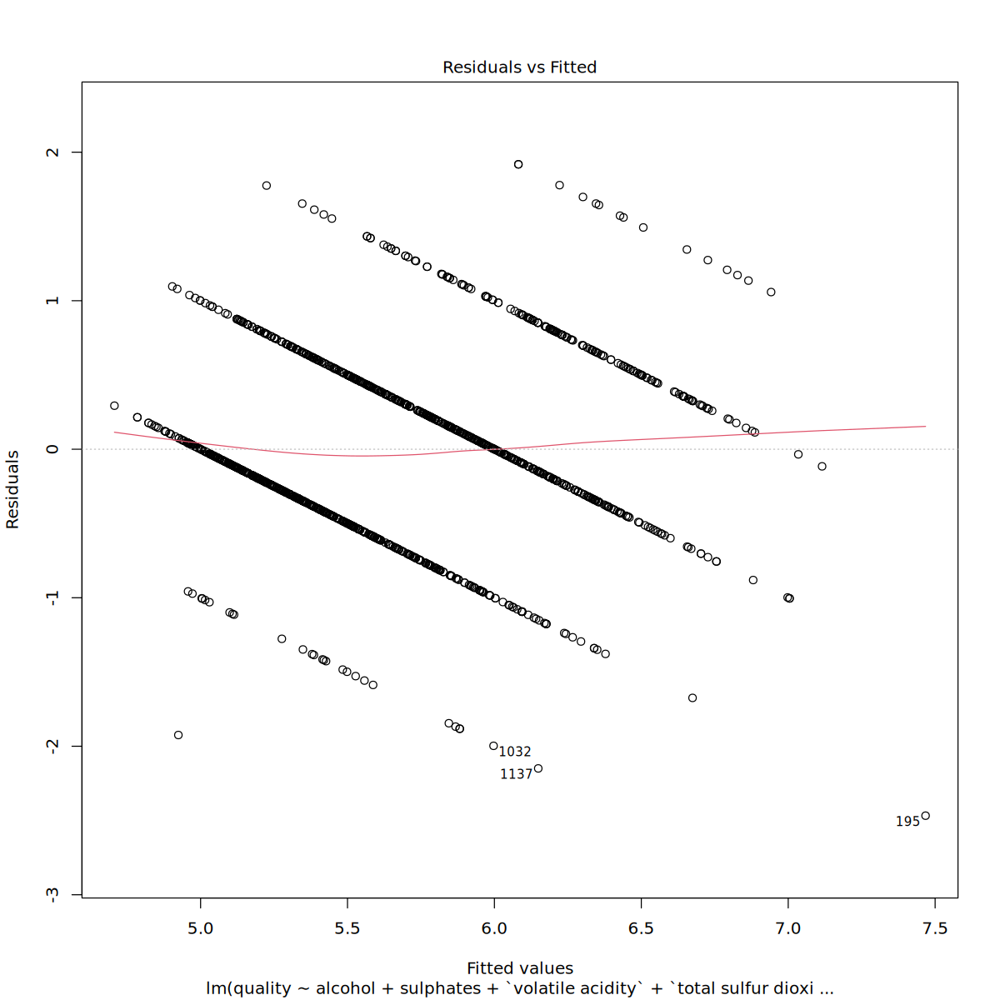

In [85]:
model = red_model
bptest(model)
plot(model, which = 1)

Rejection of homoscedasticity

##### Updating Model

In [86]:
logModel = update(model, log(.) ~  ., data = model.frame(model))
logResume = summary(logModel)
logResume


Call:
lm(formula = log(quality) ~ alcohol + sulphates + `volatile acidity` + 
    `total sulfur dioxide` + pH + `citric acid`, data = model.frame(model))

Residuals:
     Min       1Q   Median       3Q      Max 
-0.49567 -0.06261 -0.00680  0.07703  0.29623 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)             1.526e+00  9.028e-02  16.899  < 2e-16 ***
alcohol                 4.912e-02  3.062e-03  16.041  < 2e-16 ***
sulphates               3.061e-01  2.810e-02  10.895  < 2e-16 ***
`volatile acidity`     -1.948e-01  2.802e-02  -6.951 5.73e-12 ***
`total sulfur dioxide` -3.586e-04  9.549e-05  -3.755 0.000181 ***
pH                     -1.112e-01  2.551e-02  -4.360 1.40e-05 ***
`citric acid`          -8.602e-02  2.383e-02  -3.610 0.000318 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.1072 on 1289 degrees of freedom
Multiple R-squared:  0.3696,	Adjusted R-squared:  0.3667 
F-statistic: 

##### Re-(fast)Testing

value 
2.063045e-125

,Estimate,Std. Error,t value,Pr(>|t|),significant
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
(Intercept),1.5257386835,9.028428e-02,16.899273,5.015490e-58,Yes
alcohol,0.0491216099,3.062215e-03,16.041201,6.151913e-53,Yes
sulphates,0.3061409671,2.809860e-02,10.895239,1.667892e-26,Yes
`volatile acidity`,-0.1947540018,2.801643e-02,-6.951421,5.728985e-12,Yes
`total sulfur dioxide`,-0.0003585633,9.548811e-05,-3.755057,1.810252e-04,Yes
pH,-0.1112204687,2.550829e-02,-4.360170,1.403080e-05,Yes
`citric acid`,-0.0860203844,2.382987e-02,-3.609772,3.182161e-04,Yes


,2.5 %,97.5 %,range
,<dbl>,<dbl>,<dbl>
(Intercept),1.3486184303,1.7028589367,0.3542405064
alcohol,0.0431141373,0.0551290824,0.0120149451
sulphates,0.2510169632,0.3612649709,0.1102480077
`volatile acidity`,-0.2497168020,-0.1397912017,0.1099256004
`total sulfur dioxide`,-0.0005458925,-0.0001712341,0.0003746583
pH,-0.1612627855,-0.0611781519,0.1000846337
`citric acid`,-0.1327699651,-0.0392708036,0.0934991616


,vif(logModel),scale
,<dbl>,<chr>
alcohol,1.203373,Low
sulphates,1.197360,Low
`volatile acidity`,1.685124,Low
`total sulfur dioxide`,1.054184,Low
pH,1.474588,Low
`citric acid`,2.151292,Low



	Shapiro-Wilk normality test

data:  logModel$residuals
W = 0.98656, p-value = 1.432e-09



	studentized Breusch-Pagan test

data:  logModel
BP = 20.858, df = 6, p-value = 0.001945


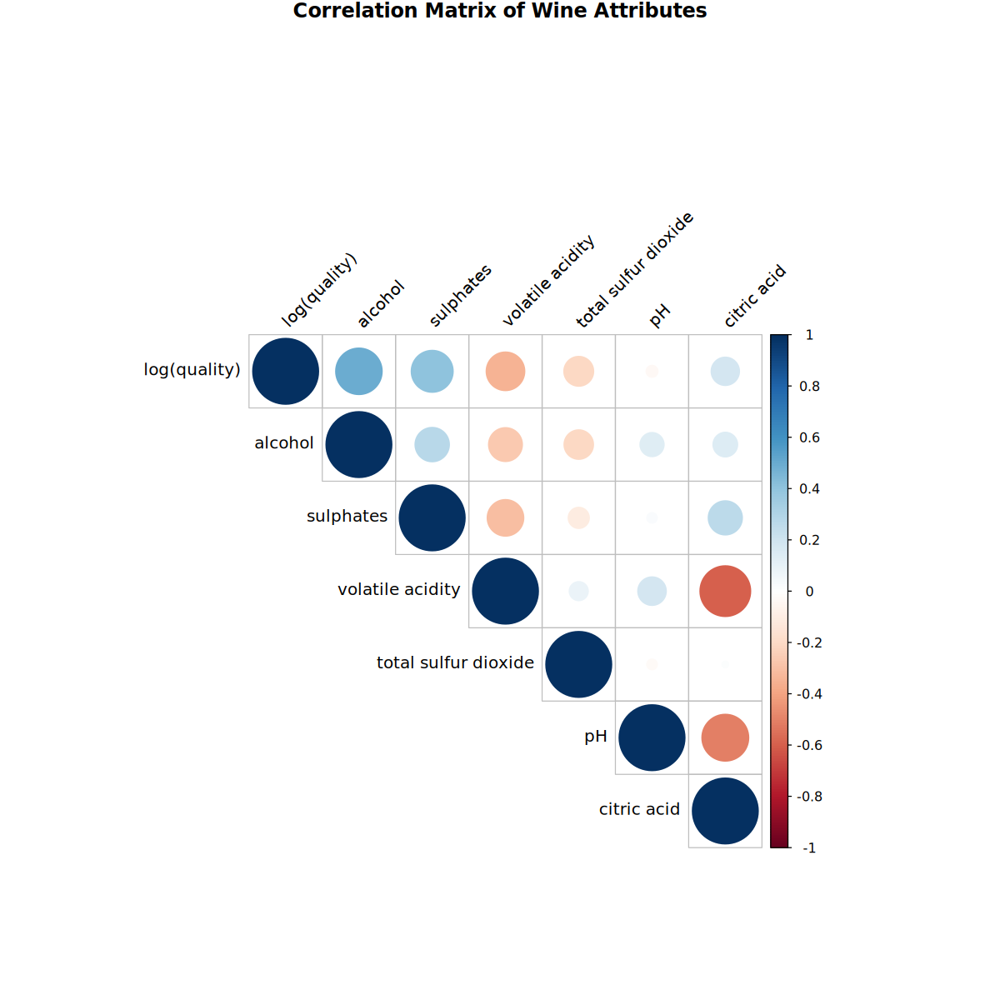

In [87]:
##### F pvalue
fstats = logResume$fstatistic
fvalue = fstats[1]
df1 = fstats[2]
df2 = fstats[3]
pvalue = pf(fvalue, df1, df2, lower.tail = FALSE)
pvalue

##### Coeff t-student pvalue
coeff = as.data.frame(logResume$coefficients)
coeff$significant = ifelse(coeff$`Pr(>|t|)` < 0.05, "Yes", "No")
coeff

##### Coeff intervals
ci = as.data.frame(confint(logModel, level = 0.95))
ci$range = ci$`97.5 %` - ci$`2.5 %`
ci

##### no-multicollinearity
model_data = model.frame(logModel)
corr_matrix = cor(model_data, method = "pearson")
corrplot(corr_matrix, method = "circle", type = "upper", tl.col = "black", tl.srt = 45, title = "Correlation Matrix of Wine Attributes", mar=c(0,0,1,0))
vif_data = as.data.frame(vif(logModel), col.names = "VIF")
vif_data$scale = ifelse(vif_data$`vif(logModel)` < 5, "Low", ifelse(vif_data$`vif(logModel)` < 10, "Moderate", "High"))
vif_data

##### normality-errors
shapiro.test(logModel$residuals)

##### homocedasticity
bptest(logModel)

Breusch-Pagan test is still rejection homoscedasticity

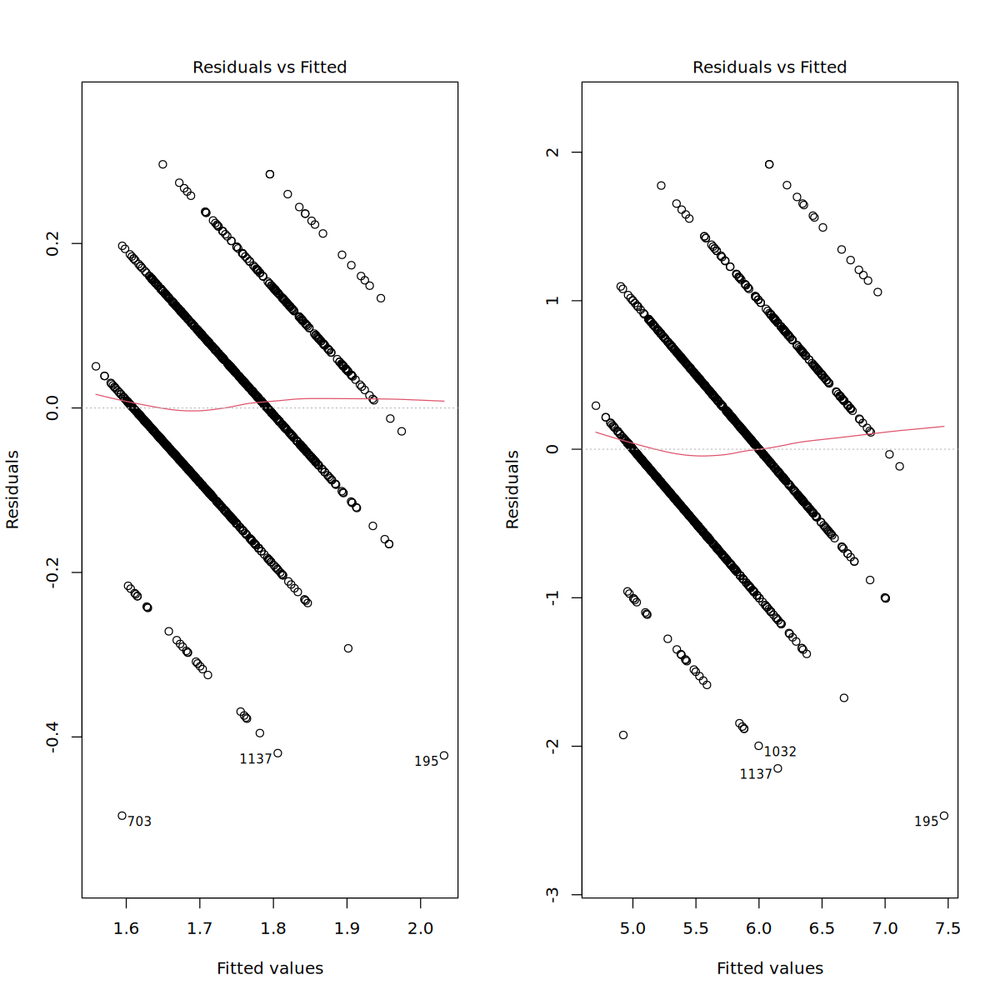

In [88]:
par(mfrow = c(1,2))
plot(logModel, which = 1)
plot(model, which = 1)

**Conclusion: heteroscedasticity**

#### White

##### Testing

**Breusch-Pagan test**

$H_0:homoscedasticity$

$H_1:heteroscedasticity$


	studentized Breusch-Pagan test

data:  model
BP = 67.364, df = 7, p-value = 5.028e-12


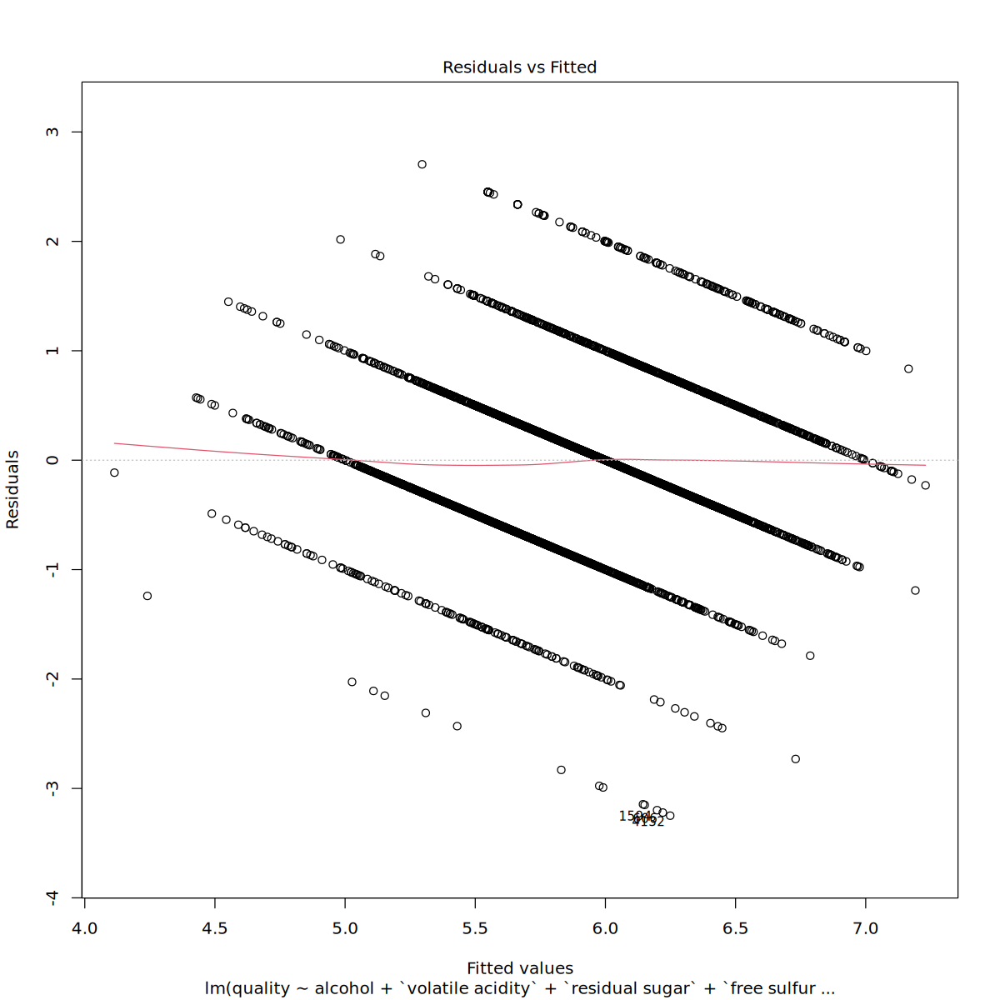

In [89]:
model = white_model
bptest(model)
plot(model, which = 1)

Rejection of homoscedasticity

##### Updating Model

In [90]:
logModel = update(model, log(.) ~  ., data = model.frame(model))
logResume = summary(logModel)
logResume


Call:
lm(formula = log(quality) ~ alcohol + `volatile acidity` + `residual sugar` + 
    `free sulfur dioxide` + sulphates + pH + `fixed acidity`, 
    data = model.frame(model))

Residuals:
     Min       1Q   Median       3Q      Max 
-0.72119 -0.08307  0.00395  0.08314  0.41475 

Coefficients:
                        Estimate Std. Error t value Pr(>|t|)    
(Intercept)            1.0572857  0.0612917  17.250  < 2e-16 ***
alcohol                0.0651663  0.0017958  36.289  < 2e-16 ***
`volatile acidity`    -0.3558087  0.0202233 -17.594  < 2e-16 ***
`residual sugar`       0.0044312  0.0004662   9.505  < 2e-16 ***
`free sulfur dioxide`  0.0010642  0.0001323   8.041 1.12e-15 ***
sulphates              0.0743370  0.0176868   4.203 2.68e-05 ***
pH                     0.0236706  0.0146589   1.615 0.106429    
`fixed acidity`       -0.0087741  0.0025394  -3.455 0.000555 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.1301 on 4653 degrees 

##### Re-(fast)Testing

value 
1.080292e-307

,Estimate,Std. Error,t value,Pr(>|t|),significant
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
(Intercept),1.057285711,0.0612916671,17.250073,1.106037e-64,Yes
alcohol,0.065166285,0.0017957649,36.288874,3.912949e-254,Yes
`volatile acidity`,-0.355808692,0.0202233150,-17.593985,3.917440e-67,Yes
`residual sugar`,0.004431151,0.0004661697,9.505445,3.100944e-21,Yes
`free sulfur dioxide`,0.001064153,0.0001323357,8.041316,1.118008e-15,Yes
sulphates,0.074336988,0.0176867877,4.202967,2.683797e-05,Yes
pH,0.023670643,0.0146588688,1.614766,1.064292e-01,No
`fixed acidity`,-0.008774096,0.0025393548,-3.455246,5.547024e-04,Yes


,2.5 %,97.5 %,range
,<dbl>,<dbl>,<dbl>
(Intercept),0.9371249939,1.177446428,0.2403214338
alcohol,0.0616457348,0.068686835,0.0070411005
`volatile acidity`,-0.3954559740,-0.316161409,0.0792945647
`residual sugar`,0.0035172374,0.005345065,0.0018278273
`free sulfur dioxide`,0.0008047125,0.001323594,0.0005188814
sulphates,0.0396625011,0.109011474,0.0693489730
pH,-0.0050676878,0.052408973,0.0574766610
`fixed acidity`,-0.0137524355,-0.003795757,0.0099566780


,vif(logModel),scale
,<dbl>,<chr>
alcohol,1.338638,Low
`volatile acidity`,1.031919,Low
`residual sugar`,1.455074,Low
`free sulfur dioxide`,1.183822,Low
sulphates,1.041918,Low
pH,1.306517,Low
`fixed acidity`,1.250985,Low



	Shapiro-Wilk normality test

data:  logModel$residuals
W = 0.98266, p-value < 2.2e-16



	studentized Breusch-Pagan test

data:  logModel
BP = 74.224, df = 7, p-value = 2.061e-13


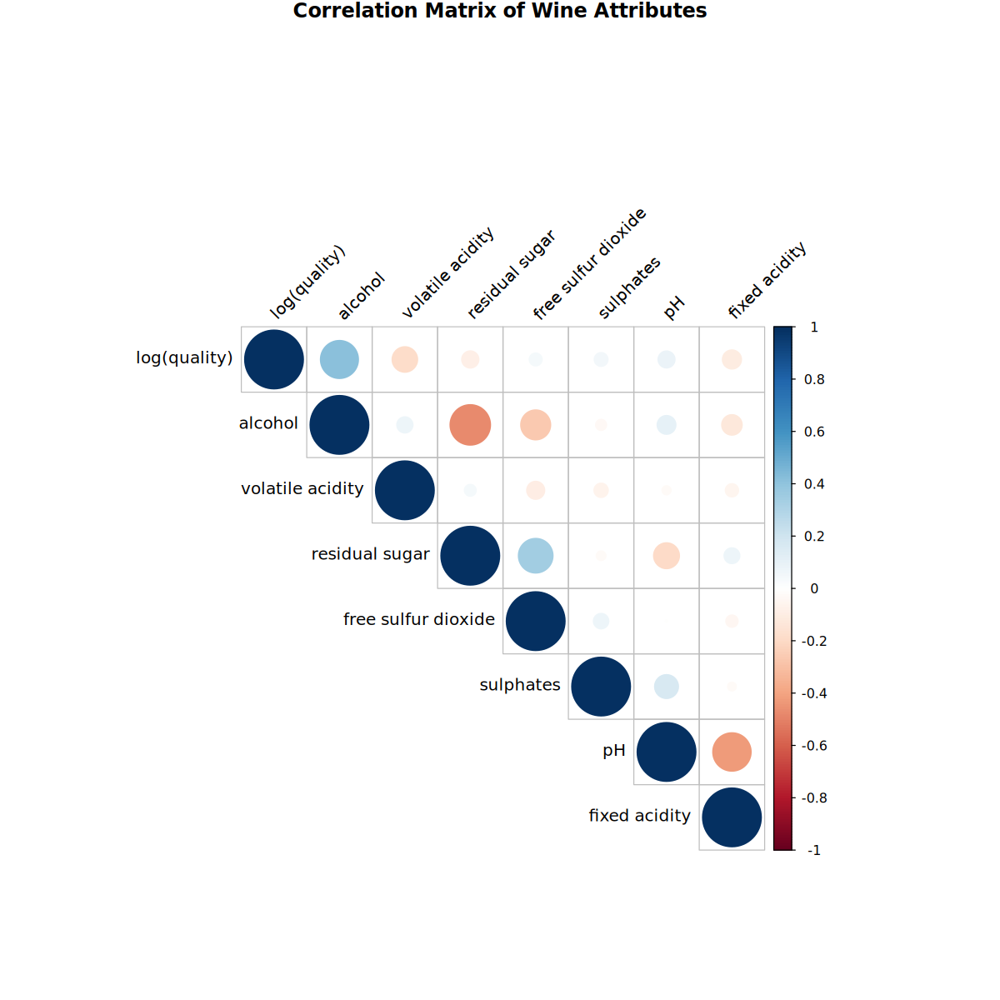

In [91]:
##### F pvalue
fstats = logResume$fstatistic
fvalue = fstats[1]
df1 = fstats[2]
df2 = fstats[3]
pvalue = pf(fvalue, df1, df2, lower.tail = FALSE)
pvalue

##### Coeff t-student pvalue
coeff = as.data.frame(logResume$coefficients)
coeff$significant = ifelse(coeff$`Pr(>|t|)` < 0.05, "Yes", "No")
coeff

##### Coeff intervals
ci = as.data.frame(confint(logModel, level = 0.95))
ci$range = ci$`97.5 %` - ci$`2.5 %`
ci

##### no-multicollinearity
model_data = model.frame(logModel)
corr_matrix = cor(model_data, method = "pearson")
corrplot(corr_matrix, method = "circle", type = "upper", tl.col = "black", tl.srt = 45, title = "Correlation Matrix of Wine Attributes", mar=c(0,0,1,0))
vif_data = as.data.frame(vif(logModel), col.names = "VIF")
vif_data$scale = ifelse(vif_data$`vif(logModel)` < 5, "Low", ifelse(vif_data$`vif(logModel)` < 10, "Moderate", "High"))
vif_data

##### normality-errors
shapiro.test(logModel$residuals)

##### homocedasticity
bptest(logModel)

Breusch-Pagan test is still rejection homoscedasticity

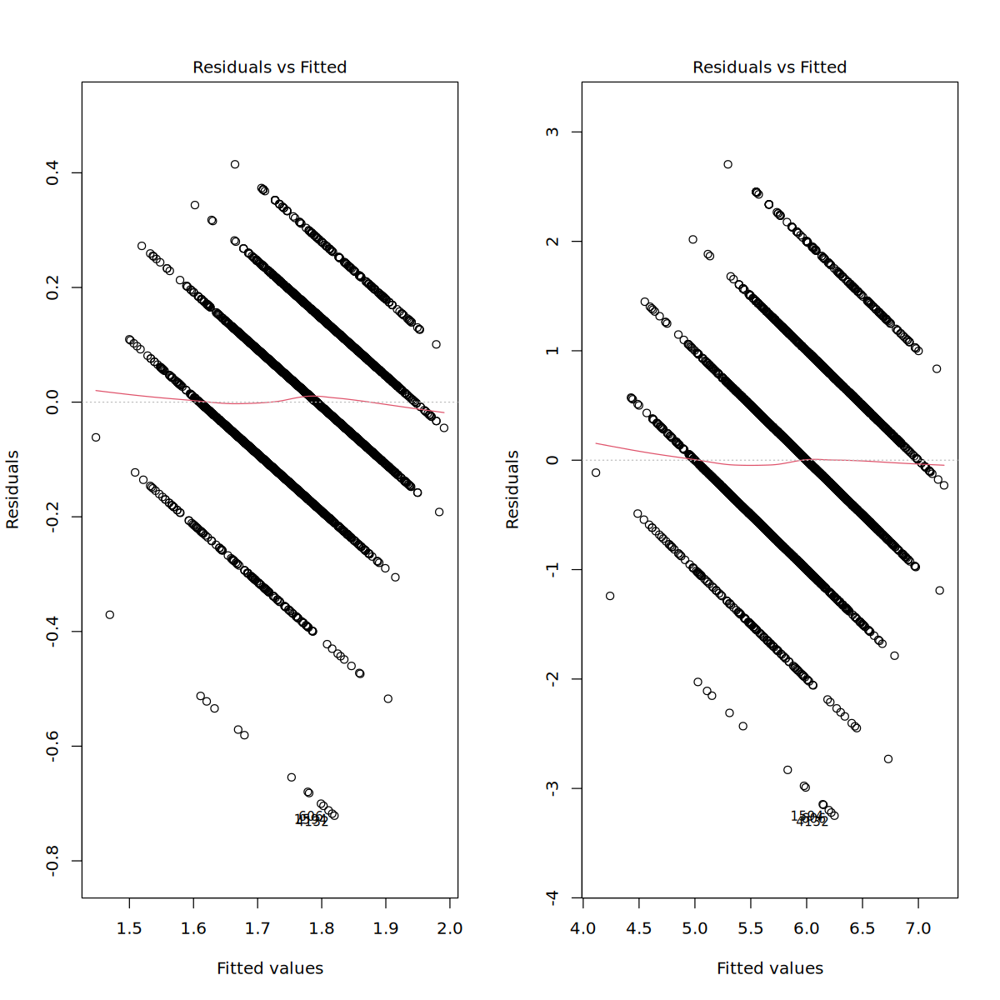

In [92]:
par(mfrow = c(1,2))
plot(logModel, which = 1)
plot(model, which = 1)

**Conclusion: heteroscedasticity**

### No autocorrelation

**Durbin-Watson test**

$H_0:$ No autocorrelation

$H_1:$ Autocorrelation

#### General


In [93]:
model = gral_model
dwtest(model)


	Durbin-Watson test

data:  model
DW = 2.0289, p-value = 0.8679
alternative hypothesis: true autocorrelation is greater than 0


**No rejeciton of $H_0$**

#### Red


In [94]:
model = red_model
dwtest(model)


	Durbin-Watson test

data:  model
DW = 2.1278, p-value = 0.9895
alternative hypothesis: true autocorrelation is greater than 0


**No rejeciton of $H_0$**

#### White


In [95]:
model = white_model
dwtest(model)


	Durbin-Watson test

data:  model
DW = 2.0097, p-value = 0.6295
alternative hypothesis: true autocorrelation is greater than 0


**No rejeciton of $H_0$**

## Analysis of Variance

### General

In [96]:
model = gral_model
anov = anova(model)
anov$significance = ifelse(anov$`Pr(>F)` < 0.05, "Yes", "No")
anov

,Df,Sum Sq,Mean Sq,F value,Pr(>F),significance
,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
alcohol,1,880.781998,880.7819976,1663.281388,7.386281e-321,Yes
`volatile acidity`,1,202.100213,202.1002127,381.648947,1.993869e-82,Yes
sulphates,1,52.829405,52.8294052,99.763808,2.618389e-23,Yes
`residual sugar`,1,53.865753,53.8657527,101.720862,9.910029e-24,Yes
`free sulfur dioxide`,1,17.364007,17.3640068,32.790440,1.076679e-08,Yes
`total sulfur dioxide`,1,35.200077,35.2000769,66.472331,4.290312e-16,Yes
type,1,4.501858,4.5018577,8.501373,3.562042e-03,Yes
pH,1,2.951778,2.9517778,5.574180,1.825927e-02,Yes
Residuals,5948,3149.732426,0.5295448,NA,NA,NA


Everything seems good

### Red

In [97]:
model = red_model
anov = anova(model)
anov$significance = ifelse(anov$`Pr(>F)` < 0.05, "Yes", "No")
anov

,Df,Sum Sq,Mean Sq,F value,Pr(>F),significance
,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
alcohol,1,201.450431,201.4504309,542.370805,2.036395e-100,Yes
sulphates,1,60.223809,60.2238093,162.142299,4.528050e-35,Yes
`volatile acidity`,1,18.575438,18.5754375,50.011186,2.499753e-12,Yes
`total sulfur dioxide`,1,6.701440,6.7014404,18.042481,2.315482e-05,Yes
pH,1,3.605432,3.6054322,9.707009,1.876183e-03,Yes
`citric acid`,1,3.981337,3.9813371,10.719069,1.088513e-03,Yes
Residuals,1289,478.767668,0.3714257,NA,NA,NA


Everything seems good

### White

In [98]:
model = white_model
anov = anova(model)
anov$significance = ifelse(anov$`Pr(>F)` < 0.05, "Yes", "No")
anov

,Df,Sum Sq,Mean Sq,F value,Pr(>F),significance
,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
alcohol,1,672.707579,672.7075788,1196.361071,1.642458e-233,Yes
`volatile acidity`,1,157.045850,157.0458504,279.294522,6.200790e-61,Yes
`residual sugar`,1,74.574817,74.5748167,132.625840,2.798713e-30,Yes
`free sulfur dioxide`,1,38.946993,38.9469934,69.264370,1.119684e-16,Yes
sulphates,1,11.640369,11.6403694,20.701543,5.503910e-06,Yes
pH,1,7.576200,7.5761996,13.473715,2.446409e-04,Yes
`fixed acidity`,1,5.155755,5.1557553,9.169132,2.474807e-03,Yes
Residuals,4653,2616.357586,0.5622948,NA,NA,NA


Everything seems good

## Final comparation

### Old vs New

In [99]:
gral_resume = summary(gral_model)
red_resume = summary(red_model)
white_resume = summary(white_model)

fg_resume = summary(first_gral_model)
fr_resume = summary(first_red_model)
fw_resume = summary(first_white_model)

#### General

In [100]:
m_i = fg_resume
m_f = gral_resume

m_i$coefficients
r_i = m_i$adj.r.squared
r_i

m_f$coefficients
r_f = m_f$adj.r.squared
r_f

'change:'
r_f - r_i

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),1.329974e+02,1.688688e+01,7.875786,3.996731e-15
alcohol,1.992215e-01,2.138048e-02,9.317917,1.635733e-20
`volatile acidity`,-1.445187e+00,9.209140e-02,-15.692958,2.062734e-54
sulphates,8.858313e-01,9.148354e-02,9.682959,5.175991e-22
`residual sugar`,7.209835e-02,6.668798e-03,10.811296,5.417686e-27
`free sulfur dioxide`,6.656150e-03,8.551519e-04,7.783589,8.258833e-15
`total sulfur dioxide`,-1.204106e-03,3.392530e-04,-3.549286,3.892619e-04
typewhite,-4.215543e-01,6.179046e-02,-6.822321,9.845697e-12
density,-1.328004e+02,1.709788e+01,-7.767070,9.397688e-15
pH,6.113373e-01,9.745886e-02,6.272774,3.796570e-10


[1] 0.2900767

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),1.742467101,0.2387543733,7.298158,3.299025e-13
alcohol,0.349439489,0.0092173395,37.911101,6.771788e-282
`volatile acidity`,-1.509619968,0.0911684408,-16.558581,3.046334e-60
sulphates,0.666504133,0.0870101017,7.660078,2.155990e-14
`residual sugar`,0.024131424,0.0025134780,9.600809,1.138168e-21
`free sulfur dioxide`,0.007508047,0.0008465306,8.869197,9.596693e-19
`total sulfur dioxide`,-0.001718273,0.0003337411,-5.148520,2.709885e-07
typewhite,-0.115627778,0.0445166200,-2.597407,9.416198e-03
pH,0.156139648,0.0661336835,2.360970,1.825927e-02


[1] 0.2830793

[1] "change:"

[1] -0.006997353

Final model doesen't has `density` and `fixed acidity` and just lose almost 0.007 of precision
so is really ok

#### Red

In [101]:
m_i = fr_resume
m_f = red_resume

m_i$coefficients
r_i = m_i$adj.r.squared
r_i

m_f$coefficients
r_f = m_f$adj.r.squared
r_f

'change:'
r_f - r_i

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),4.429326732,0.5133132359,8.628896,1.795635e-17
alcohol,0.288687128,0.0174222701,16.570006,4.753275e-56
sulphates,1.700463523,0.1610829942,10.556443,4.831777e-25
`volatile acidity`,-1.044690943,0.1618179207,-6.455966,1.519609e-10
`total sulfur dioxide`,-0.002962838,0.0007374927,-4.017447,6.223566e-05
pH,-0.645621058,0.1452067380,-4.446220,9.491675e-06
`citric acid`,-0.401410583,0.1378913834,-2.911064,3.663992e-03
`free sulfur dioxide`,0.003827944,0.0023411369,1.635079,1.022768e-01


[1] 0.3788063

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),4.407980818,0.5134801934,8.584520,2.586977e-17
alcohol,0.289967640,0.0174159538,16.649541,1.580822e-56
sulphates,1.734859165,0.1598071573,10.855954,2.474778e-26
`volatile acidity`,-1.091762499,0.1593398200,-6.851787,1.126885e-11
`total sulfur dioxide`,-0.002146368,0.0005430763,-3.952241,8.162360e-05
pH,-0.632387908,0.1450751005,-4.359038,1.410246e-05
`citric acid`,-0.443722775,0.1355292992,-3.273999,1.088513e-03


[1] 0.3779998

[1] "change:"

[1] -0.0008064836

Final model doesen't has `total sulfur dioxide` and just lose almost 0.0008 of precision
so is really ok

#### White

In [102]:
m_i = fw_resume
m_f = white_resume

m_i$coefficients
r_i = m_i$adj.r.squared
r_i

m_f$coefficients
r_f = m_f$adj.r.squared
r_f

'change:'
r_f - r_i

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),2.071353e+02,2.302920e+01,8.994465,3.390117e-19
alcohol,1.212286e-01,2.960770e-02,4.094497,4.302691e-05
`volatile acidity`,-1.795913e+00,1.164073e-01,-15.427830,2.073744e-52
`residual sugar`,9.947887e-02,8.730177e-03,11.394829,1.095037e-29
`free sulfur dioxide`,5.714188e-03,7.553447e-04,7.565007,4.646528e-14
density,-2.080029e+02,2.333664e+01,-8.913145,6.996130e-19
sulphates,7.431125e-01,1.069651e-01,6.947242,4.239846e-12
pH,8.760063e-01,1.145055e-01,7.650345,2.420920e-14
`fixed acidity`,1.195999e-01,2.330188e-02,5.132632,2.973632e-07
chlorides,-1.893257e+00,1.045694e+00,-1.810526,7.027871e-02


[1] 0.2830092

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),1.572048553,0.353267129,4.450028,8.786520e-06
alcohol,0.384021203,0.010350260,37.102565,3.374149e-264
`volatile acidity`,-1.936351277,0.116561235,-16.612309,2.994939e-60
`residual sugar`,0.025470892,0.002686865,9.479780,3.948360e-21
`free sulfur dioxide`,0.005706522,0.000762744,7.481569,8.730463e-14
sulphates,0.412815951,0.101941438,4.049540,5.215327e-05
pH,0.172901227,0.084489405,2.046425,4.077066e-02
`fixed acidity`,-0.044318934,0.014636094,-3.028058,2.474807e-03


[1] 0.2688923

[1] "change:"

[1] -0.01411686

Final model doesen't has `density` and `clorides` and just lose almost 0.014 of precision
so is really ok

### Between Newest Models

In [103]:
gral_resume$coefficients
gral_resume$adj.r.squared

red_resume$coefficients
red_resume$adj.r.squared

white_resume$coefficients
white_resume$adj.r.squared

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),1.742467101,0.2387543733,7.298158,3.299025e-13
alcohol,0.349439489,0.0092173395,37.911101,6.771788e-282
`volatile acidity`,-1.509619968,0.0911684408,-16.558581,3.046334e-60
sulphates,0.666504133,0.0870101017,7.660078,2.155990e-14
`residual sugar`,0.024131424,0.0025134780,9.600809,1.138168e-21
`free sulfur dioxide`,0.007508047,0.0008465306,8.869197,9.596693e-19
`total sulfur dioxide`,-0.001718273,0.0003337411,-5.148520,2.709885e-07
typewhite,-0.115627778,0.0445166200,-2.597407,9.416198e-03
pH,0.156139648,0.0661336835,2.360970,1.825927e-02


[1] 0.2830793

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),4.407980818,0.5134801934,8.584520,2.586977e-17
alcohol,0.289967640,0.0174159538,16.649541,1.580822e-56
sulphates,1.734859165,0.1598071573,10.855954,2.474778e-26
`volatile acidity`,-1.091762499,0.1593398200,-6.851787,1.126885e-11
`total sulfur dioxide`,-0.002146368,0.0005430763,-3.952241,8.162360e-05
pH,-0.632387908,0.1450751005,-4.359038,1.410246e-05
`citric acid`,-0.443722775,0.1355292992,-3.273999,1.088513e-03


[1] 0.3779998

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),1.572048553,0.353267129,4.450028,8.786520e-06
alcohol,0.384021203,0.010350260,37.102565,3.374149e-264
`volatile acidity`,-1.936351277,0.116561235,-16.612309,2.994939e-60
`residual sugar`,0.025470892,0.002686865,9.479780,3.948360e-21
`free sulfur dioxide`,0.005706522,0.000762744,7.481569,8.730463e-14
sulphates,0.412815951,0.101941438,4.049540,5.215327e-05
pH,0.172901227,0.084489405,2.046425,4.077066e-02
`fixed acidity`,-0.044318934,0.014636094,-3.028058,2.474807e-03


[1] 0.2688923

**RED**

Doesen't have `residual sugar`, `typewhite`, `free sulfur dioxide`, and has `citric acid` as predictors comparated to **gral_model** and has the biggest $R^2_{adj}$

**White**

Doesen't have `total sulfur dioxide`, `typewhite`, and has `fixed acidity` as predictors comparated to **gral_model** and has the lowest $R^2_{adj}$

# Multivar Plots

### Faces

effect of variables:
 modified item       Var                   
 "height of face   " "fixed acidity"       
 "width of face    " "volatile acidity"    
 "structure of face" "citric acid"         
 "height of mouth  " "residual sugar"      
 "width of mouth   " "chlorides"           
 "smiling          " "free sulfur dioxide" 
 "height of eyes   " "total sulfur dioxide"
 "width of eyes    " "density"             
 "height of hair   " "pH"                  
 "width of hair   "  "sulphates"           
 "style of hair   "  "alcohol"             
 "height of nose  "  "quality"             
 "width of nose   "  "fixed acidity"       
 "width of ear    "  "volatile acidity"    
 "height of ear   "  "citric acid"         


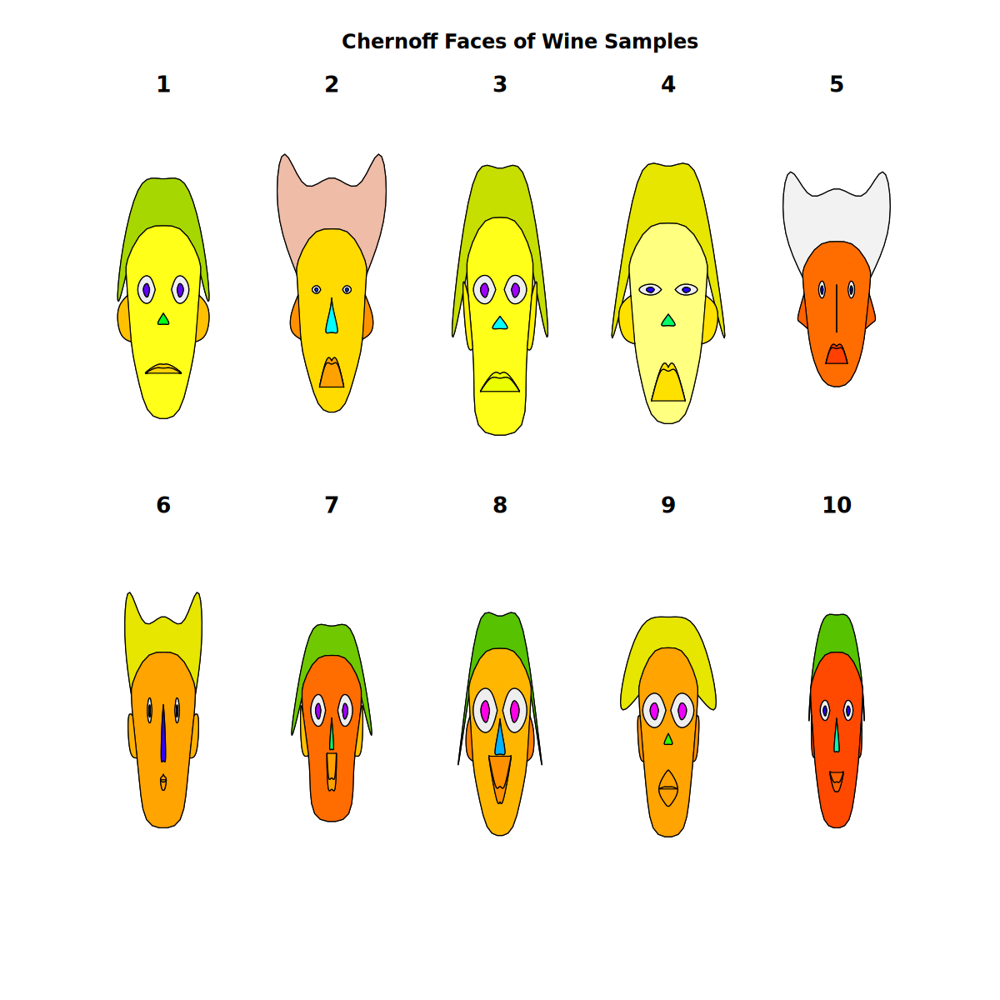

In [104]:
library(aplpack)
red = wine[wine$type == 'red', ]
white = wine[wine$type == 'white', ]

n = 5

manual_sample = rbind(red[1:n, ], white[1:n, ])

faces(manual_sample[,1:12], nrow.plot = 2, ncol.plot = n, main = "Chernoff Faces of Wine Samples",
      print.info = TRUE)

effect of variables:
 modified item       Var                   
 "height of face   " "fixed acidity"       
 "width of face    " "volatile acidity"    
 "structure of face" "citric acid"         
 "height of mouth  " "residual sugar"      
 "width of mouth   " "chlorides"           
 "smiling          " "free sulfur dioxide" 
 "height of eyes   " "total sulfur dioxide"
 "width of eyes    " "density"             
 "height of hair   " "pH"                  
 "width of hair   "  "sulphates"           
 "style of hair   "  "alcohol"             
 "height of nose  "  "quality"             
 "width of nose   "  "fixed acidity"       
 "width of ear    "  "volatile acidity"    
 "height of ear   "  "citric acid"         


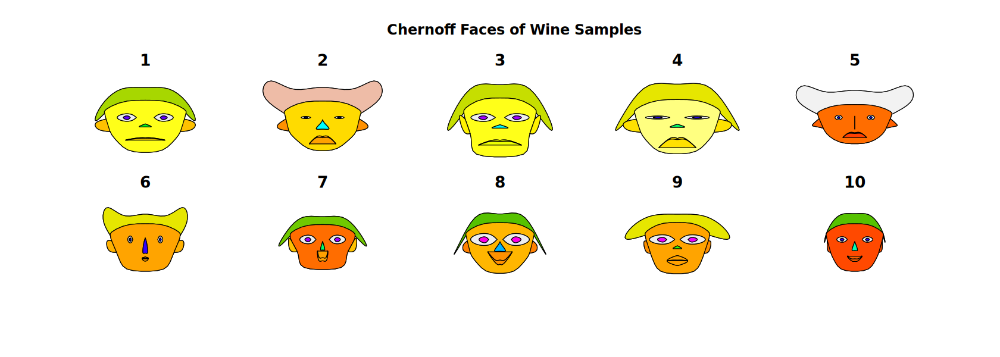

In [109]:
n = 5

manual_sample = rbind(red[1:n, ], white[1:n, ])
m = length(colnames(manual_sample))
faces(manual_sample[,1:m-1], nrow.plot = 2, ncol.plot = n, main = "Chernoff Faces of Wine Samples",
      print.info = TRUE)

### Paralel plots

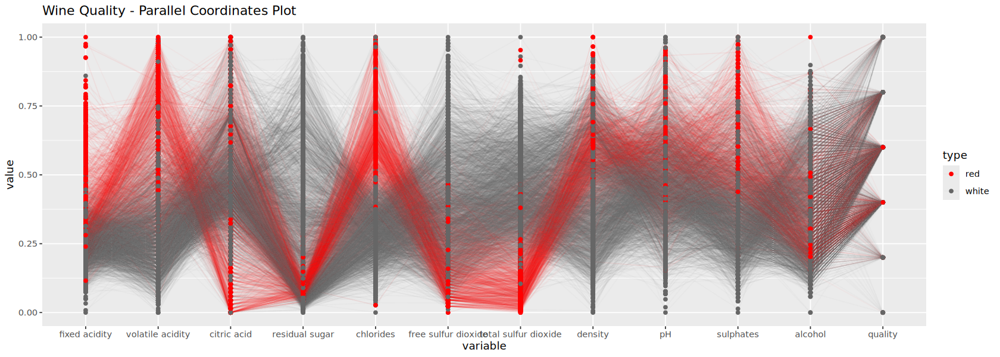

In [110]:
library(GGally)
library(patchwork)
options(repr.plot.width = 14, repr.plot.height = 5)


ggparcoord(wine, columns = 1:12,  
            groupColumn = 13, showPoints = TRUE, 
            title = "Wine Quality - Parallel Coordinates Plot",
            alphaLines = .03, scale = "uniminmax",
) +
   scale_color_manual(
      values = c("red", "gray40")
   )

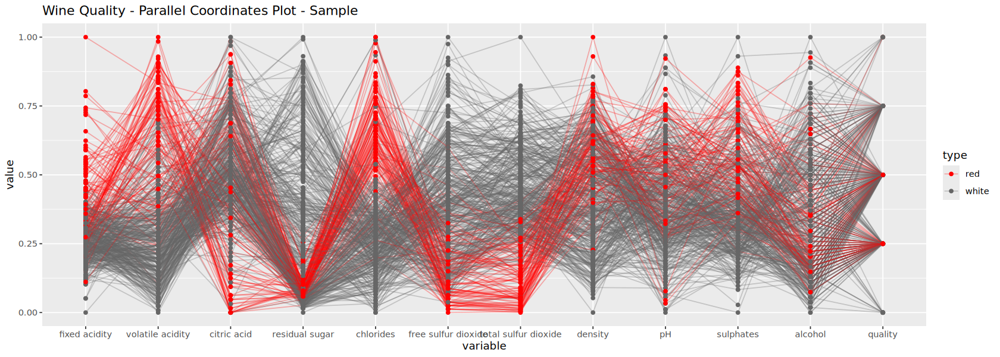

In [107]:
ggparcoord(wine_sample, columns = 1:12,  
            groupColumn = 13, showPoints = TRUE, 
            title = "Wine Quality - Parallel Coordinates Plot - Sample",
            alphaLines = .3, scale = "uniminmax"
#           order = "Outlying"
)  +
   scale_color_manual(
      values = c("red", "gray40")
   )

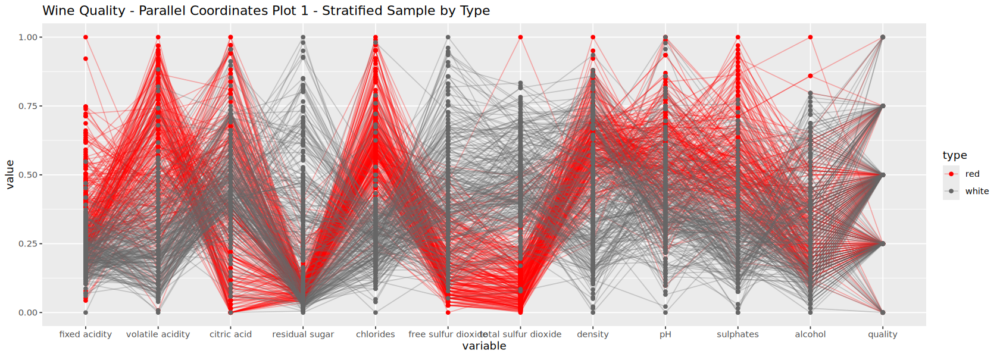

In [108]:
ggparcoord(wine_sample_est, columns = 1:12,  
            groupColumn = 13, showPoints = TRUE, 
            title = "Wine Quality - Parallel Coordinates Plot 1 - Stratified Sample by Type",
            alphaLines = .3, scale = "uniminmax", 
#           order = "Outlying"
) +
   scale_color_manual(
      values = c("red", "gray40")
   )

# PCA

In [ ]:
gral_cor_mat = cor(wine[,1:12])
red_cor_mat = cor(red[,1:12])
white_cor_mat = cor(white[,1:12])

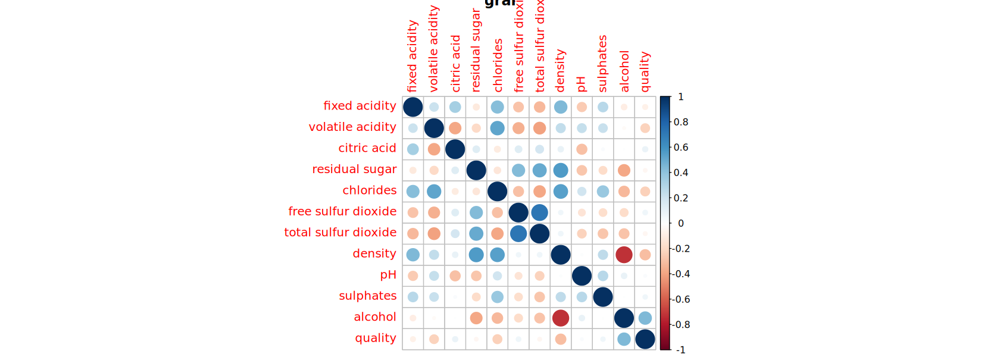

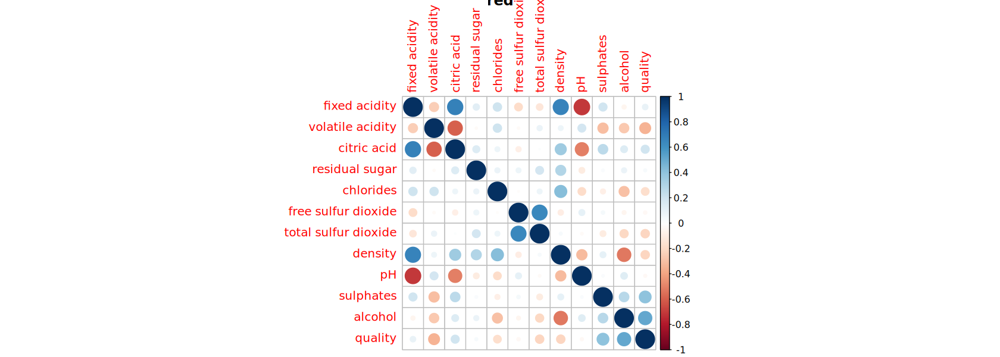

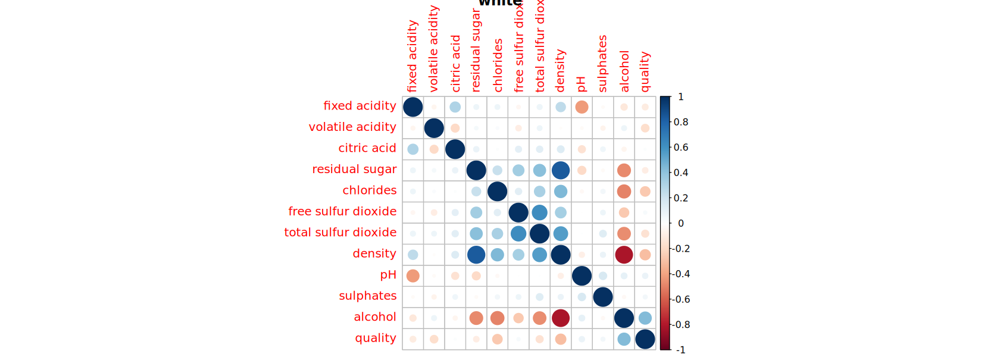

In [114]:
corrplot(gral_cor_mat, main = 'gral')
corrplot(red_cor_mat, main = 'red')
corrplot(white_cor_mat, main = 'white')

### General

#### N-components

In [206]:
data = wine

prin_comp = prcomp(wine[1:12], scale. = TRUE)
summary(prin_comp)

eigenvalues = prin_comp$sdev^2
eigenvalues

Importance of components:
                          PC1    PC2    PC3     PC4     PC5     PC6    PC7
Standard deviation     1.7903 1.6569 1.2717 1.06870 0.88807 0.78665 0.7208
Proportion of Variance 0.2671 0.2288 0.1348 0.09518 0.06572 0.05157 0.0433
Cumulative Proportion  0.2671 0.4959 0.6307 0.72582 0.79154 0.84311 0.8864
                           PC8     PC9    PC10    PC11    PC12
Standard deviation     0.69494 0.57792 0.54325 0.47584 0.15683
Proportion of Variance 0.04024 0.02783 0.02459 0.01887 0.00205
Cumulative Proportion  0.92666 0.95449 0.97908 0.99795 1.00000

[1] 3.20512081 2.74533840 1.61728457 1.14212526 0.78867095 0.61882518
 [7] 0.51956342 0.48293958 0.33399080 0.29511740 0.22642771 0.02459591

##### Scree Plot

Warning message in geom_bar(stat = "identity", fill = barfill, color = barcolor, :
“Ignoring empty aesthetic: `width`.”


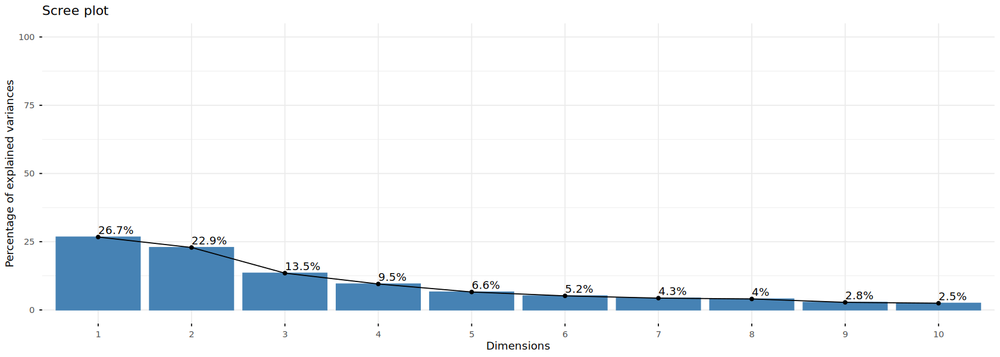

In [ ]:
library(factoextra)
fviz_eig(prin_comp, addlabels = TRUE, ylim = c(0, 100),
   main = "Scree plot")

##### Kaiser Rule

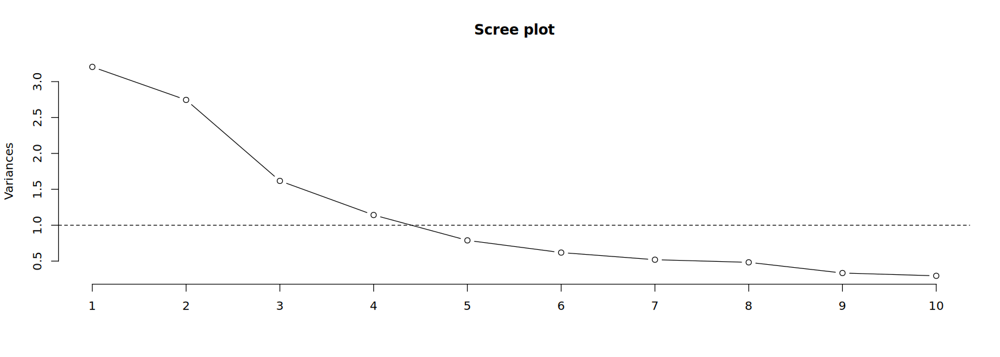

In [171]:
screeplot(prin_comp, type="lines",
   main = "Scree plot")
abline(h = 1, lty = 2)

Kaiser rule indicates that the components is 4

##### Horn Procedure

Parallel analysis suggests that the number of factors =  NA  and the number of components =  4 


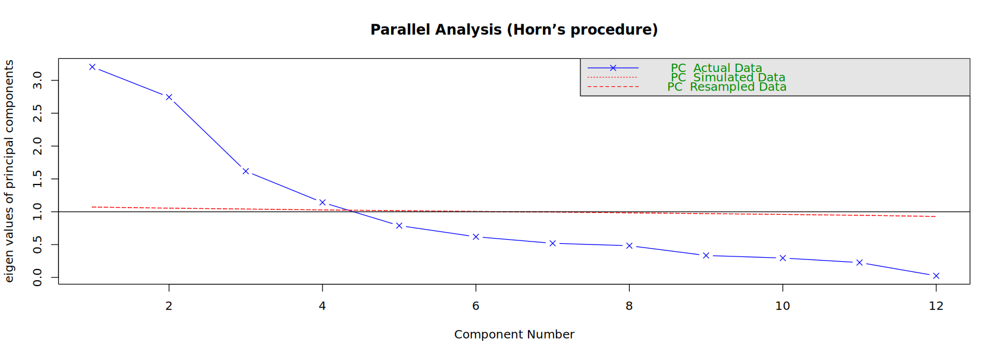

In [174]:
library(psych)

set.seed(123)

fa.parallel(data[1:12], 
            fa = "pc", 
            n.iter = 100,
            show.legend = TRUE,
            main = "Parallel Analysis (Horn’s procedure)"
            )

Horn’s procedure indicates the same that Kaiser rule

##### Decision

In [181]:
library(nFactors)
ap <- parallel(
   subject = nrow(data[,1:12]),
   var     = ncol(data[,1:12]),
   rep     = 100,
   cent    = .05
)
sim_eigen = ap$eigen$qevpea
sim_eigen
num_cp <- nScree(x = eigenvalues,
                  aparallel = sim_eigen,
                  cor = TRUE
                  )
num_cp

[1] 1.0596643 1.0430087 1.0293845 1.0183831 1.0083972 0.9969396 0.9863875
 [8] 0.9747188 0.9613359 0.9481606 0.9344573 0.9099137

$Components
  noc naf nparallel nkaiser
1   4   2         4       4

$Analysis
   Eigenvalues        Prop      Cumu Par.Analysis  Pred.eig     OC  Acc.factor
1   3.20512081 0.267093401 0.2670934    1.0596643 3.0174126                 NA
2   2.74533840 0.228778200 0.4958716    1.0430087 1.7942500        -0.66827142
3   1.61728457 0.134773714 0.6306453    1.0293845 1.2818164         0.65289453
4   1.14212526 0.095177105 0.7258224    1.0183831 0.8978245 (< OC)  0.12170499
5   0.78867095 0.065722579 0.7915450    1.0083972 0.7178634         0.18360854
6   0.61882518 0.051568765 0.8431138    0.9969396 0.6185569         0.07058401
7   0.51956342 0.043296952 0.8864107    0.9863875 0.5975255         0.06263792
8   0.48293958 0.040244965 0.9266557    0.9747188 0.4371224        -0.11232492
9   0.33399080 0.027832567 0.9544882    0.9613359 0.4303781         0.11007537
10  0.29511740 0.024593117 0.9790814    0.9481606 0.4282595        -0.02981629
11  0.22642771 0.018868976 0.9979503    0.9344573   

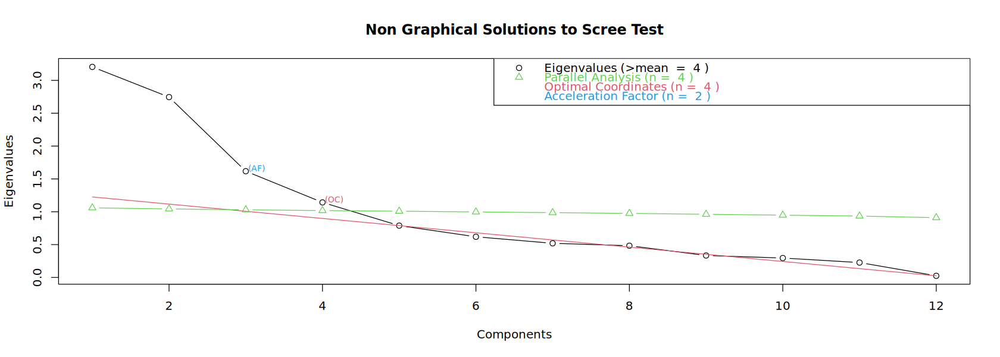

In [182]:
plotnScree(num_cp)

Four principal components decided

In [208]:
n_pc = 4

#### Loadings

In [222]:
loadings = prin_comp$rotation
main_load = as.data.frame(loadings[, 1:n_pc])
main_load

,PC1,PC2,PC3,PC4
,<dbl>,<dbl>,<dbl>,<dbl>
fixed acidity,-0.270494626,-0.20378043,-0.533229367,0.08097901
volatile acidity,-0.396315341,-0.05548604,0.234573541,0.11721037
citric acid,0.147037931,-0.11428248,-0.600386923,-0.11149086
residual sugar,0.267702251,-0.38728359,0.057035848,-0.10768800
chlorides,-0.414356428,-0.25035384,0.018850953,-0.08141010
free sulfur dioxide,0.393464675,-0.17702891,0.122648386,-0.28229939
total sulfur dioxide,0.435054569,-0.21318914,0.126179011,-0.11317239
density,-0.152020645,-0.54772453,-0.003683727,-0.16124441
pH,-0.205903613,0.13300925,0.410776120,-0.47426205


PC1: ``sulfure dioxide`` (both total and free)/``chloride``/``volatile acidity`` component

PC2: ``density``/``alcohol``/``residual sugar`` component

PC3: ``fixed acidity``/``critic acid``/``ph`` component

PC4: ``suphates``/``quality``/``ph`` component


#### Visualitation

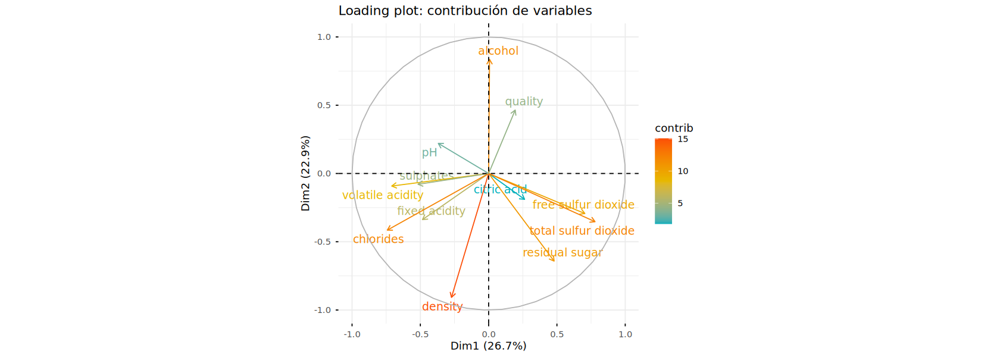

In [223]:
fviz_pca_var(princ_comp,
            col.var = "contrib",
            gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"),
            repel = TRUE,
            title = "Loading plot: contribución de variables"
)

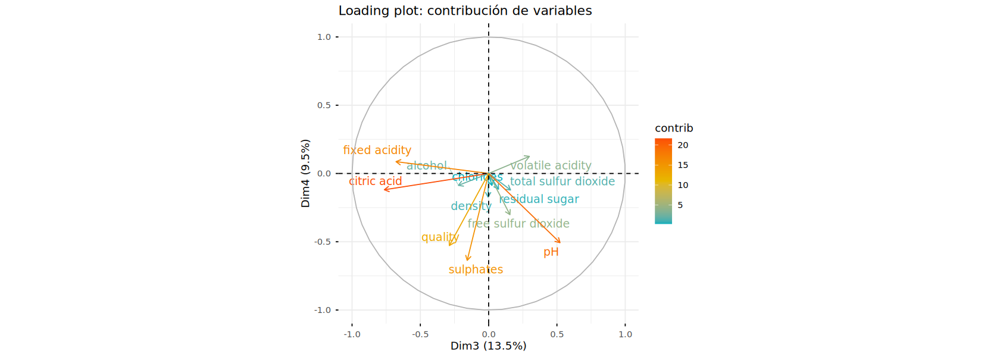

In [225]:
fviz_pca_var(princ_comp,
            axes = c(3,4),
            col.var = "contrib",
            gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"),
            repel = TRUE,
            title = "Loading plot: contribución de variables"
)

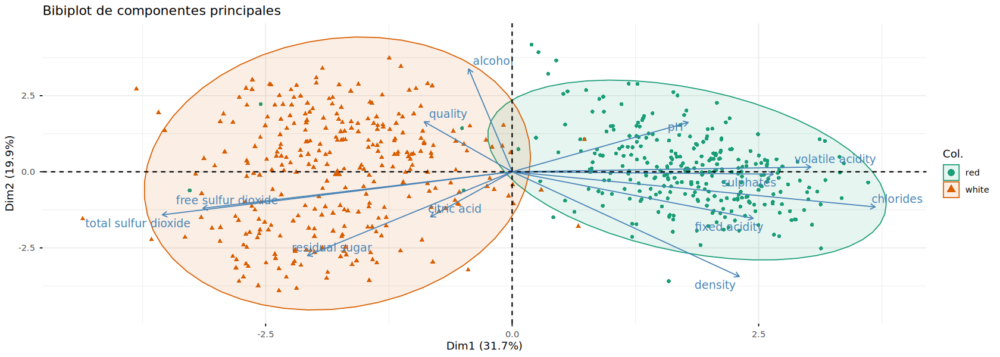

In [234]:
set.seed(123)
sample = data %>% group_by(type) %>% slice_sample(n = 300) %>% ungroup()

sample_pc = prcomp(sample[,1:12], scale. = TRUE)

type = sample$type
fviz_pca_biplot(sample_pc,
               repel = TRUE,
               col.ind = type,
               palette = "Dark2",
               # col.var = "firebrick",
               geom.ind = "point",
               addEllipses = T,
               label = "var",
               title = "Bibiplot de componentes principales"
               )



### Red

#### N-components

In [262]:
data = red

prin_comp = prcomp(data[1:12], scale. = TRUE)
summary(prin_comp)

eigenvalues = prin_comp$sdev^2
eigenvalues

Importance of components:
                         PC1    PC2    PC3     PC4     PC5    PC6    PC7
Standard deviation     1.735 1.5941 1.2931 1.02594 0.96138 0.8709 0.7930
Proportion of Variance 0.251 0.2118 0.1393 0.08771 0.07702 0.0632 0.0524
Cumulative Proportion  0.251 0.4627 0.6021 0.68980 0.76682 0.8300 0.8824
                           PC8     PC9    PC10   PC11   PC12
Standard deviation     0.69132 0.61293 0.57487 0.4143 0.2349
Proportion of Variance 0.03983 0.03131 0.02754 0.0143 0.0046
Cumulative Proportion  0.92225 0.95356 0.98110 0.9954 1.0000

[1] 3.01183069 2.54115383 1.67208444 1.05255917 0.92424267 0.75840333
 [7] 0.62879834 0.47792308 0.37568775 0.33047736 0.17165529 0.05518406

##### Scree Plot

Warning message in geom_bar(stat = "identity", fill = barfill, color = barcolor, :
“Ignoring empty aesthetic: `width`.”


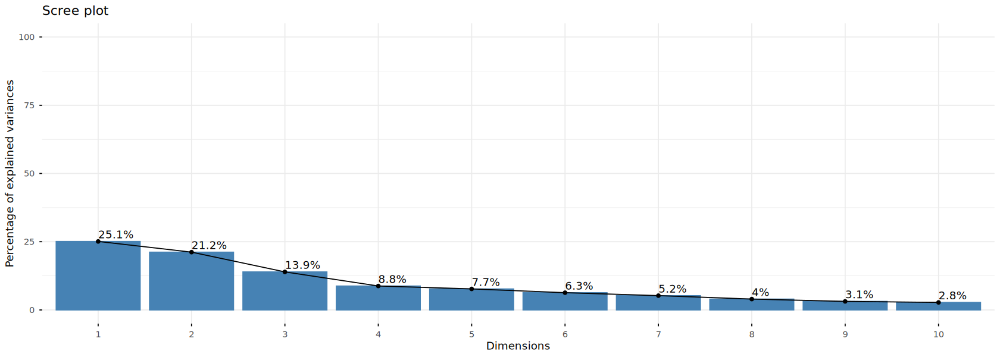

In [263]:
fviz_eig(prin_comp, addlabels = TRUE, ylim = c(0, 100),
   main = "Scree plot")

##### Kaiser Rule

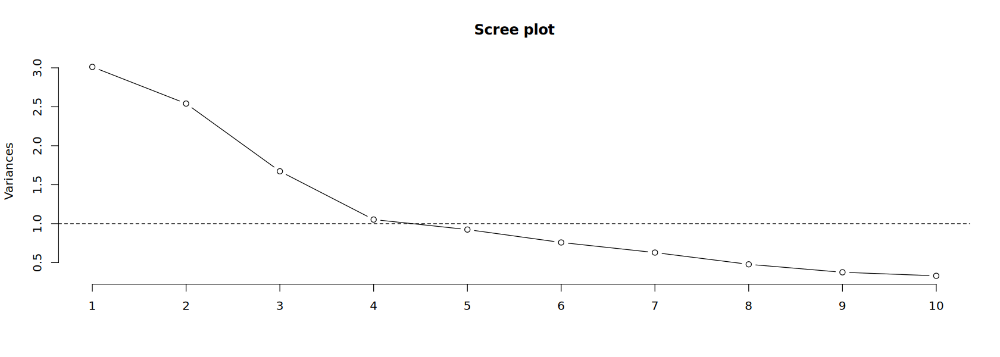

In [264]:
screeplot(prin_comp, type="lines",
   main = "Scree plot")
abline(h = 1, lty = 2)

Kaiser rule indicates that the components is 4

##### Horn Procedure

Warning message in fa.stats(r = r, f = f, phi = phi, n.obs = n.obs, np.obs = np.obs, :
“The estimated weights for the factor scores are probably incorrect.  Try a different factor score estimation method.”


Parallel analysis suggests that the number of factors =  NA  and the number of components =  3 


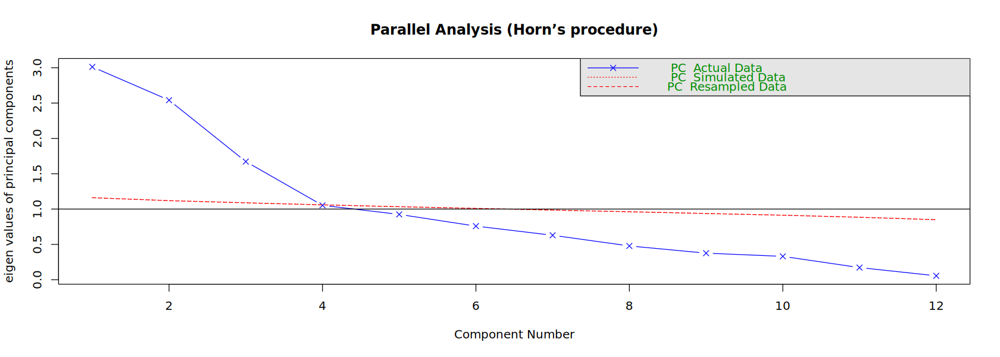

In [265]:
set.seed(123)

fa.parallel(data[1:12], 
            fa = "pc", 
            n.iter = 100,
            show.legend = TRUE,
            main = "Parallel Analysis (Horn’s procedure)"
            )

Horn’s procedure indicates 1 less than Kaiser rule

##### Decision

In [266]:
library(nFactors)
ap <- parallel(
   subject = nrow(data[,1:12]),
   var     = ncol(data[,1:12]),
   rep     = 100,
   cent    = .05
)
sim_eigen = ap$eigen$qevpea
sim_eigen
num_cp <- nScree(x = eigenvalues,
                  aparallel = sim_eigen,
                  cor = TRUE
                  )
num_cp

[1] 1.1265208 1.0912086 1.0664937 1.0362806 1.0183137 0.9932514 0.9675977
 [8] 0.9442709 0.9166079 0.8887377 0.8627130 0.8137593

$Components
  noc naf nparallel nkaiser
1   4   3         4       4

$Analysis
   Eigenvalues        Prop      Cumu Par.Analysis  Pred.eig     OC  Acc.factor
1   3.01183069 0.250985891 0.2509859    1.1265208 2.7897508                 NA
2   2.54115383 0.211762819 0.4627487    1.0912086 1.8517400        -0.39839253
3   1.67208444 0.139340370 0.6020891    1.0664937 1.1772311         0.24954411
4   1.05255917 0.087713264 0.6898023    1.0362806 1.0483939 (< OC)  0.49120878
5   0.92424267 0.077020223 0.7668226    1.0183137 0.8756065        -0.03752285
6   0.75840333 0.063200277 0.8300228    0.9932514 0.7435212         0.03623436
7   0.62879834 0.052399861 0.8824227    0.9675977 0.5836078        -0.02127027
8   0.47792308 0.039826923 0.9222496    0.9442709 0.4825223         0.04863993
9   0.37568775 0.031307313 0.9535569    0.9166079 0.4681240         0.05702493
10  0.33047736 0.027539780 0.9810967    0.8887377 0.2881265        -0.11361168
11  0.17165529 0.014304607 0.9954013    0.8627130   

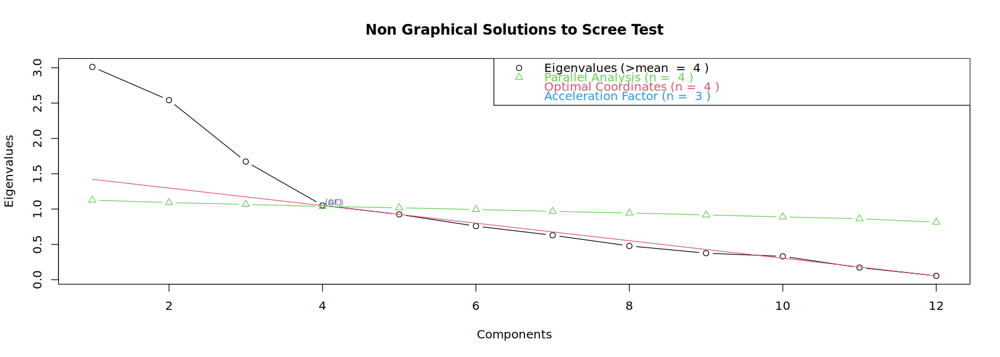

In [267]:
plotnScree(num_cp)

Four principal components decided

In [268]:
n_pc = 4

#### Loadings

In [269]:
loadings = prin_comp$rotation
main_load = as.data.frame(loadings[, 1:n_pc])
main_load

,PC1,PC2,PC3,PC4
,<dbl>,<dbl>,<dbl>,<dbl>
fixed acidity,0.52508605,0.06784177,-0.06839194,0.06752981
volatile acidity,-0.26498956,0.34455741,-0.18805699,-0.29816032
citric acid,0.48058020,-0.12062456,0.13741175,0.19118528
residual sugar,0.14454716,0.07288584,0.26731972,-0.59483393
chlorides,0.15004547,0.33919525,-0.05873013,-0.28153011
free sulfur dioxide,-0.12086854,0.08227864,0.65930971,0.08144334
total sulfur dioxide,-0.07142022,0.22965341,0.63515351,0.12113522
density,0.37293267,0.35896186,-0.03964643,-0.28257180
pH,-0.41366740,-0.10251507,0.00410325,-0.34024066


PC1: ``fixed acidity``/``critic acid``/``ph``/``density`` component similar to PC3 in the general set

PC2: ``density``/``alcohol``/``quality``/``chlorides`` component

PC3: ``sulfure dioxide`` (both total and free) component

PC4: ``suphates``/``residual sugar``/``ph`` component similar to PC4 in the general set


#### Visualitation

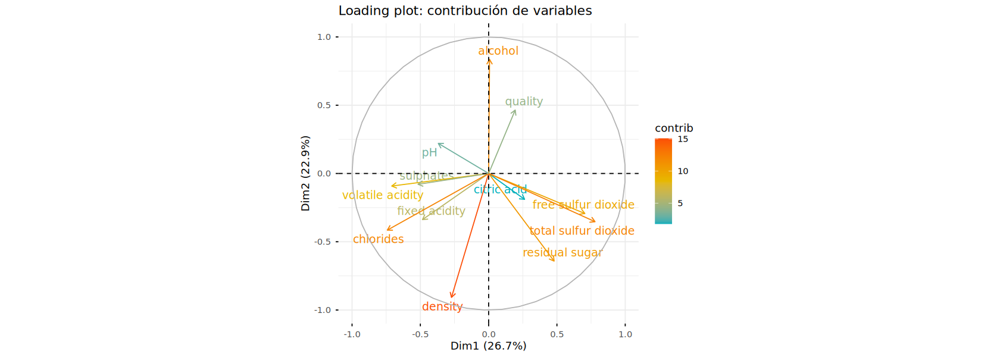

In [270]:
fviz_pca_var(princ_comp,
            col.var = "contrib",
            gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"),
            repel = TRUE,
            title = "Loading plot: contribución de variables"
)

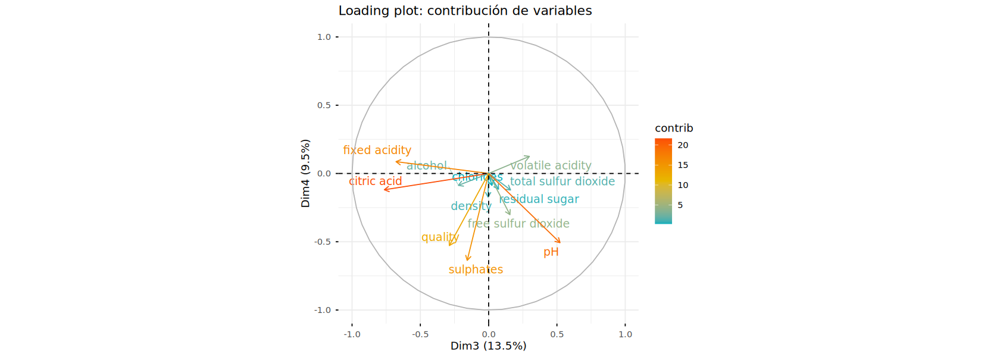

In [271]:
fviz_pca_var(princ_comp,
            axes = c(3,4),
            col.var = "contrib",
            gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"),
            repel = TRUE,
            title = "Loading plot: contribución de variables"
)

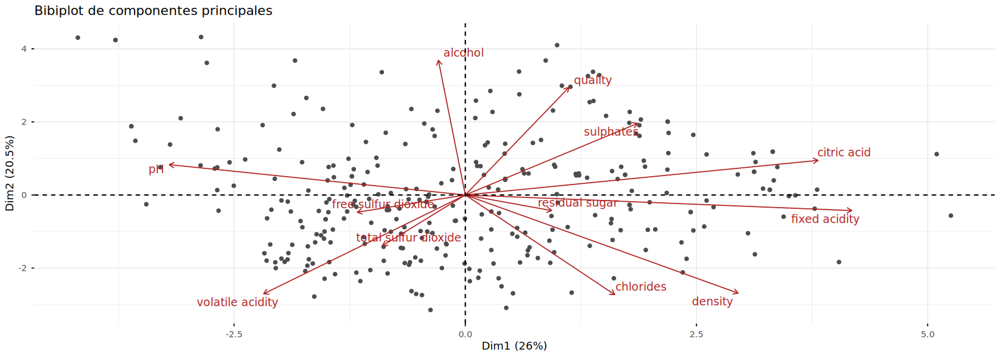

In [272]:
set.seed(123)
sample = data %>% group_by(type) %>% slice_sample(n = 300) %>% ungroup()

sample_pc = prcomp(sample[,1:12], scale. = TRUE)


fviz_pca_biplot(sample_pc,
               repel = TRUE,
               # col.ind = type,
               col.ind = "gray30",
               # palette = "Dark2",
               col.var = "firebrick",
               geom.ind = "point",
               # addEllipses = T,
               label = "var",
               title = "Bibiplot de componentes principales"
               )



### White

#### N-components

In [273]:
data = white

prin_comp = prcomp(data[1:12], scale. = TRUE)
summary(prin_comp)

eigenvalues = prin_comp$sdev^2
eigenvalues

Importance of components:
                          PC1    PC2    PC3     PC4     PC5     PC6     PC7
Standard deviation     1.8795 1.2653 1.2016 1.05039 0.97448 0.89960 0.84724
Proportion of Variance 0.2944 0.1334 0.1203 0.09194 0.07913 0.06744 0.05982
Cumulative Proportion  0.2944 0.4278 0.5481 0.64007 0.71921 0.78665 0.84646
                           PC8     PC9    PC10    PC11    PC12
Standard deviation     0.81115 0.74507 0.57506 0.53349 0.11842
Proportion of Variance 0.05483 0.04626 0.02756 0.02372 0.00117
Cumulative Proportion  0.90129 0.94756 0.97511 0.99883 1.00000

[1] 3.53256295 1.60108786 1.44390626 1.10332311 0.94960627 0.80927721
 [7] 0.71780953 0.65795711 0.55513215 0.33069774 0.28461565 0.01402416

##### Scree Plot

Warning message in geom_bar(stat = "identity", fill = barfill, color = barcolor, :
“Ignoring empty aesthetic: `width`.”


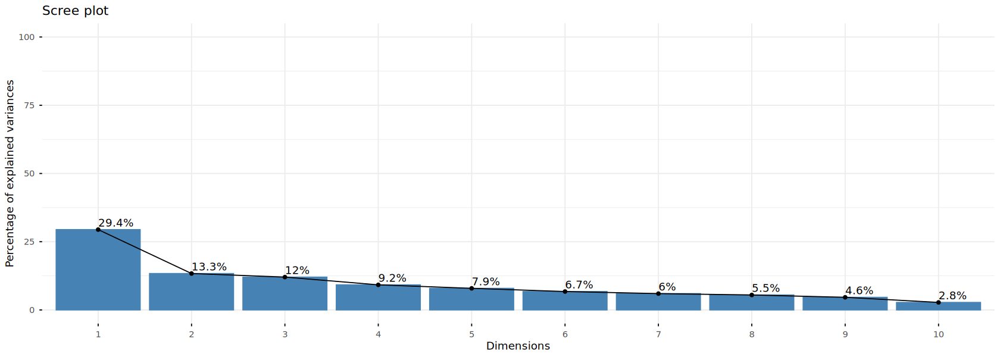

In [274]:
fviz_eig(prin_comp, addlabels = TRUE, ylim = c(0, 100),
   main = "Scree plot")

##### Kaiser Rule

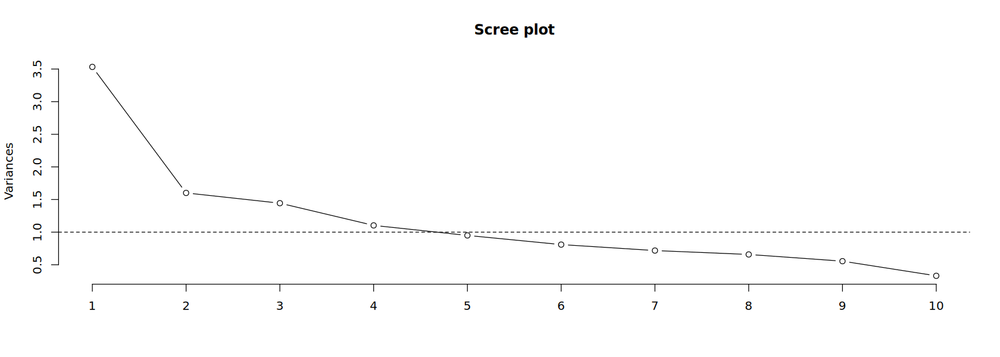

In [275]:
screeplot(prin_comp, type="lines",
   main = "Scree plot")
abline(h = 1, lty = 2)

Kaiser rule indicates that the components is 4

##### Horn Procedure

Warning message in fa.stats(r = r, f = f, phi = phi, n.obs = n.obs, np.obs = np.obs, :
“The estimated weights for the factor scores are probably incorrect.  Try a different factor score estimation method.”
Warning message in fac(r = r, nfactors = nfactors, n.obs = n.obs, rotate = rotate, :
“An ultra-Heywood case was detected.  Examine the results carefully”


Parallel analysis suggests that the number of factors =  NA  and the number of components =  4 


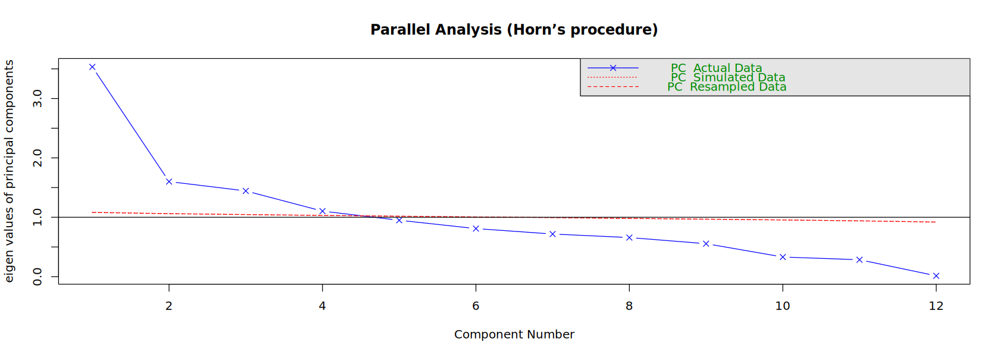

In [276]:
set.seed(123)

fa.parallel(data[1:12], 
            fa = "pc", 
            n.iter = 100,
            show.legend = TRUE,
            main = "Parallel Analysis (Horn’s procedure)"
            )

Horn’s procedure indicates the same that Kaiser rule

##### Decision

In [277]:
library(nFactors)
ap <- parallel(
   subject = nrow(data[,1:12]),
   var     = ncol(data[,1:12]),
   rep     = 100,
   cent    = .05
)
sim_eigen = ap$eigen$qevpea
sim_eigen
num_cp <- nScree(x = eigenvalues,
                  aparallel = sim_eigen,
                  cor = TRUE
                  )
num_cp

[1] 1.0685057 1.0506570 1.0331812 1.0190887 1.0091030 0.9974950 0.9829755
 [8] 0.9708388 0.9586404 0.9418802 0.9254402 0.9064674

$Components
  noc naf nparallel nkaiser
1   1   1         4       4

$Analysis
   Eigenvalues       Prop      Cumu Par.Analysis  Pred.eig     OC  Acc.factor
1   3.53256295 0.29438025 0.2943802    1.0685057 1.7597942 (< OC)          NA
2   1.60108786 0.13342399 0.4278042    1.0506570 1.6027820         1.77429350
3   1.44390626 0.12032552 0.5481298    1.0331812 1.2394855        -0.18340154
4   1.10332311 0.09194359 0.6400733    1.0190887 1.0832609         0.18686630
5   0.94960627 0.07913386 0.7192072    1.0091030 0.9418194         0.01338778
6   0.80927721 0.06743977 0.7866470    0.9974950 0.8585666         0.04886138
7   0.71780953 0.05981746 0.8464644    0.9829755 0.8189404         0.03161527
8   0.65795711 0.05482976 0.9012942    0.9708388 0.7355015        -0.04297255
9   0.55513215 0.04626101 0.9475552    0.9586404 0.4890345        -0.12160944
10  0.33069774 0.02755815 0.9751133    0.9418802 0.5552071         0.17835231
11  0.28461565 0.02371797 0.9988313    0.9254402        NA     

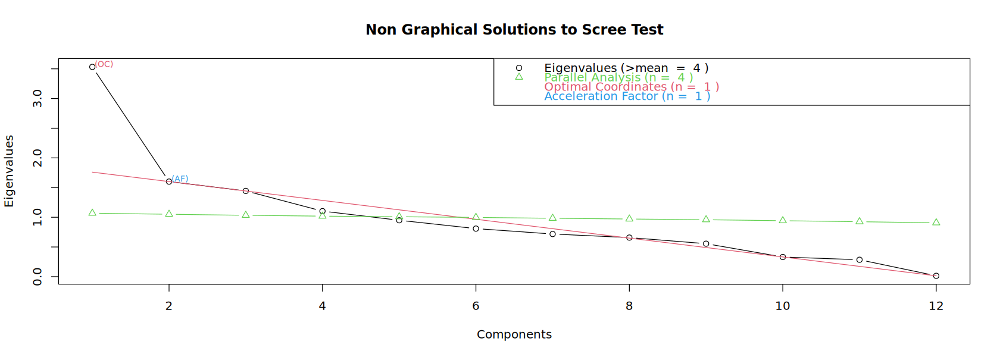

In [278]:
plotnScree(num_cp)

Four principal components decided

In [279]:
n_pc = 4

#### Loadings

In [280]:
loadings = prin_comp$rotation
main_load = as.data.frame(loadings[, 1:n_pc])
main_load

,PC1,PC2,PC3,PC4
,<dbl>,<dbl>,<dbl>,<dbl>
fixed acidity,0.138275434,-0.596736071,-0.09184031,-0.10452425
volatile acidity,-0.002501822,0.076680828,0.46973300,0.34973297
citric acid,0.107147477,-0.348973546,-0.43525197,-0.20564618
residual sugar,0.397390208,0.009724947,-0.04138741,0.32551432
chlorides,0.300963934,0.066175188,0.22608397,-0.32732426
free sulfur dioxide,0.275859043,0.254652345,-0.38576922,0.33599649
total sulfur dioxide,0.383797995,0.220333943,-0.17851042,0.15452082
density,0.495923414,-0.001029351,0.03063072,-0.01175453
pH,-0.103337118,0.579564988,-0.03019779,-0.27130024


PC1: ``density``/``alcohol``/``residual sugar``/``total sulfur dioxide`` component similar to PC2 in the general dataset

PC2: ``fixed acidity``/``cirtic acid``/``ph`` component similar to PC3 in the general set

PC3: ``free sulfure dioxide``/``quality``/``volatile acidity``/``citric acid`` component

PC4: ``suphates``/``volatile acidity``/``chlorides``/``free sulfure dioxide`` component


#### Visualitation

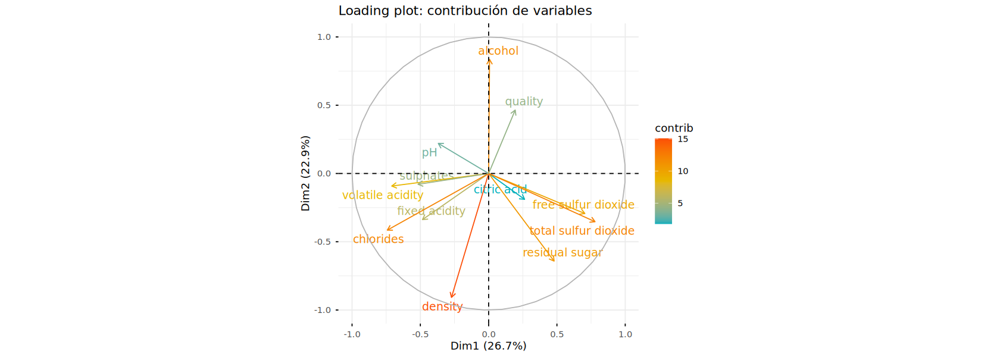

In [281]:
fviz_pca_var(princ_comp,
            col.var = "contrib",
            gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"),
            repel = TRUE,
            title = "Loading plot: contribución de variables"
)

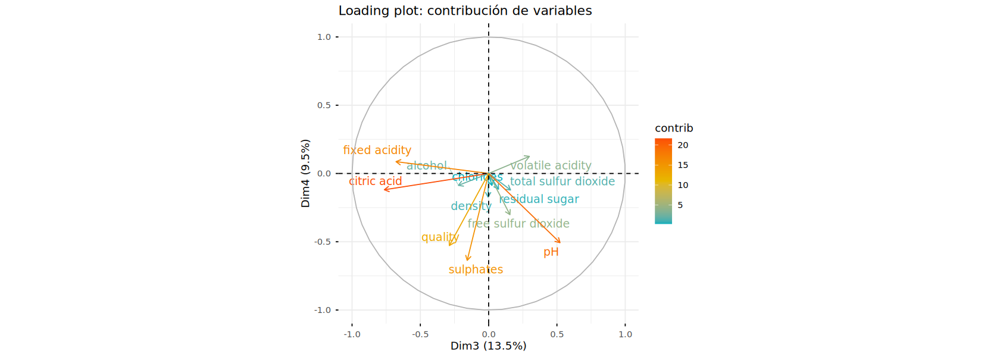

In [282]:
fviz_pca_var(princ_comp,
            axes = c(3,4),
            col.var = "contrib",
            gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"),
            repel = TRUE,
            title = "Loading plot: contribución de variables"
)

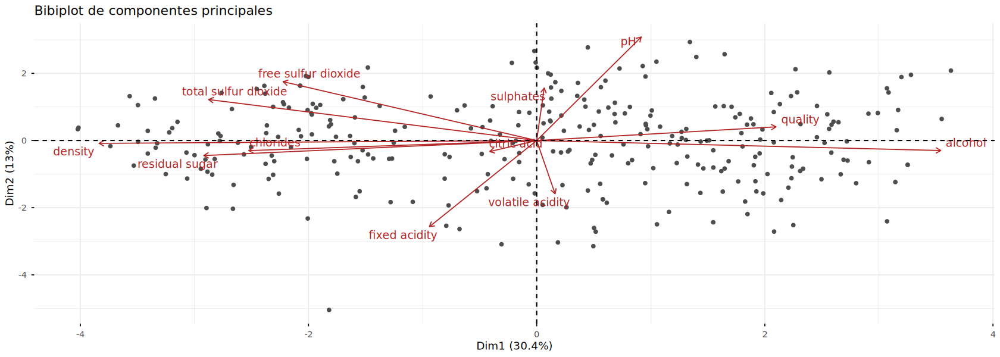

In [284]:
set.seed(123)
sample = data %>% group_by(type) %>% slice_sample(n = 300) %>% ungroup()

sample_pc = prcomp(sample[,1:12], scale. = TRUE)


fviz_pca_biplot(sample_pc,
               repel = TRUE,
               # col.ind = type,
               col.ind = "gray30",
               # palette = "Dark2",
               col.var = "firebrick",
               geom.ind = "point",
               # addEllipses = T,
               label = "var",
               title = "Bibiplot de componentes principales"
               )




# Clustering